## pip, install

In [3]:
!pip install ydata_profiling
!pip install category_encoders
!pip install scikeras

In [4]:
import pandas as pd
from ydata_profiling import ProfileReport
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasRegressor

from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.linear_model import LinearRegression, Ridge, Lasso, QuantileRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OneHotEncoder, FunctionTransformer, StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.cluster import KMeans
from sklearn.cluster import SpectralClustering

from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, mean_pinball_loss
from sklearn.metrics import mean_squared_error, r2_score, make_scorer

from sklearn.ensemble import RandomForestClassifier

from sklearn.decomposition import PCA

from category_encoders import BinaryEncoder

import scipy as sp
from scipy.stats import zscore
from scipy.stats import shapiro
from scipy.stats import kstest, norm
from scipy.stats import entropy
from scipy.stats import chi2_contingency
from scipy.stats import pointbiserialr

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import statsmodels.api as sm
from statsmodels.api import OLS

from patsy import dmatrix

from google.colab import auth
from google.colab import drive
auth.authenticate_user()

import warnings

drive.mount('/content/gdrive')
path = '/content/gdrive/My Drive/Colab Notebooks/study/linear regression/'

Mounted at /content/gdrive


## 목표
### 1. 데이터에서 얻을 수 있는 insight는 무엇이 있을까?
### 2. 사용 모델의 종류 및 metric은 어떻게 설정해야 할까?
### 3. feature및 종속변수를 어떻게 사용해야 할까?
### 4. 모델 빌딩
### 5. 모델 평가
### 6. 어떤 데이터가 추가되면 좋을까?

#### background

[링크 텍스트](https://eurohealthobservatory.who.int/publications/i/united-states-health-system-review-2020)
Most Americans receive their coverage from private health insurance while two major federal government health insurance programmes, Medicare and Medicaid, offer coverage for seniors and some of the disabled, and healthcare services for some of the poor and near-poor, respectively. Nevertheless, and unusually for high-income countries, almost 10% of the population remains uninsured;

[ISPOR](https://www.ispor.org/heor-resources/more-heor-resources/us-healthcare-system-overview/us-healthcare-system-overview-background-page-1)
As of 2019, around 50% of citizens received private insurance coverage through their employer (group insurance), 6% received private insurance through health insurance marketplaces (nongroup insurance) (discussed here), 20% of citizens relied on Medicaid, 14% on Medicare, and 1% on other public forms of insurance

healthcare financing by patients with health insurance often includes copayments (fixed cost for a medical service or product) or coinsurance (a proportion of the total cost of the medical service or product)
정신 건강 서비스, 치과 치료, 안과 치료 등은 별도 보험이 필요하거나 제한적으로만 포함됩니다.

[링크 텍스트](https://www.kff.org/report-section/ehbs-2019-section-1-cost-of-health-insurance/)
In 2019, the average annual premiums are 7,188 for single coverage and 20,576 for family coverage.

## 1. 데이터에서 얻을 수 있는 insight는 무엇이 있을까?

- 흡연 여부와 보험 청구 비용은 유의미하게 큰 상관관게가 있다
- bmi나 bmi를 카테고리로 나눈 변수와 청구 비용의 상관관계 및 회귀계수는 작다
- 제공된 데이터는 charge-age 관계에서 확인 할 수 있는 군집을 형성하기 불충분하다
- 부양가족 수는 청구 비용과 약한 양의 상관관계가 있지만, 보험 가입자의 평균 청구 비용(charges / total_people)과는 유의미하게 큰 음의 상관관계가 있다
- 성별 영향력은 매우 작다
- 지역의 영향력은 매우 작지만, 전반적으로 남쪽(southeast, southwest) 지역이 북쪽보다 청구 비용이 낮다
- 나이와 청구 비용의 상관관계는 크지만, 회귀계수는 매우 작다

### data 확인 및 cleansing

- 중복 제거
- z-score를 사용하여 간단하게 이상치 확인

In [5]:
train = pd.read_csv(path + 'insurance.csv')

In [6]:
profile1 = ProfileReport(train, title="Profiling Report :: medical cost personal dataset")
profile1

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

0. 데이터 null값 없음

1. age(numeric) : age of primary beneficiary
- 거의 균등분포이지만, 18, 19세가 많은 모습을 보인다. 하지만, 사회 초년생을 타켓으로 한 보험사라고 하거나 사회 초년생에게 더 많은 의료비 청구가 있었다고 하기는 어려울 것 같다. 일단 수집한 데이터에서의 특성 정도로 넘어간다
2. sex(categorical) : insurance contractor gender, female, male
- 균등 분포
3. bmi(numeric) : Body mass index, providing an understanding of body, weights that are relatively high or low relative to height,
objective index of body weight (kg / m ^ 2) using the ratio of height to weight, ideally 18.5 to 24.9
- 거의 정규분포의 꼴
4. children(numeric) : Number of children covered by health insurance / Number of dependents
 - 파생변수를 만들어 낼 수 있을 것 같음 (아래 CPP)
 - categorical로 볼 지 numeric으로 볼 지 확인해봐야 한다

5. smoker(categorical) : Smoking
- charge와 상관관계가 매우 높게 나오는데, 데이터 불균형이 보임(비흡연자가 많음)
- 중요한 독립변수인 만큼 오버샘플링/언더샘플링을 고려해보자

6. region(categorical) : the beneficiary's residential area in the US, northeast, southeast, southwest, northwest.

- 균등하게 분포. 미국 지역에 따른 식습관/의료비용/의료 시설 수준/보험사 등 여러 요인으로 인해 종속변수에 영향을 미칠 수 있지만, 범위가 너무 크게 나눠져 있음

7. charges(numeric) :  Individual medical costs billed by health insurance (의료비용을 커버하기 위해 보험사에 청구된 실제 금액을 의미합니다. 이 값은 가입자가 실제로 병원에 간 후 발생한 비용으로, 그 금액은 보험사가 부담하게 됩니다.)
- 정규분포 형태로 변환해야 할 듯 (log scaling)



완벽하게 중복되는 항목은 전산상 오류라고 가정

In [7]:
print(train[train.duplicated()])

train.drop_duplicates(inplace=True)

     age   sex    bmi  children smoker     region    charges
581   19  male  30.59         0     no  northwest  1639.5631


In [8]:
# 'sex'와 'smoker'에 대해 One-Hot Encoding을 미리 진행
train = pd.get_dummies(train, columns=['sex', 'smoker'], drop_first=True)

In [9]:
train.head(2)

,age,bmi,children,region,charges,sex_male,smoker_yes
0,19,27.90,0,southwest,16884.9240,False,True
1,18,33.77,1,southeast,1725.5523,True,False


z-score를 확인해 numeric 변수 이상치 확인

In [10]:
# BMI 컬럼의 Z-score 계산
train_cpp = train.copy()
train_cpp['bmi_zscore'] = zscore(train_cpp['bmi'])

# Z-score가 3을 넘어가는 값 확인
outliers = train_cpp[train_cpp['bmi_zscore'].abs() > 3]

# Z-score가 3을 넘는 값의 개수와 인덱스 출력
outlier_count = len(outliers)
print(f"Z-score가 3을 넘는 값의 개수: {outlier_count}")
print(outliers[['bmi', 'bmi_zscore']])

Z-score가 3을 넘는 값의 개수: 4
        bmi  bmi_zscore
116   49.06    3.016724
847   50.38    3.233182
1047  52.58    3.593945
1317  53.13    3.684136


BMI의 경우 전체 데이터의 0.3% 정도에 해당하는 값들만 Z-score가 3보다 큰 것으로 판별된다. 이상치의 비율이 매우 낮기 때문에, 이를 그대로 유지해도 모델 성능에 큰 영향을 미치지 않을 것 같다. 일단 bmi가 49를 넘어가는 경우 Z-score가 3을 넘는다는 점만 기억하고 넘어가자

In [11]:
# 'charges'에 로그 스케일링 적용
train_cpp['charges'] = np.log1p(train_cpp['charges'])

train_cpp['log_charge_zscore'] = zscore(train_cpp['charges'])

# Z-score가 3을 넘어가는 값 확인
outliers = train_cpp[train_cpp['log_charge_zscore'].abs() > 3]

# Z-score가 3을 넘는 값의 개수와 인덱스 출력
outlier_count = len(outliers)
print(f"Z-score가 3을 넘는 값의 개수: {outlier_count}")
print(outliers[['charges', 'log_charge_zscore']])

Z-score가 3을 넘는 값의 개수: 0
Empty DataFrame
Columns: [charges, log_charge_zscore]
Index: []


가장 중요한 종속변수의 경우 Z-score가 3을 넘는 경우는 없었다. 나머지 변수들은 카테고리 변수이거나 균등분포에 가깝기 때문에 data cleansing 단게에서는 이상치 판별을 하지 않는다

### simple linear regression

- smoker의 회귀계수가 매우 큰 모습을 확인
- region의 encoding 방식에 대해 고민 필요

In [12]:
# 'region'에 대해 Binary Encoding 적용
train_mod = train.copy()
encoder = BinaryEncoder(cols=['region'])
train_mod = encoder.fit_transform(train_mod)

# 'charges'에 로그 스케일링 적용
train_mod['charges'] = np.log1p(train_mod['charges'])

train_mod.head()

,age,bmi,children,region_0,region_1,region_2,charges,sex_male,smoker_yes
0,19,27.900,0,0,0,1,9.734236,False,True
1,18,33.770,1,0,1,0,7.453882,True,False
2,28,33.000,3,0,1,0,8.400763,True,False
3,33,22.705,0,0,1,1,9.998137,True,False
4,32,28.880,0,0,1,1,8.260455,True,False


In [13]:
# 피처와 타겟 변수 분리
X = train_mod.drop('charges', axis=1)
y = train_mod['charges']

# 데이터 분할 (훈련 세트와 테스트 세트)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 선형 회귀 모델 생성 및 훈련
model = LinearRegression()
model.fit(X_train, y_train)

# 예측 수행
y_pred = model.predict(X_test)

# 모델 성능 평가
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

# 회귀 계수 확인
coefficients = pd.DataFrame(model.coef_, X.columns, columns=['Coefficient'])
print(coefficients)

Mean Squared Error: 0.1582247225342882
R^2 Score: 0.8294786261333561
            Coefficient
age            0.033990
bmi            0.013149
children       0.099139
region_0       0.186137
region_1       0.057575
region_2       0.084913
sex_male      -0.076769
smoker_yes     1.537330


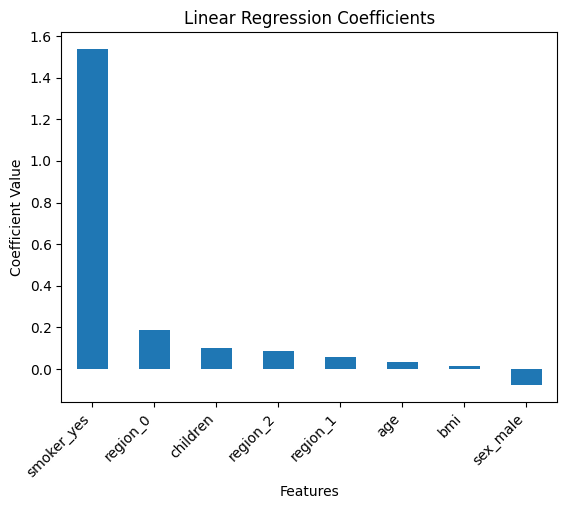

In [14]:
coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

1. smoker의 영향이 큰 모습 확인 가능
2. region의 영향도 꽤 큰 모습 확인 가능
3. age가 생각보다 영향력이 작은 모습 확인 가능

<ipython-input-15-30bf60e7cfab>:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((y_test - y_pred),ax=ax,color='b')


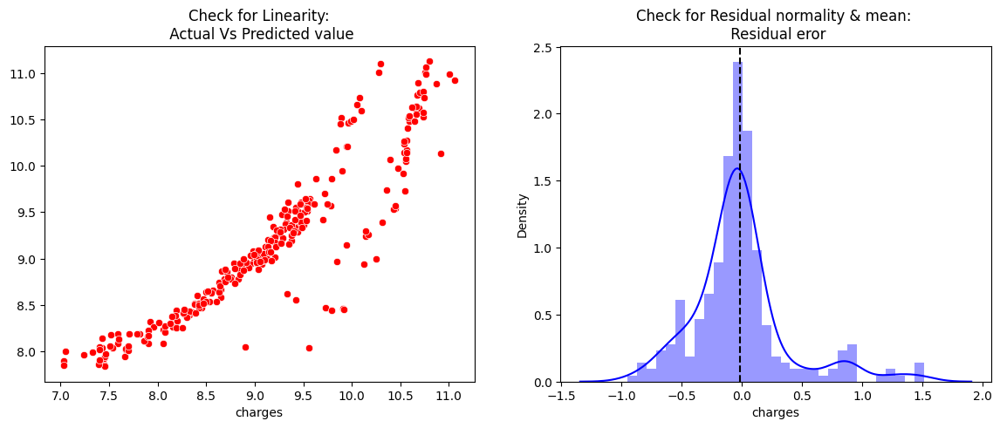

In [15]:
# Check for Linearity
f = plt.figure(figsize=(14,5))
ax = f.add_subplot(121)
sns.scatterplot(x=y_test,y=y_pred, ax=ax,color='r')
ax.set_title('Check for Linearity:\n Actual Vs Predicted value')

# Check for Residual normality & mean
ax = f.add_subplot(122)
sns.distplot((y_test - y_pred),ax=ax,color='b')
ax.axvline((y_test - y_pred).mean(),color='k',linestyle='--')  #평균
ax.set_title('Check for Residual normality & mean: \n Residual eror');

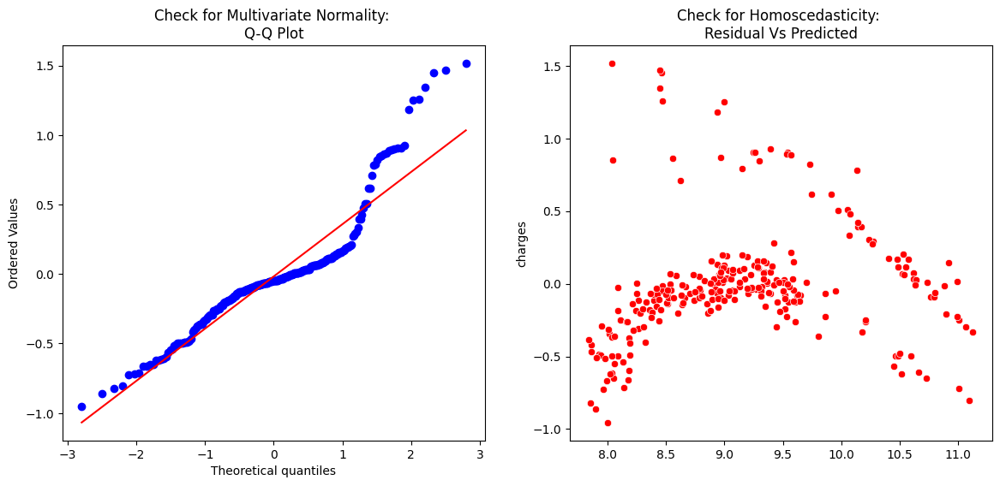

In [16]:
# Check for Multivariate Normality
# Quantile-Quantile plot
f,ax = plt.subplots(1,2,figsize=(14,6))
_,(_,_,r)= sp.stats.probplot((y_test - y_pred),fit=True,plot=ax[0])
ax[0].set_title('Check for Multivariate Normality: \nQ-Q Plot')

#Check for Homoscedasticity
sns.scatterplot(y = (y_test - y_pred), x= y_pred, ax = ax[1],color='r')
ax[1].set_title('Check for Homoscedasticity: \nResidual Vs Predicted');

In [17]:
profile2 = ProfileReport(train_mod, title="Profiling Report :: modified trian")
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

binary encoding이 진행된 region_0 ~ region_2의 상관계수 측정

In [18]:
# Cramér's V 계산 함수
def calculate_cramers_v(var1, var2):
    contingency_table = pd.crosstab(var1, var2)
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    n = contingency_table.sum().sum()
    cramers_v = np.sqrt(chi2 / (n * (min(contingency_table.shape) - 1)))
    return cramers_v

In [19]:
# 각 변수에 대한 Cramér's V 계산
cramers_v_0_1 = calculate_cramers_v(train_mod['region_0'], train_mod['region_1'])
cramers_v_0_2 = calculate_cramers_v(train_mod['region_0'], train_mod['region_2'])
cramers_v_1_2 = calculate_cramers_v(train_mod['region_1'], train_mod['region_2'])

# 결과 출력
print(f"Cramér's V between 'region_0' and 'region_1': {cramers_v_0_1:.4f}")
print(f"Cramér's V between 'region_0' and 'region_2': {cramers_v_0_2:.4f}")
print(f"Cramér's V between 'region_1' and 'region_2': {cramers_v_1_2:.4f}")

Cramér's V between 'region_0' and 'region_1': 0.5805
Cramér's V between 'region_0' and 'region_2': 0.5475
Cramér's V between 'region_1' and 'region_2': 0.0283


binary encoding을 진행하며 region0과 region1,2에 대한 높은 상관관계 확인 가능

### 종속변수와 독립변수의 관계 확인

- BMI를 WHO기준 카테고리로 나누어 보기 (bmi category)
- 그룹간의 중앙값 차이를 비교 X(sex, region) / O(smoking, children, bmi_category)



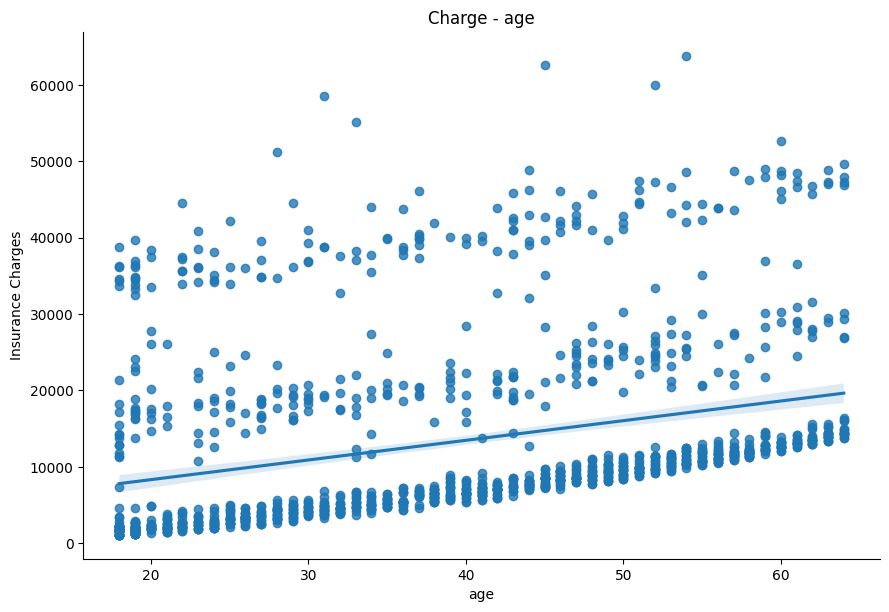

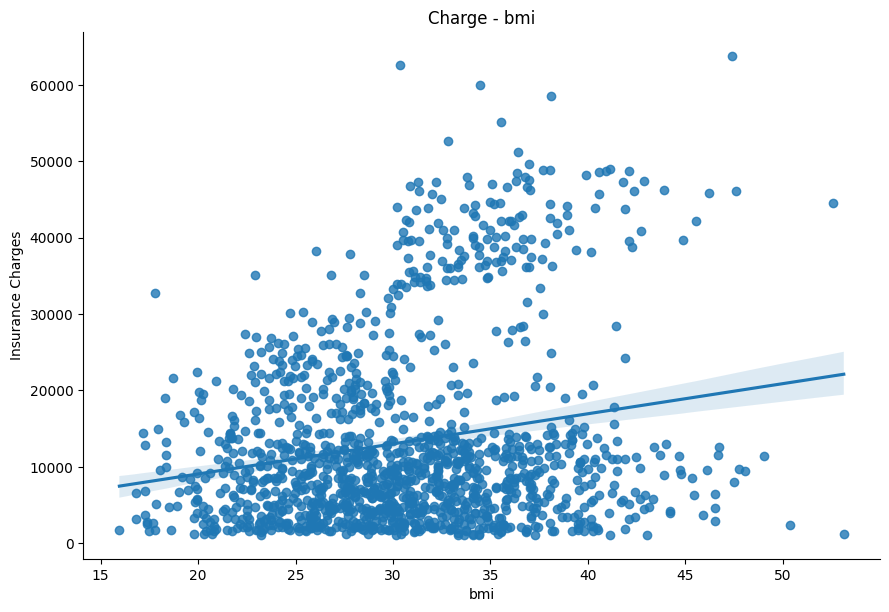

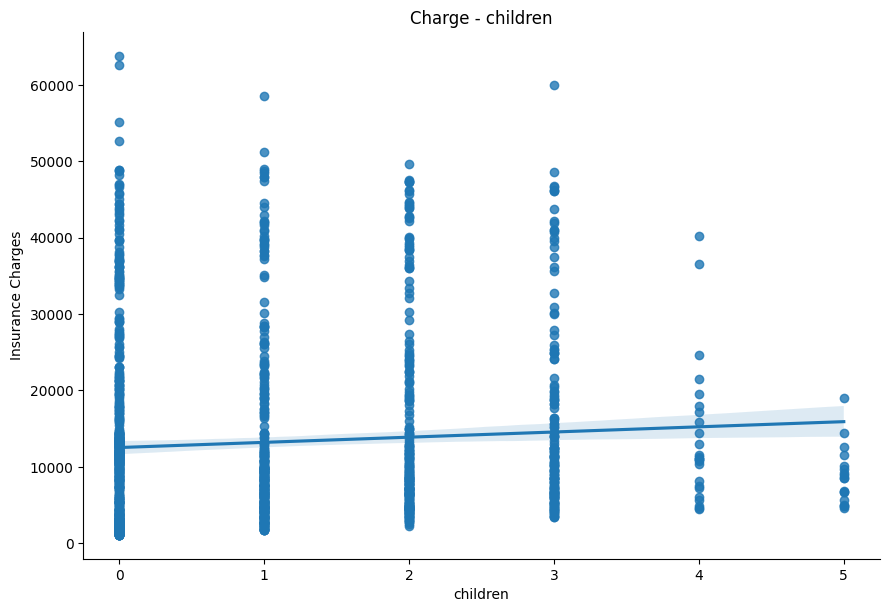

In [20]:
numeric_cols = ['age', 'bmi', 'children']

for i in range(0, len(numeric_cols)):
  sns.lmplot(x=numeric_cols[i],y='charges',data=train,aspect=1.5,height=6)
  plt.xlabel(str(numeric_cols[i]))
  plt.ylabel('Insurance Charges')
  plt.title('Charge - ' + numeric_cols[i]);

- age의 경우는 segmanet를 나누면 그룹별 회귀 곡선을 잘 만들 수 있을것 같음. 이때, segment 별로 나이가 많아질수록 보험료가 선형적으로 상승하는 모습을 확인 가능하다

- bmi의 경우는 비선형적인 관계를 보여줌

- children의 경우는 카테고리형 변수로 취급하여 box plot으로 다시 확인하기

#### 가설 1) BMI의 경우 범위(WHO기준)를 나누면 charges와 상관관계를 보다 잘 표현 가능할 것이다

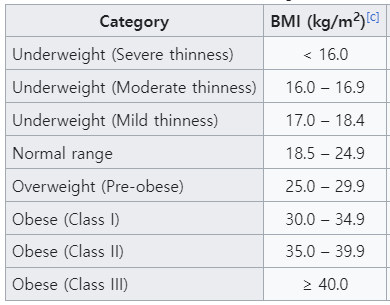

In [21]:
def categorize_bmi(bmi):
    if bmi < 16.0:
        return 'Underweight III'
    elif 16.0 <= bmi < 17.0:
        return 'Underweight II'
    elif 17.0 <= bmi < 18.5:
        return 'Underweight I'
    elif 18.5 <= bmi < 25.0:
        return 'Normal'
    elif 25.0 <= bmi < 30.0:
        return 'Pre-obese'
    elif 30.0 <= bmi < 35.0:
        return 'Obese I'
    elif 35.0 <= bmi < 40.0:
        return 'Obese II'
    else:
        return 'Obese III'

# BMI 값을 기준으로 새로운 컬럼 생성
train['bmi_category'] = train['bmi'].apply(categorize_bmi)

# 결과 확인
print(train[['bmi', 'bmi_category']].head())

      bmi bmi_category
0  27.900    Pre-obese
1  33.770      Obese I
2  33.000      Obese I
3  22.705       Normal
4  28.880    Pre-obese


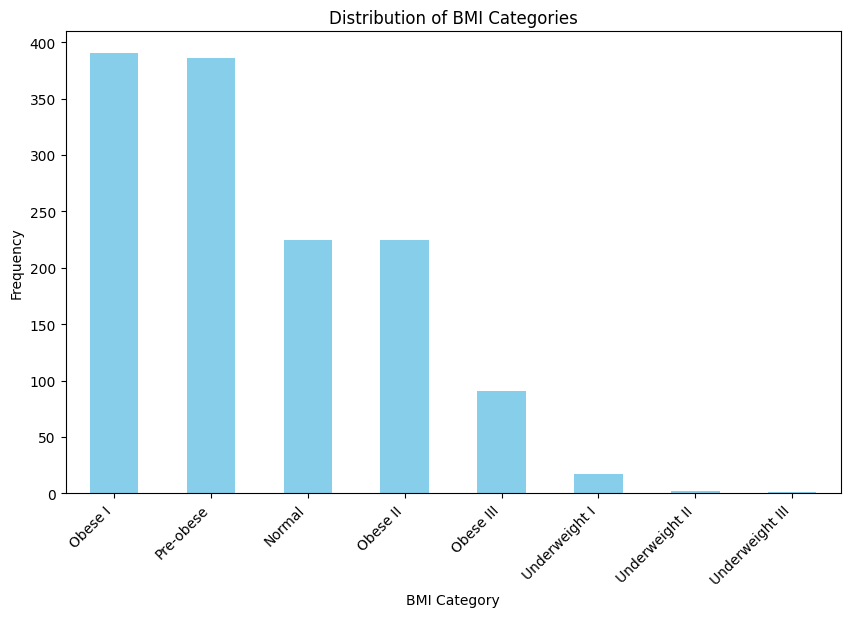

In [22]:
plt.figure(figsize=(10, 6))
train['bmi_category'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of BMI Categories')
plt.xlabel('BMI Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.show()

In [23]:
# bmi_category별 charges의 통계값 계산
bmi_charges_stats = train.groupby('bmi_category')['charges'].describe()

# 결과 확인
bmi_charges_stats

,count,mean,std,min,25%,50%,75%,max
bmi_category,,,,,,,,
Normal,225.0,10409.337709,7505.581314,1121.87390,4134.082450,8603.82340,15359.104500,35069.37452
Obese I,390.0,14452.444487,13575.099151,1131.50660,4772.698075,9573.46115,16743.933382,62592.87309
Obese II,225.0,17022.258883,15171.514137,1141.44510,5989.523650,11264.54100,27724.288750,58571.07448
Obese III,91.0,16784.615546,16658.190380,1146.79660,5419.864800,9748.91060,22468.178790,63770.42801
Pre-obese,386.0,10987.509891,8039.455318,1252.40700,4667.914013,8659.37800,15385.743188,38245.59327
Underweight I,17.0,9737.718506,8042.927635,1621.34020,2775.192150,9644.25250,13204.285650,32734.18630
Underweight II,2.0,4904.000350,2455.844784,3167.45585,4035.728100,4904.00035,5772.272600,6640.54485
Underweight III,1.0,1694.796400,NaN,1694.79640,1694.796400,1694.79640,1694.796400,1694.79640


미국 데이터인 만큼 underweight에 대한 데이터가 적고, obese에 가까운 데이터가 많다. underweight에 해당하는 세 그룹이 너무 적어 overfitting 및 데이터 불균형(세분화된 카테고리 중 데이터가 적은 카테고리들이 모델 학습 과정에서 무시될 수 있습니다. 이는 모델이 특정 카테고리에서 제대로 학습하지 못해, 예측력이 떨어지는 문제로 이어질 수 있습니다.)의 가능성이 있다. 또한 범위가 기존보다 많아져 encoding에서 문제 발생 가능 (sparse matrix, 차원의 저주 -> 물론 위와 같은 경우에서 컬럼 8개 정도 늘린다고 이런 문제가 크게 다가오는것은 아니다)

<ipython-input-24-243b3e2c9bb1>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='bmi_category', y='charges',data=train,palette='rainbow')


Text(0.5, 1.0, 'charges vs bmi cat')

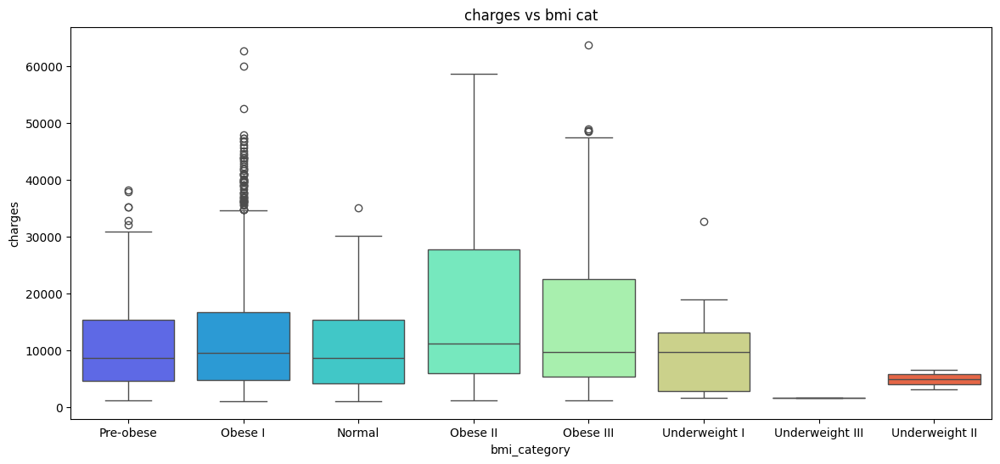

In [24]:
plt.figure(figsize=(14,6))
sns.boxplot(x='bmi_category', y='charges',data=train,palette='rainbow')
plt.title('charges vs bmi cat')

정보손실 확인

In [25]:
# 수치형 BMI 데이터를 적절한 구간으로 나눔
bmi_bins = np.histogram(train['bmi'], bins=8, density=True)

# 각 구간의 확률 분포 계산
bmi_probs = bmi_bins[0] / bmi_bins[0].sum()

# 수치형 BMI의 엔트로피 계산
numeric_entropy = entropy(bmi_probs)
print(f'Numerical BMI Entropy: {numeric_entropy:.4f}')

# 범주형 BMI의 확률 분포 계산
bmi_category_probs = train['bmi_category'].value_counts(normalize=True)

# 범주형 BMI의 엔트로피 계산
category_entropy = entropy(bmi_category_probs)
print(f'Categorical BMI Entropy: {category_entropy:.4f}')


Numerical BMI Entropy: 1.7012
Categorical BMI Entropy: 1.5714


변환 과정에서 엔트로피가 조금 감소했지만, 이는 정보 손실이 미미하다는 것을 의미하며, 데이터 변형이 실질적으로 분석에 큰 영향을 주지 않을 가능성이 큽니다.

기준 2 : BMI별 취약한 질병을 기준으로 범위를 크게 잡아본다

1. Underweight (BMI < 18.4)
취약한 질병:
면역력 저하, 골다공증, 빈혈, 근감소증, 심혈관 질환

2. Normal range (BMI 18.5 – 24.9)
정상 체중 범위에 속하는 사람들은 일반적으로 건강한 상태를 유지할 가능성이 높습니다.

3. Overweight (BMI 25.0 – 29.9)
고혈압, 당뇨병, 심혈관 질환, 관절염, 수면 무호흡증

4. Obese I (BMI 30.0 -34.9), Obese II (BMI 35.0 -39.9), Obese III (BMI 40.0)
취약한 질병:
제2형 당뇨병, 심혈관 질환, 수면 무호흡증, 간 질환, 관절 질환, 호르몬 불균형, 암

In [26]:
def categorize_bmi(bmi):
    if bmi < 18.4:
        return 'Underweight'
    elif 18.5 <= bmi < 25.0:
        return 'Normal'
    elif 25.0 <= bmi < 30.0:
        return 'Overweight'
    elif 30.0 <= bmi < 35.0:
        return 'Obese I'
    elif 35.0 <= bmi < 40.0:
        return 'Obese II'
    else:
        return 'Obese III'

In [27]:
# BMI 값을 기준으로 새로운 컬럼 생성
train['bmi_category'] = train['bmi'].apply(categorize_bmi)

train.head()

,age,bmi,children,region,charges,sex_male,smoker_yes,bmi_category
0,19,27.900,0,southwest,16884.92400,False,True,Overweight
1,18,33.770,1,southeast,1725.55230,True,False,Obese I
2,28,33.000,3,southeast,4449.46200,True,False,Obese I
3,33,22.705,0,northwest,21984.47061,True,False,Normal
4,32,28.880,0,northwest,3866.85520,True,False,Overweight


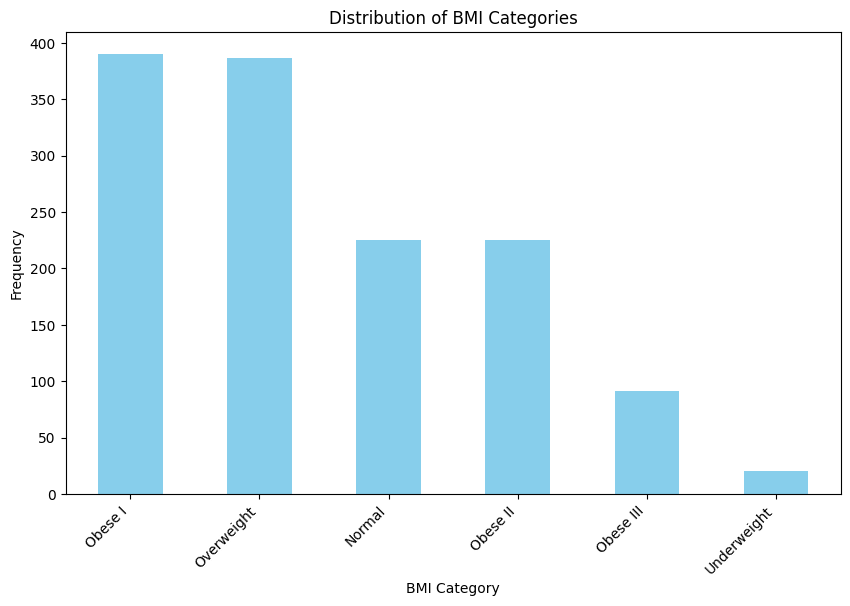

In [28]:
plt.figure(figsize=(10, 6))
train['bmi_category'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of BMI Categories')
plt.xlabel('BMI Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.show()

카테고리별 불균형 문제를 어느정도 해소

<ipython-input-29-243b3e2c9bb1>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='bmi_category', y='charges',data=train,palette='rainbow')


Text(0.5, 1.0, 'charges vs bmi cat')

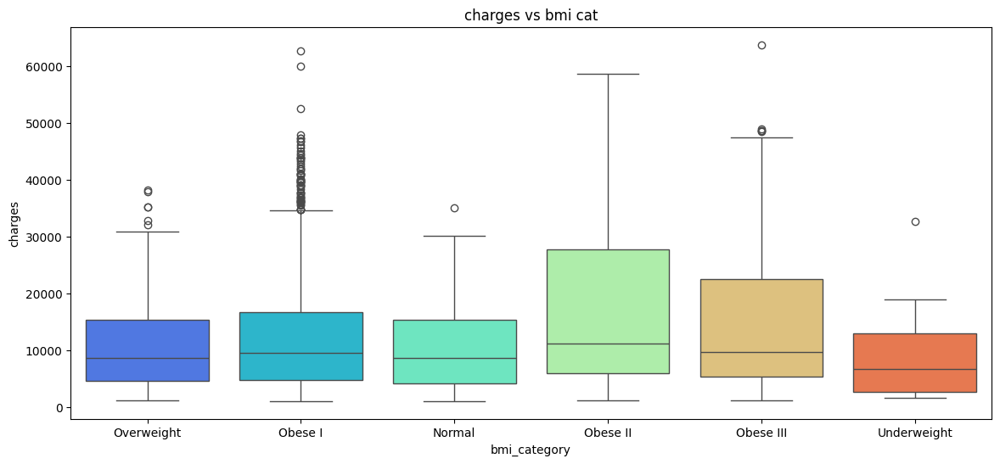

In [29]:
  plt.figure(figsize=(14,6))
  sns.boxplot(x='bmi_category', y='charges',data=train,palette='rainbow')
  plt.title('charges vs bmi cat')

정보손실 / 변형 확인

In [30]:
# 수치형 BMI 데이터를 적절한 구간으로 나눔
bmi_bins = np.histogram(train['bmi'], bins=6, density=True)

# 각 구간의 확률 분포 계산
bmi_probs = bmi_bins[0] / bmi_bins[0].sum()

# 수치형 BMI의 엔트로피 계산
numeric_entropy = entropy(bmi_probs)
print(f'Numerical BMI Entropy: {numeric_entropy:.4f}')

# 범주형 BMI의 확률 분포 계산
bmi_category_probs = train['bmi_category'].value_counts(normalize=True)

# 범주형 BMI의 엔트로피 계산
category_entropy = entropy(bmi_category_probs)
print(f'Categorical BMI Entropy: {category_entropy:.4f}')


Numerical BMI Entropy: 1.4249
Categorical BMI Entropy: 1.5636


- 정보 손실이 거의 없음: 두 엔트로피 값이 매우 유사하므로, 수치형 데이터를 범주형으로 변환하는 과정에서 중요한 정보가 거의 손실되지 않았음을 나타냅니다.
- 일관성 있는 변환: 변환 결과가 일관성이 있고 데이터 분석이나 모델링에 유효한 형태로 유지되고 있다고 판단할 수 있습니다.

In [31]:
# bmi_category별 charges의 통계값 계산
bmi_charges_stats = train.groupby('bmi_category')['charges'].describe()

# 결과 확인
bmi_charges_stats

,count,mean,std,min,25%,50%,75%,max
bmi_category,,,,,,,,
Normal,225.0,10409.337709,7505.581314,1121.8739,4134.082450,8603.823400,15359.104500,35069.37452
Obese I,390.0,14452.444487,13575.099151,1131.5066,4772.698075,9573.461150,16743.933382,62592.87309
Obese II,225.0,17022.258883,15171.514137,1141.4451,5989.523650,11264.541000,27724.288750,58571.07448
Obese III,91.0,16784.615546,16658.190380,1146.7966,5419.864800,9748.910600,22468.178790,63770.42801
Overweight,386.0,10987.509891,8039.455318,1252.4070,4667.914013,8659.378000,15385.743188,38245.59327
Underweight,20.0,8852.200585,7735.038364,1621.3402,2751.631438,6759.262475,12923.162737,32734.18630


In [32]:
# 평균과 중앙값 계산
mean_values = bmi_charges_stats['mean']

# 그룹별 평균의 백분율 차이 계산
mean_percent_diff = mean_values.pct_change().fillna(0) * 100

# 백분율 차이 결과 출력
result = pd.DataFrame({
    'mean': mean_values,
    'mean_percent_difference': mean_percent_diff,
})

result

,mean,mean_percent_difference
bmi_category,,
Normal,10409.337709,0.000000
Obese I,14452.444487,38.841153
Obese II,17022.258883,17.781175
Obese III,16784.615546,-1.396074
Overweight,10987.509891,-34.538209
Underweight,8852.200585,-19.433969


In [33]:
# 각 지역 그룹의 charges 데이터 분리
N_charges = train[train['bmi_category'] == 'Normal']['charges']
O1_charges = train[train['bmi_category'] == 'Obese I']['charges']
O2_charges = train[train['bmi_category'] == 'Obese II']['charges']
O3_charges = train[train['bmi_category'] == 'Obese III']['charges']
O_charges = train[train['bmi_category'] == 'Overweight']['charges']
U_charges = train[train['bmi_category'] == 'Underweight']['charges']

# Kruskal-Wallis H Test 수행
h_stat, p_value = sp.stats.kruskal(N_charges, O1_charges, O2_charges, O3_charges, O_charges, U_charges)

print(f"H-statistic: {h_stat:.4f}, p-value: {p_value:.4f}")

# 결과 해석
alpha = 0.05
if p_value < alpha:
    print("bmi_category 간의 의료비 차이는 통계적으로 유의미합니다. (귀무가설 기각)")
else:
    print("bmi_category 간의 의료비 차이는 통계적으로 유의미하지 않습니다. (귀무가설 채택)")


H-statistic: 22.0591, p-value: 0.0005
bmi_category 간의 의료비 차이는 통계적으로 유의미합니다. (귀무가설 기각)


obese I 그룹을 제외하고는 이상치가 많지 않고(평균이 그룹의 대표성을 가지고 있고), 그룹별 평균의 차이가 크게 나타난다. 따라서, target encoding을 mean 기준으로 적용해 simple linear regression을 적용해 본다

In [34]:
# 'region'에 대해 Binary Encoding 적용

train_mod = train.drop(['bmi'], axis=1)
encoder = BinaryEncoder(cols=['region'])
train_mod = encoder.fit_transform(train_mod)

# 통계값을 기반으로 각 bmi_category를 매핑하는 딕셔너리 생성

# category 8개인 경우
# bmi_mapping = {
#     'Normal': 10409,
#     'Obese I': 14452,
#     'Obese II': 17022,
#     'Obese III': 16785,
#     'Pre-obese': 10988,
#     'Underweight I': 9738,
#     'Underweight II': 4904,
#     'Underweight III': 1695
# }

# category 6개인 경우
bmi_mapping = {
    'Normal': np.log1p(10409),
    'Obese I': np.log1p(14452),
    'Obese II': np.log1p(17022),
    'Obese III': np.log1p(16785),
    'Overweight': np.log1p(10988),
    'Underweight': np.log1p(8852)
}

# bmi_category를 해당 통계값(평균)으로 매핑하여 새로운 컬럼 생성
train_mod['bmi_category'] = train['bmi_category'].map(bmi_mapping)


# 'charges'에 로그 스케일링 적용
train_mod['charges'] = np.log1p(train_mod['charges'])

train_mod.head()

,age,children,region_0,region_1,region_2,charges,sex_male,smoker_yes,bmi_category
0,19,0,0,0,1,9.734236,False,True,9.304650
1,18,1,0,1,0,7.453882,True,False,9.578657
2,28,3,0,1,0,8.400763,True,False,9.578657
3,33,0,0,1,1,9.998137,True,False,9.250522
4,32,0,0,1,1,8.260455,True,False,9.304650


In [35]:
# 피처와 타겟 변수 분리
X = train_mod.drop('charges', axis=1)
y = train_mod['charges']

# 데이터 분할 (훈련 세트와 테스트 세트)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 선형 회귀 모델 생성 및 훈련
model = LinearRegression()
model.fit(X_train, y_train)

# 예측 수행
y_pred = model.predict(X_test)

# 모델 성능 평가
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

# 회귀 계수 확인
coefficients = pd.DataFrame(model.coef_, X.columns, columns=['Coefficient'])
print(coefficients)

Mean Squared Error: 0.15980068125214303
R^2 Score: 0.8277801896221624
              Coefficient
age              0.033908
children         0.100465
region_0         0.183829
region_1         0.059876
region_2         0.079278
sex_male        -0.075351
smoker_yes       1.535973
bmi_category     0.440712


- bmi_category를 사용하지 않은 결과
  - Mean Squared Error: 0.1582247225342882
  - R^2 Score: 0.8294786261333561

- MSE 약간 증가 및 R^2가 약간 감소하는 모습을 확인 가능

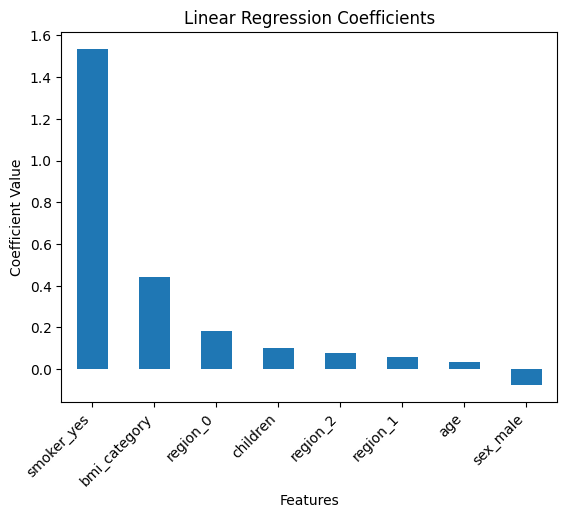

In [36]:
coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

bmi_category의 해석력이 증가했지만, 모델 전체로 봤을 때는 좋지 않은 영향을 주고 있음. 모델의 종류와 성능 측정 metric을 제대로 정하고 다시 확인

#### categorical

<ipython-input-37-e2d2e6bf4fde>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_cols[i], y='charges',data=train,palette='rainbow')
<ipython-input-37-e2d2e6bf4fde>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_cols[i], y='charges',data=train,palette='rainbow')
<ipython-input-37-e2d2e6bf4fde>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_cols[i], y='charges',data=train,palette='rainbow')
<ipython-input-37-e2d2e6bf4fde>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0

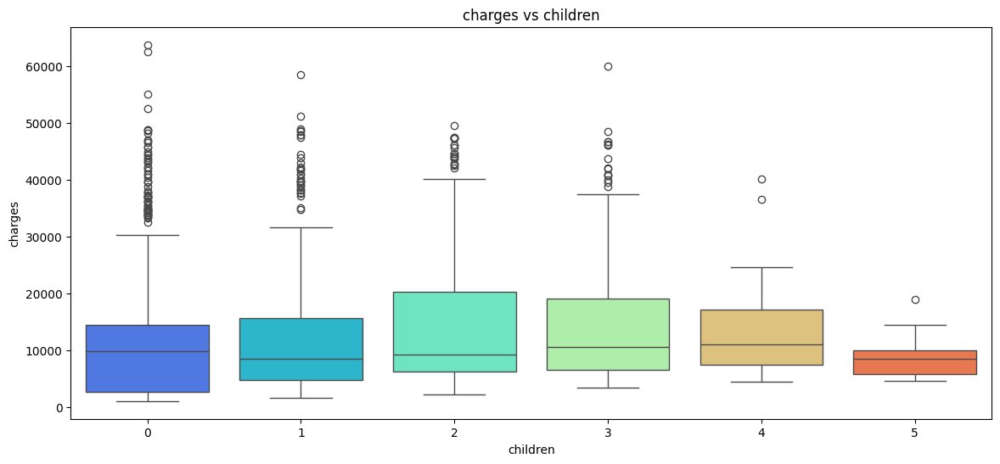

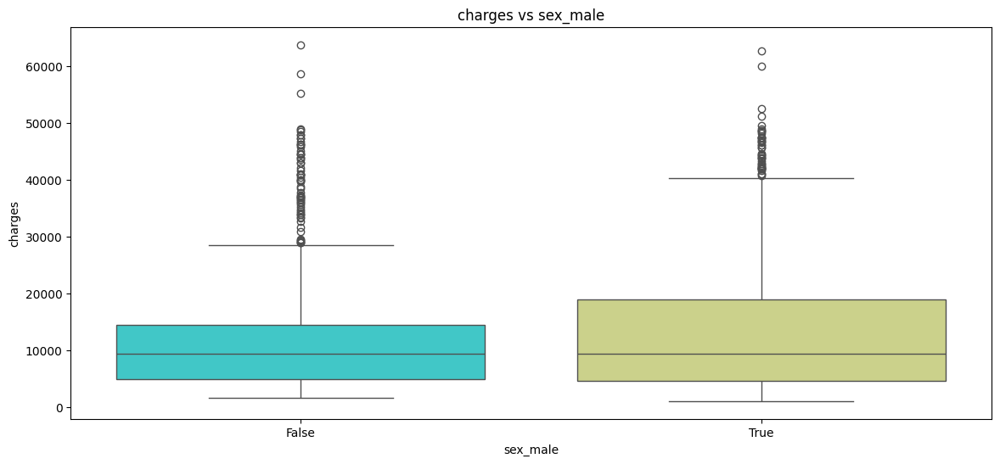

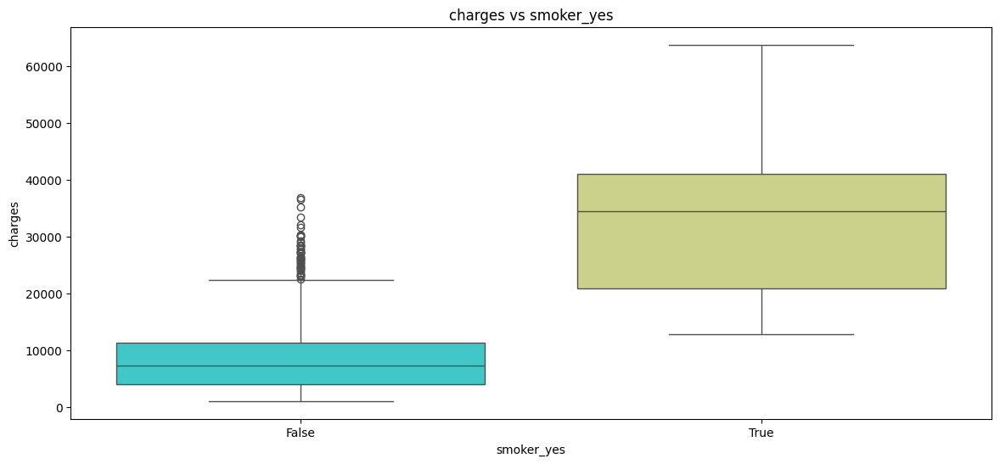

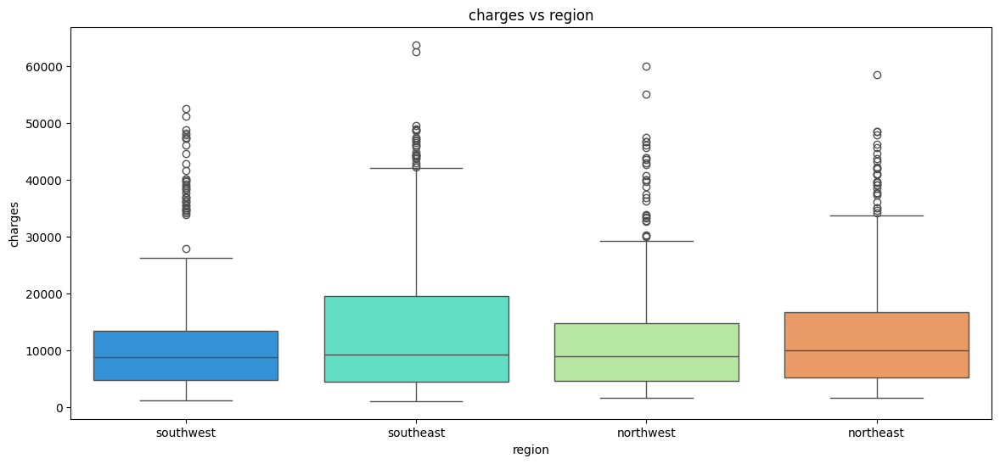

In [37]:
cat_cols = ['children', 'sex_male', 'smoker_yes', 'region']

for i in range(0, len(cat_cols)):
  plt.figure(figsize=(14,6))
  sns.boxplot(x=cat_cols[i], y='charges',data=train,palette='rainbow')
  plt.title('charges vs ' + str(cat_cols[i]))

- children
  - kaggle에 의하면 "children: Number of children covered by health insurance / Number of dependents"을 의미한다. 즉, 보험 가입자가 커버하는 부양가족의 수를 의미한다. 그렇다면 일반적으로 부양가족 수가 늘어날수록 charges는 증가할 것으로 예측 가능한데 실제로는 그렇지 않다.
- smoker
  - 흡연자의 경우, 보험료의 분포가 넓고 IQR(Interquartile Range) 내에 거의 모든 데이터가 포함되어 있으며, 이상치(outliers)가 거의 없습니다. 이는 흡연 여부가 보험료에 큰 영향을 미치는 주요 변수임을 시사합니다.
  - 비흡연자의 경우, 보험료의 분포가 흡연자에 비해 낮지만, IQR 범위 밖에 많은 이상치가 존재합니다. 이는 일부 비흡연자들이 높은 보험료를 지불하고 있음을 나타내며, 이는 흡연 이외의 다른 요인들이 보험료에 영향을 미치고 있음을 시사합니다.
- region의 경우는 뚜렷한 차이가 보이지 않음

In [38]:
# 남성과 여성 그룹으로 데이터 분리
smoker_charges = train[train['smoker_yes'] == True]['charges']
non_smoker_charges = train[train['smoker_yes'] == False]['charges']

# Mann-Whitney U Test 수행 (두개의 독립된 그룹간의 중앙값 차이를 비교)
u_stat, p_value = sp.stats.mannwhitneyu(smoker_charges, non_smoker_charges, alternative='two-sided')

print(f"U-statistic: {u_stat:.4f}, p-value: {p_value:.4f}")

# 결과 해석
alpha = 0.05
if p_value < alpha:
    print("흡연 여부 간의 의료비 차이는 통계적으로 유의미합니다. (귀무가설 기각)")
else:
    print("흡연 여부 간의 의료비 차이는 통계적으로 유의미하지 않습니다. (귀무가설 채택)")

U-statistic: 283859.0000, p-value: 0.0000
흡연 여부 간의 의료비 차이는 통계적으로 유의미합니다. (귀무가설 기각)


In [39]:
# 남성과 여성 그룹으로 데이터 분리
male_charges = train[train['sex_male'] == True]['charges']
female_charges = train[train['sex_male'] == False]['charges']

# Mann-Whitney U Test 수행 (두개의 독립된 그룹간의 중앙값 차이를 비교)
u_stat, p_value = sp.stats.mannwhitneyu(male_charges, female_charges, alternative='two-sided')

print(f"U-statistic: {u_stat:.4f}, p-value: {p_value:.4f}")

# 결과 해석
alpha = 0.05
if p_value < alpha:
    print("성별 간의 의료비 차이는 통계적으로 유의미합니다. (귀무가설 기각)")
else:
    print("성별 간의 의료비 차이는 통계적으로 유의미하지 않습니다. (귀무가설 채택)")

U-statistic: 226198.0000, p-value: 0.6945
성별 간의 의료비 차이는 통계적으로 유의미하지 않습니다. (귀무가설 채택)


In [40]:
region1_charges = train[train['region'] == 'southwest']['charges']
region2_charges = train[train['region'] == 'southeast']['charges']
region3_charges = train[train['region'] == 'northwest']['charges']
region4_charges = train[train['region'] == 'northeast']['charges']

# Kruskal-Wallis H Test 수행 (세 개 이상의 그룹 간 순위의 중앙값이 유의미하게 차이가 있는지를 검정합니다)
h_stat, p_value = sp.stats.kruskal(region1_charges, region2_charges, region3_charges, region4_charges)

print(f"H-statistic: {h_stat:.4f}, p-value: {p_value:.4f}")

# 결과 해석
alpha = 0.05
if p_value < alpha:
    print("지역 간의 의료비 차이는 통계적으로 유의미합니다. (귀무가설 기각)")
else:
    print("지역 간의 의료비 차이는 통계적으로 유의미하지 않습니다. (귀무가설 채택)")

H-statistic: 4.6225, p-value: 0.2016
지역 간의 의료비 차이는 통계적으로 유의미하지 않습니다. (귀무가설 채택)


In [41]:
charges_0 = train[train['children'] == 0]['charges']
charges_1 = train[train['children'] == 1]['charges']
charges_2 = train[train['children'] == 2]['charges']
charges_3 = train[train['children'] == 3]['charges']
charges_4 = train[train['children'] == 4]['charges']
charges_5 = train[train['children'] == 5]['charges']

# Kruskal-Wallis H Test 수행 (세 개 이상의 그룹 간 순위의 중앙값이 유의미하게 차이가 있는지를 검정합니다)
h_stat, p_value = sp.stats.kruskal(charges_0, charges_1, charges_2, charges_3, charges_4, charges_5)

print(f"H-statistic: {h_stat:.4f}, p-value: {p_value:.4f}")

# 결과 해석
alpha = 0.05
if p_value < alpha:
    print("부양가족 간의 의료비 차이는 통계적으로 유의미합니다. (귀무가설 기각)")
else:
    print("부양가족 간의 의료비 차이는 통계적으로 유의미하지 않습니다. (귀무가설 채택)")

H-statistic: 29.1207, p-value: 0.0000
부양가족 간의 의료비 차이는 통계적으로 유의미합니다. (귀무가설 기각)


성별/지역이라는 하나의 독립변수로는 의료비의 분포를 충분하게 설명할 수 없지만, 추가적인 독립변수들과 합쳐서 다변량 분석을 했을 때는 의료비에 대한 설명력이 커질 수 있다

### 종속변수와 독립변수들의 관계 확인

- 가설) charge와 age의 관계에서 확인 가능한 세 그룹은 다른 독립변수들에 의해 설명 가능할 것이다 (X)
- 성별과 지역을 묶어 새로운 그룹을 만들어도 중앙값의 차이가 유의미하지 않음
- 가설) 부양가족(children)의 수와 charges가 정비례하지 않는 것은 부양가족이 늘어날수록 가족 구성원 1인당 보험 청구료가 감소하기 때문이다 (O)

#### age & 독립변수 확인

Text(0.5, 1.0, 'Scatter plot of Charges vs age(bmi cat)')

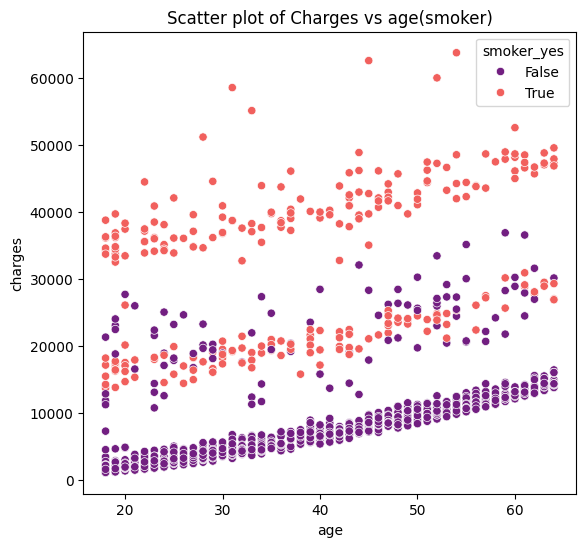

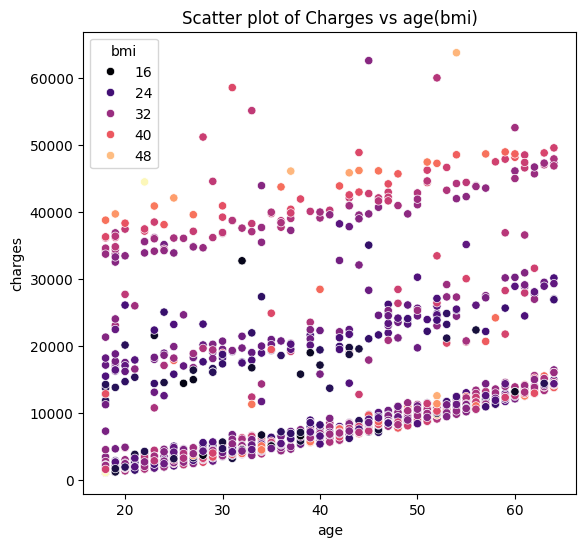

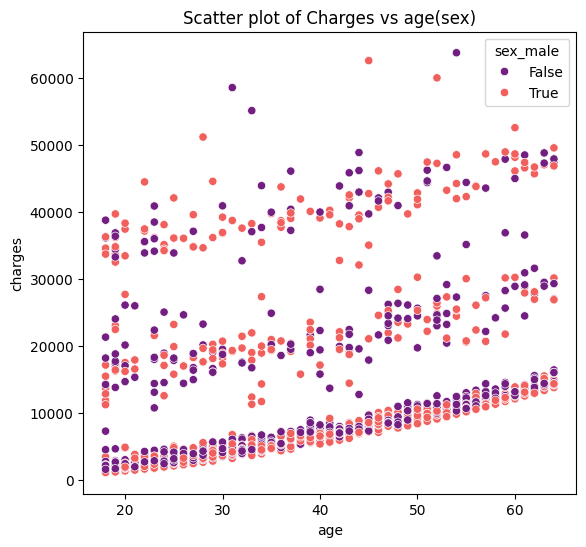

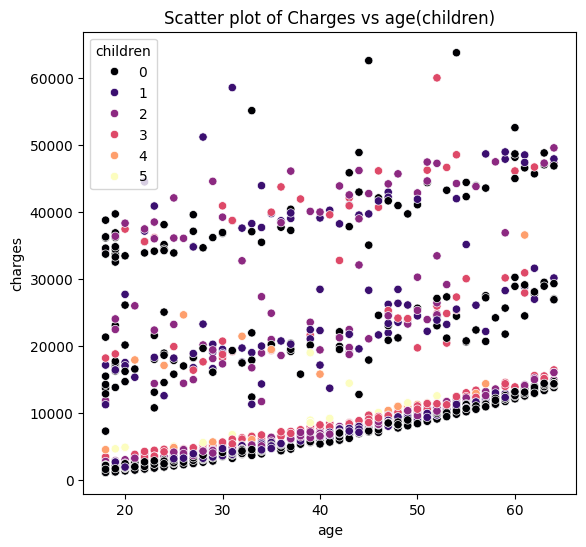

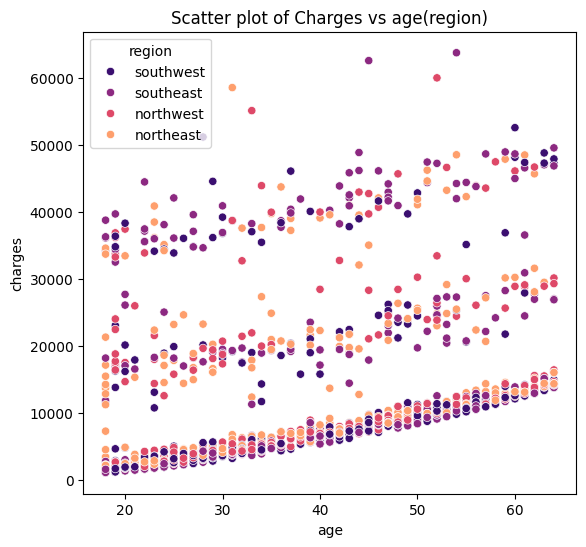

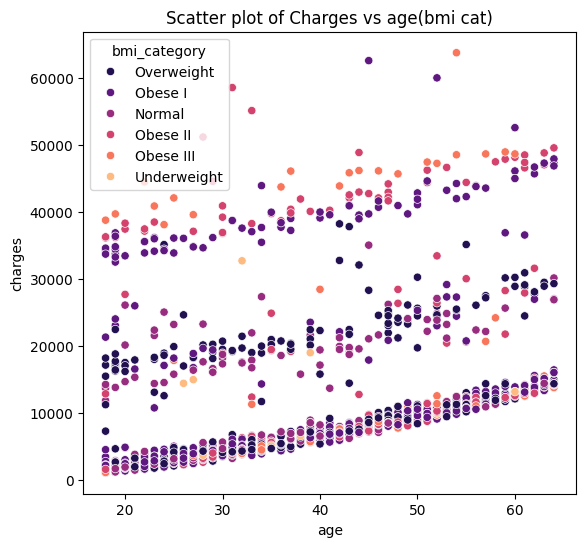

In [42]:
f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='age',y='charges',data=train,palette='magma',hue='smoker_yes',ax=ax)
ax.set_title('Scatter plot of Charges vs age(smoker)')

f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='age',y='charges',data=train,palette='magma',hue='bmi',ax=ax)
ax.set_title('Scatter plot of Charges vs age(bmi)')

f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='age',y='charges',data=train,palette='magma',hue='sex_male',ax=ax)
ax.set_title('Scatter plot of Charges vs age(sex)')

f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='age',y='charges',data=train,palette='magma',hue='children',ax=ax)
ax.set_title('Scatter plot of Charges vs age(children)')

f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='age',y='charges',data=train,palette='magma',hue='region',ax=ax)
ax.set_title('Scatter plot of Charges vs age(region)')

f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='age',y='charges',data=train,palette='magma',hue='bmi_category',ax=ax)
ax.set_title('Scatter plot of Charges vs age(bmi cat)')

smoker의 경우 차이가 뚜렷하게 보이지만, 나머지 경우는 섞여 있다.

#### 가설 2) charge와 age의 관계에서 확인 가능한 세 그룹은 다른 독립변수들에 의해 설명 가능할 것이다 (X)

In [43]:
# X 데이터 준비
X_cols = ['children', 'charges', 'sex_male', 'smoker_yes', 'region', 'bmi']
# X_cols = ['children', 'sex_male', 'smoker_yes', 'region', 'bmi']
X = train[X_cols]
encoder = BinaryEncoder(cols=['region'])
X = encoder.fit_transform(X)

# 군집 3개
n = 3
X.head()

,children,charges,sex_male,smoker_yes,region_0,region_1,region_2,bmi
0,0,16884.92400,False,True,0,0,1,27.900
1,1,1725.55230,True,False,0,1,0,33.770
2,3,4449.46200,True,False,0,1,0,33.000
3,0,21984.47061,True,False,0,1,1,22.705
4,0,3866.85520,True,False,0,1,1,28.880


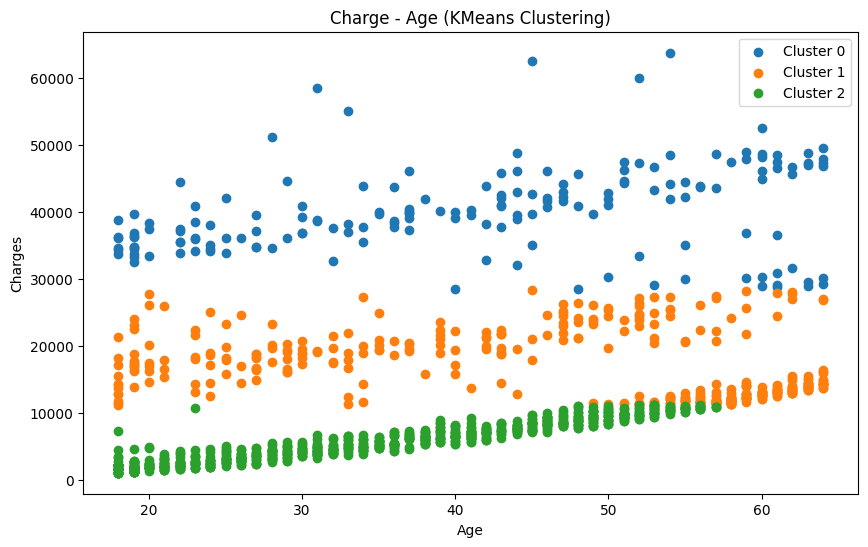

In [44]:
# KMeans 클러스터링을 사용하여 3개의 그룹으로 나눕니다.
kmeans = KMeans(n_clusters=n, random_state=42)
X['cluster'] = kmeans.fit_predict(X)

# 시각화를 위해 age 컬럼을 다시 추가
X['age'] = train['age']
X['charges'] = train['charges']

# 클러스터링 결과를 시각화
plt.figure(figsize=(10, 6))
for cluster in range(n):
    clustered_data = X[X['cluster'] == cluster]
    plt.scatter(clustered_data['age'], clustered_data['charges'], label=f'Cluster {cluster}')

plt.xlabel('Age')
plt.ylabel('Charges')
plt.title('Charge - Age (KMeans Clustering)')
plt.legend()
plt.show()

cluster 1 / 2의 끝부분 겹치는 구간이 아쉽지만, 전반적인 결과는 만족스럽다

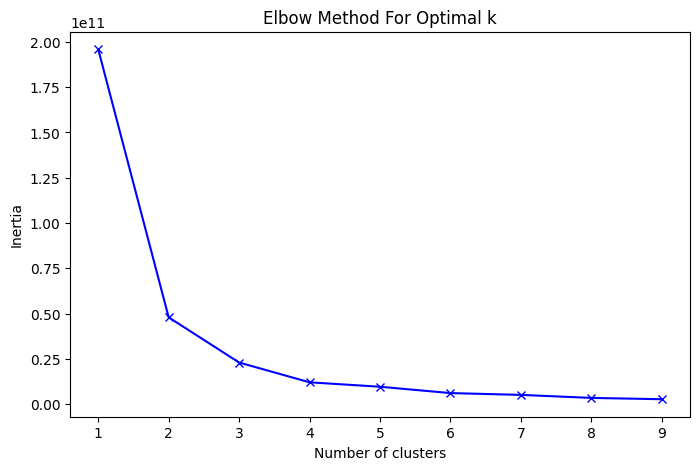

In [45]:
inertia = []
K = range(1, 10)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(K, inertia, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method For Optimal k')
plt.show()

- 최소값 k = 2: 첫 번째 급격한 감소 이후의 지점입니다. 이 지점이 Elbow Point로 많이 선택되며, Elbow Method 기준에서는 가장 간단하고 최적의 클러스터 수로 간주될 수 있습니다.
- k = 3: 3까지도 여전히 완만해지기 전의 감소가 이루어지고 있어, 더 세분화된 분석을 원할 때 사용될 수 있습니다. 목적성에 가장 부합하는 군집 개수이다.

In [46]:
# 실루엣 계수 계산
silhouette_avg = silhouette_score(X, X['cluster'])
print(f'Silhouette Score: {silhouette_avg}')

Silhouette Score: 0.593358329857065


k=3일 경우 실루엣 점수가 0.6정도로 군집화가 잘 이루어졌다고 판단할 수 있다.

In [47]:
# cluster별 통계값 확인
cluster_stats = X.groupby('cluster').describe()

# 결과 확인
X_cols = [['children', 'bmi', 'age']]

for i in X_cols:
  print(cluster_stats[i])

        children                                                 bmi  \
           count      mean       std  min  25%  50%  75%  max  count   
cluster                                                                
0          171.0  1.134503  1.126960  0.0  0.0  1.0  2.0  4.0  171.0   
1          380.0  1.073684  1.260248  0.0  0.0  1.0  2.0  5.0  380.0   
2          786.0  1.097964  1.196309  0.0  0.0  1.0  2.0  5.0  786.0   

                    ...                     age                              \
              mean  ...       75%    max  count       mean        std   min   
cluster             ...                                                       
0        34.620906  ...  36.95750  52.58  171.0  41.251462  14.678152  18.0   
1        29.527526  ...  33.34500  49.06  380.0  47.171053  14.798014  18.0   
2        30.351654  ...  34.17625  53.13  786.0  34.937659  11.551819  18.0   

                                 
          25%   50%   75%   max  
cluster                 

In [48]:
X.head()

,children,charges,sex_male,smoker_yes,region_0,region_1,region_2,bmi,cluster,age
0,0,16884.92400,False,True,0,0,1,27.900,1,19
1,1,1725.55230,True,False,0,1,0,33.770,2,18
2,3,4449.46200,True,False,0,1,0,33.000,2,28
3,0,21984.47061,True,False,0,1,1,22.705,1,33
4,0,3866.85520,True,False,0,1,1,28.880,2,32


 통계량을 확인하는 것 만으로는 군집 결정 기준을 찾기 어려워, decision tree를 사용하여 결정 기준을 찾아본다

In [49]:
warnings.filterwarnings("ignore")
# 모델 정의
model = DecisionTreeClassifier()

param_grid = param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [2, 3, 4],
    'min_samples_split': [162],
}

Classifiers = GridSearchCV(model, param_grid, cv=5, scoring='precision')

clustering이 잘 진행된 만큼, 잘 맞추는 것이 중요하다고 판단되어 precision을 metric으로 설정 (TP / TP + FP)

In [50]:
# 데이터를 피처와 타겟 변수로 분리
y_tree = X['cluster']
X_tree = X[['children', 'sex_male', 'smoker_yes', 'region_0', 'region_1', 'region_2', 'bmi']] # age는 빼고 진행


# 데이터를 훈련 세트와 테스트 세트로 분할
X_train, X_test, y_train, y_test = train_test_split(X_tree, y_tree, test_size=0.2, random_state=42, stratify=y_tree)

# 모델 학습
Classifiers.fit(X_train, y_train)
best_classifier = Classifiers.best_estimator_

print("Best parameters:", Classifiers.best_params_)

# 테스트 세트 예측
y_pred = best_classifier.predict(X_test)

Best parameters: {'criterion': 'gini', 'max_depth': 2, 'min_samples_split': 162}


In [51]:
# classification report 출력
print("Classification Report:")
print(classification_report(y_test, y_pred))

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.82      0.90        34
           1       0.81      0.28      0.41        76
           2       0.74      1.00      0.85       158

    accuracy                           0.77       268
   macro avg       0.85      0.70      0.72       268
weighted avg       0.79      0.77      0.73       268



In [52]:
from sklearn.tree import export_graphviz
import graphviz

# 학습된 Decision Tree 모델에서 트리를 추출합니다.
tree = best_classifier

# 트리를 시각화합니다.
dot_data = export_graphviz(tree, out_file=None, feature_names=X_tree.columns,
                           class_names=['0', '1', '2'], filled=True,
                           rounded=True, special_characters=True)
graph = graphviz.Source(dot_data)
graph.render(path + "decision_tree2")  # "decision_tree.pdf" 파일로 저장됩니다.

'/content/gdrive/My Drive/Colab Notebooks/study/linear regression/decision_tree2.pdf'

- 결과를 정리하면 아래와 같다
  - cluster 0(파란색) : 흡연자 & bmi > 30.01
  - cluster 1(주황색) : 비흡연자
  - cluster 2(초록색) : 흡연자 & bmi <= 30.01

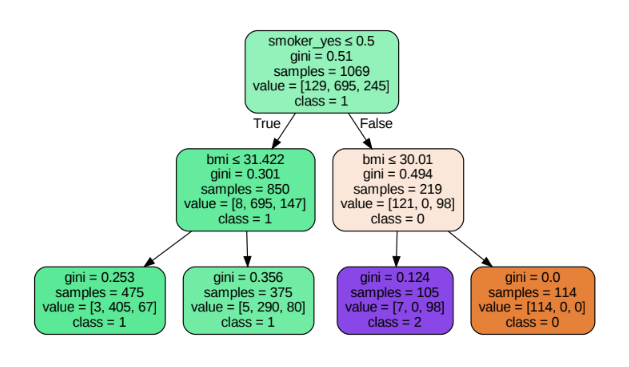

위 기준을 사용하여 데이터의 scatter plot을 확인해 보자

In [53]:
# Decision Tree 기준에 따른 클러스터 설정 함수
def assign_cluster(row):
    if row['smoker_yes'] == True and row['bmi'] > 30.01:
        return 0  # Cluster 0: 흡연자 & BMI > 30.01
    elif row['smoker_yes'] == False:
        return 1  # Cluster 1: 비흡연자
    else:
        return 2  # Cluster 2: 흡연자 & BMI <= 30.01

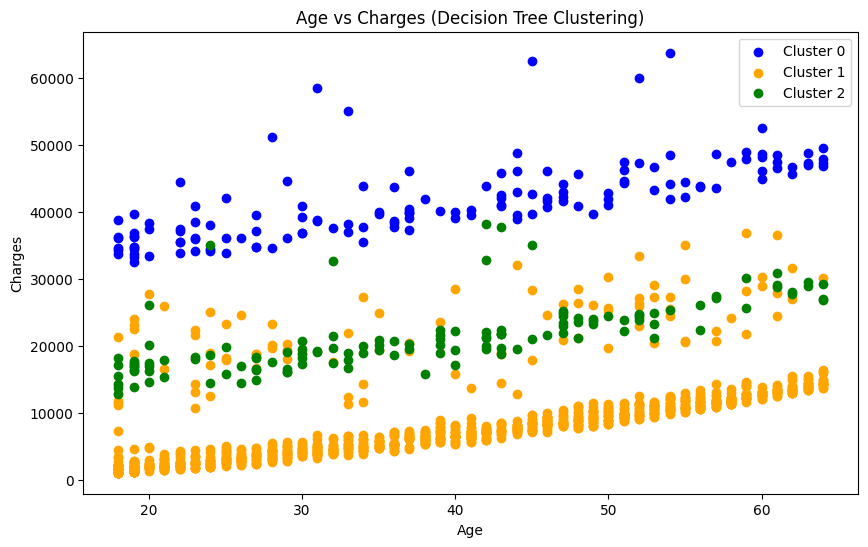

In [54]:
# 클러스터 할당
X['cluster'] = X.apply(assign_cluster, axis=1)

# 색상 설정
colors = {0: 'blue', 1: 'orange', 2: 'green'}

# 산점도 그리기
plt.figure(figsize=(10, 6))
for cluster, group_data in X.groupby('cluster'):
    plt.scatter(group_data['age'], group_data['charges'],
                label=f'Cluster {cluster}',
                color=colors[cluster])

plt.title('Age vs Charges (Decision Tree Clustering)')
plt.xlabel('Age')
plt.ylabel('Charges')
plt.legend()
plt.show()

- k-means 자체로 나눈 데이터를 사용하는 것 보다 cluster가 더 섞여버렸다. cluster 1/2 가 겹치는 부분은 주어진 데이터로는 설명할 수 없는 무언가가 있다고 판단된다
- 결국, 가설은 기각한다
- 하지만, 모델 구축 관점에서는 K-means로 만들어낸 cluster들이 유의미한 성능 향상에 영향을 줄 수 있을 것 같다. 물론, 설명 가능성이 떨어져 더 생각해 봐야 할 문제이다

##### **위에서 진행한 군집화는 모두 기각. 코드 작성할 때 실수로 종속변수를 k-means의 피처로 넣어 학습한 결과임. charges를 사용하지 않고 k-means를 진행한 결과는 아래와 같음**

In [55]:
# X 데이터 준비
X_cols = ['children', 'sex_male', 'smoker_yes', 'region', 'bmi']
X = train[X_cols]
encoder = BinaryEncoder(cols=['region'])
X = encoder.fit_transform(X)

# 군집 3개
n = 3
X.head()

,children,sex_male,smoker_yes,region_0,region_1,region_2,bmi
0,0,False,True,0,0,1,27.900
1,1,True,False,0,1,0,33.770
2,3,True,False,0,1,0,33.000
3,0,True,False,0,1,1,22.705
4,0,True,False,0,1,1,28.880


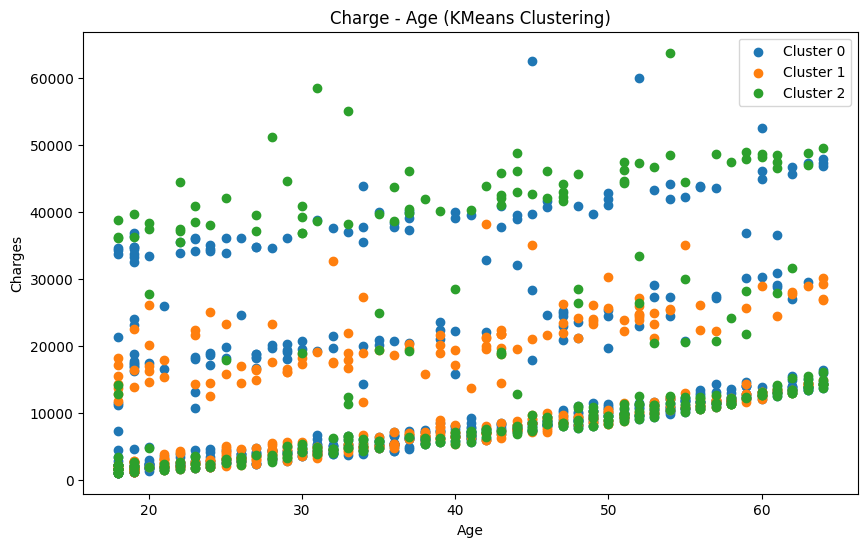

In [56]:
# KMeans 클러스터링을 사용하여 3개의 그룹으로 나눕니다.
kmeans = KMeans(n_clusters=n, random_state=42)
X['cluster'] = kmeans.fit_predict(X)

# 시각화를 위해 age 컬럼을 다시 추가
X['age'] = train['age']
X['charges'] = train['charges']

# 클러스터링 결과를 시각화
plt.figure(figsize=(10, 6))
for cluster in range(n):
    clustered_data = X[X['cluster'] == cluster]
    plt.scatter(clustered_data['age'], clustered_data['charges'], label=f'Cluster {cluster}')

plt.xlabel('Age')
plt.ylabel('Charges')
plt.title('Charge - Age (KMeans Clustering)')
plt.legend()
plt.show()

- 군집화 자체가 목적에 맞지 않게 진행되는 모습을 확인할 수 있다.
- 마지막 도전으로 다른 선형 구조에 잘 맞는 알고리즘을 사용하여 군집화를 진행해보자.
  - GMM : 선형적이고 타원형의 군집화에 적합하지만, 데이터가 정규분포를 따른다는 가정이 있어 잘 작동함

  - Spectral Clustering (with Linear Kernel) : 선형 커널로 설정하여 선형적 군집화를 진행 가능



In [57]:
# X 데이터 준비
X_cols = ['children', 'sex_male', 'smoker_yes', 'region', 'bmi']
X = train[X_cols]
encoder = BinaryEncoder(cols=['region'])
X = encoder.fit_transform(X)

# 군집 3개
n = 3
X.head()

,children,sex_male,smoker_yes,region_0,region_1,region_2,bmi
0,0,False,True,0,0,1,27.900
1,1,True,False,0,1,0,33.770
2,3,True,False,0,1,0,33.000
3,0,True,False,0,1,1,22.705
4,0,True,False,0,1,1,28.880


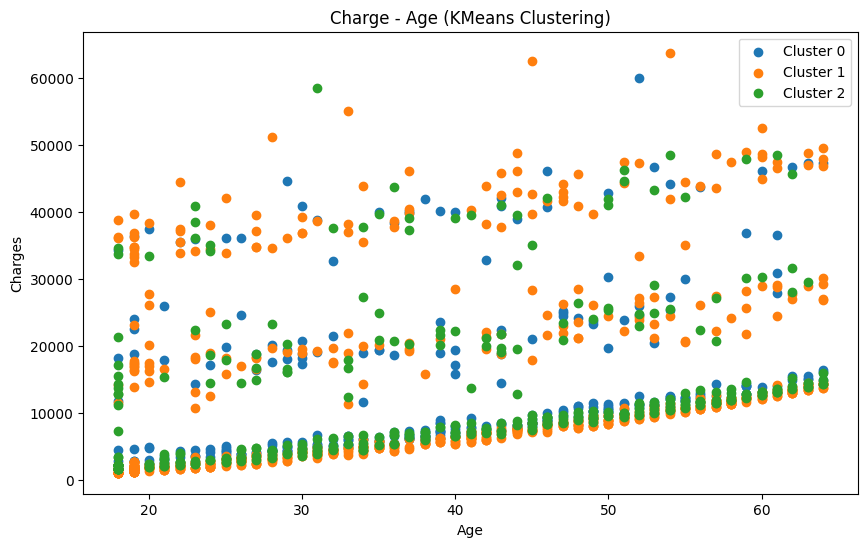

In [58]:
# Spectral Clustering 적용 (선형 커널)
spectral = SpectralClustering(n_clusters=3, affinity='linear', random_state=42)
clusters = spectral.fit_predict(X)

# 생성된 cluster를 X에 새로운 컬럼으로 추가
X['cluster'] = clusters


# 시각화를 위해 age 컬럼을 다시 추가
X['age'] = train['age']
X['charges'] = train['charges']

# 클러스터링 결과를 시각화
plt.figure(figsize=(10, 6))
for cluster in range(n):
    clustered_data = X[X['cluster'] == cluster]
    plt.scatter(clustered_data['age'], clustered_data['charges'], label=f'Cluster {cluster}')

plt.xlabel('Age')
plt.ylabel('Charges')
plt.title('Charge - Age (KMeans Clustering)')
plt.legend()
plt.show()

Spectral Clustering으로 진행해도 원하는 군집화는 불가능하다. 가설 완전 기각

#### bmi & 독립변수 확인

Text(0.5, 1.0, 'Scatter plot of Charges vs bmi(region)')

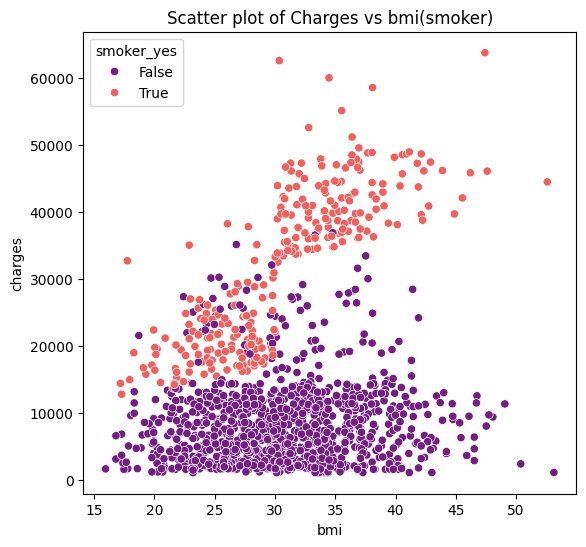

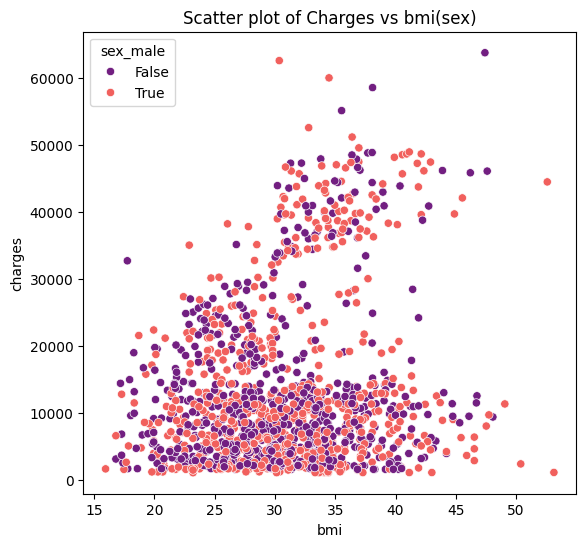

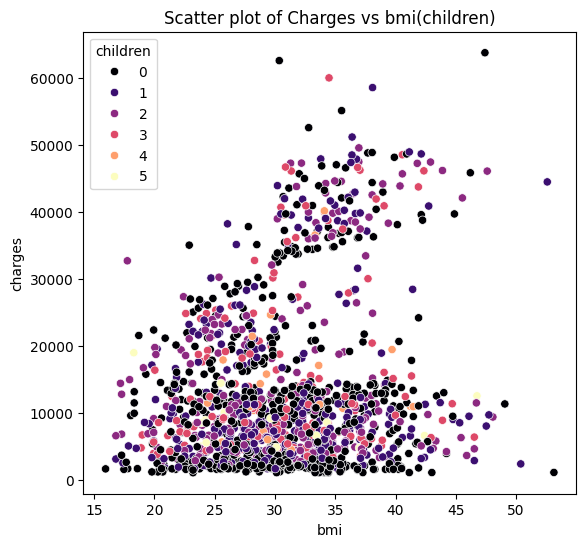

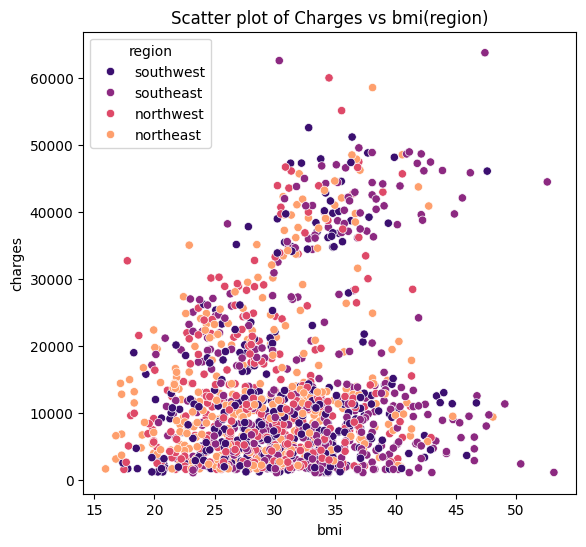

In [59]:
f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='bmi',y='charges',data=train,palette='magma',hue='smoker_yes',ax=ax)
ax.set_title('Scatter plot of Charges vs bmi(smoker)')

f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='bmi',y='charges',data=train,palette='magma',hue='sex_male',ax=ax)
ax.set_title('Scatter plot of Charges vs bmi(sex)')

f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='bmi',y='charges',data=train,palette='magma',hue='children',ax=ax)
ax.set_title('Scatter plot of Charges vs bmi(children)')

f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='bmi',y='charges',data=train,palette='magma',hue='region',ax=ax)
ax.set_title('Scatter plot of Charges vs bmi(region)')

- smoker을 제외한 나머지 독립변수들은 선형 관계가 보이지 않는다
- smoker-bmi의 경우는 약간의 선형 관계는 볼 수 있으나, 이는 bmi와 smoker가 함께 만들어내는 것이 아닌, smoker의 영향으로만 만들어낸 값들이다

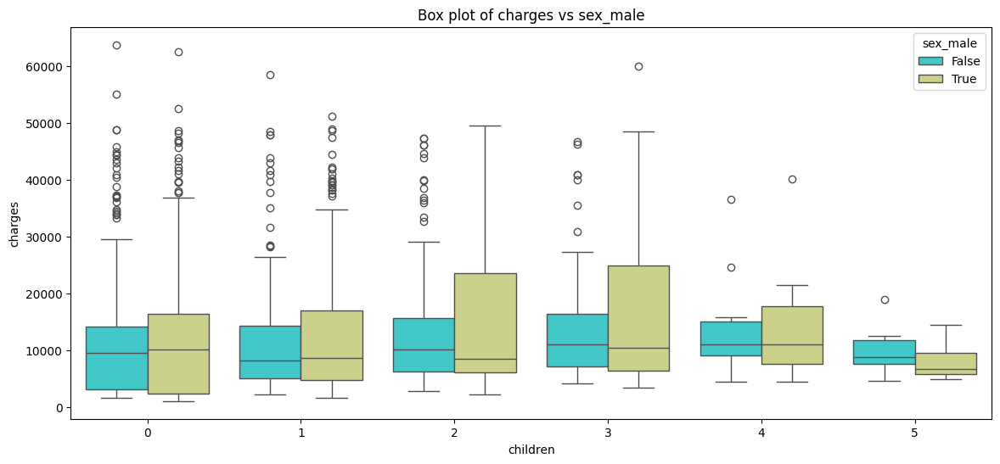

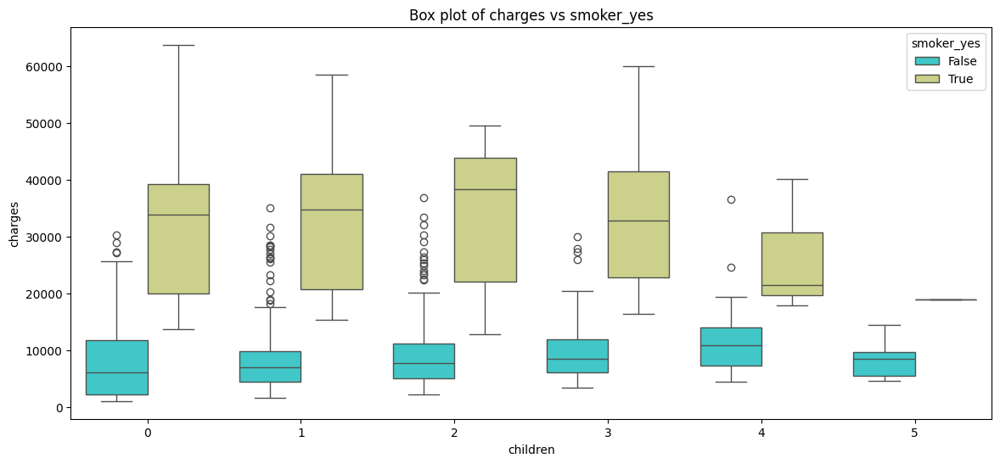

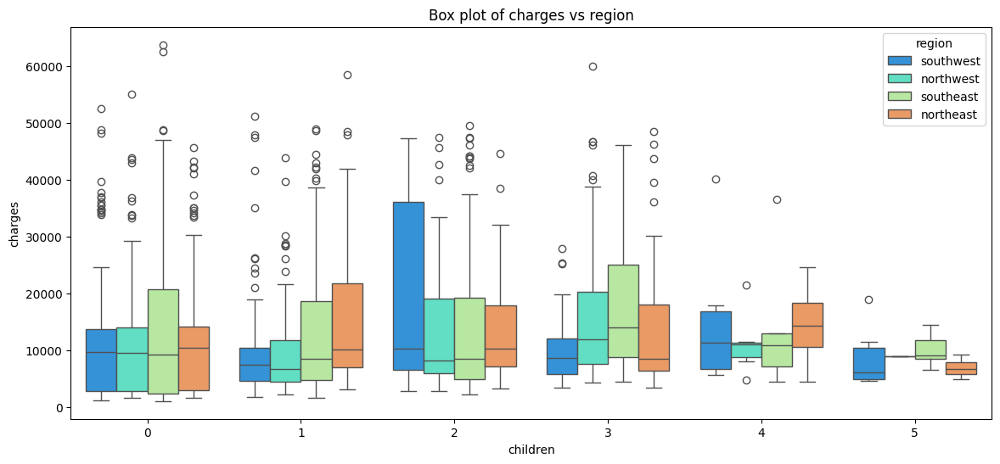

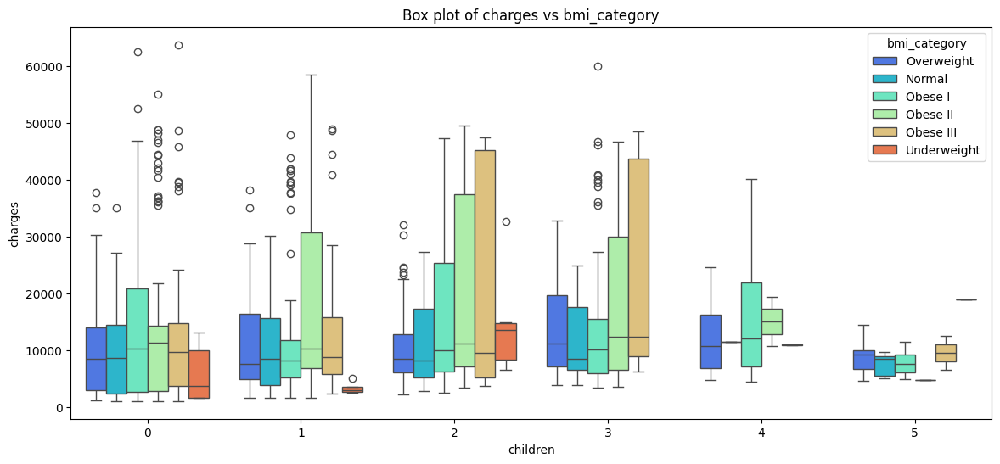

In [60]:
hue_list = ['sex_male', 'smoker_yes', 'region', 'bmi_category']

for hue in hue_list:
  plt.figure(figsize=(14,6))
  sns.boxplot(x='children', y='charges',hue=hue,data=train,palette='rainbow')
  plt.title('Box plot of charges vs '+ hue);

#### sex_male & region

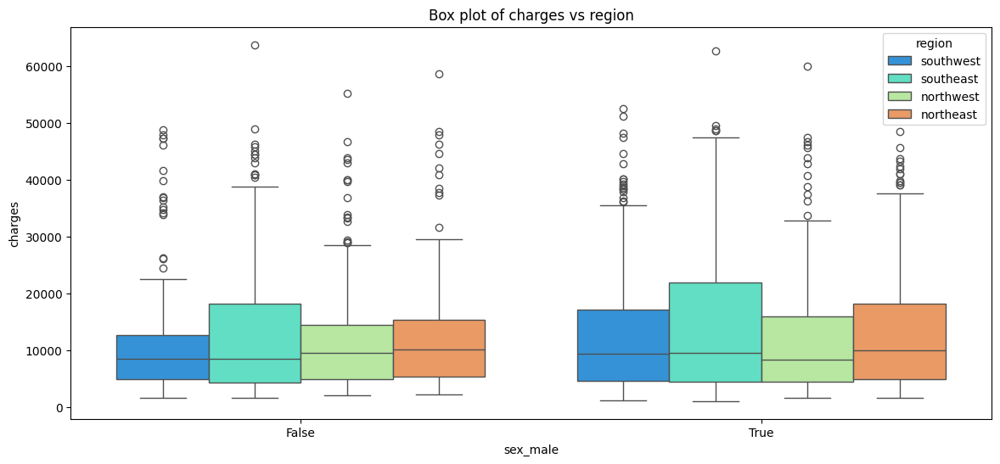

In [61]:
hue_list = ['region']

for hue in hue_list:
  plt.figure(figsize=(14,6))
  sns.boxplot(x='sex_male', y='charges',hue=hue,data=train,palette='rainbow')
  plt.title('Box plot of charges vs '+ hue);

In [62]:
df = train.copy()

# 예시 데이터프레임 (df) 생성
# df에는 'sex_male', 'region', 'charges' 열이 있다고 가정합니다.

# 'sex_male'과 'region'을 결합하여 새로운 카테고리 생성
df['category'] = df['sex_male'].map({True: 'male', False: 'female'}) + '_' + df['region']

# 각 새로운 카테고리별 charges 데이터 분리
categories = df['category'].unique()  # 총 8개의 고유 카테고리 추출
grouped_charges = [df[df['category'] == category]['charges'] for category in categories]

# Kruskal-Wallis H Test 수행
h_stat, p_value = sp.stats.kruskal(*grouped_charges)  # 각 그룹별 데이터 리스트를 언패킹하여 전달

print(f"H-statistic: {h_stat:.4f}, p-value: {p_value:.4f}")

# 결과 해석
alpha = 0.05
if p_value < alpha:
    print("카테고리(sex & region) 간의 의료비 차이는 통계적으로 유의미합니다. (귀무가설 기각)")
else:
    print("카테고리(sex & region) 간의 의료비 차이는 통계적으로 유의미하지 않습니다. (귀무가설 채택)")


H-statistic: 6.7290, p-value: 0.4576
카테고리(sex & region) 간의 의료비 차이는 통계적으로 유의미하지 않습니다. (귀무가설 채택)


#### 가설 3) 부양가족(children)의 수와 charges가 정비례하지 않는 것은 부양가족이 늘어날수록 가족 구성원 1인당 보험 청구료가 감소하기 때문이다 (O)

#### 아래와 같은 가정을 해보자

- children이 0인 경우는 본인 청구료를 지불하는 경우이다 (+1)
- children이 1~5인 경우는 가족보험에 가입한 경우이다. 이때 전체 가족 구성원은 +2이다
- 즉, 우리는 전통적인 가족 구성의 형태를 기본으로 생각하며 한부모 가정(children + 1)이나 딩크족(children = 0, but total_people = 2)과 같은 예외 케이스는 없다고 가정한다.
- 이 떄, 가족 구성원 1인당 보험 청구료(charge_per_person = charges / total_people)을 계산해보자

In [63]:
def total_people(children):
    if children == 0:
        # 개인 보험인 경우
        return 1
    else:
        # 가족 보험인 경우 (배우자(1)+본인(1)+자식(n))
        return children + 2

In [64]:
train_cpp = train.copy()
train_cpp['total_people'] = train_cpp['children'].apply(total_people)

In [65]:
# 가족구성원 1인당 청구비용을 확인해본다
train_cpp['charge_per_person'] = train_cpp['charges'] / train_cpp['total_people']
train_cpp.head()

,age,bmi,children,region,charges,sex_male,smoker_yes,bmi_category,total_people,charge_per_person
0,19,27.900,0,southwest,16884.92400,False,True,Overweight,1,16884.92400
1,18,33.770,1,southeast,1725.55230,True,False,Obese I,3,575.18410
2,28,33.000,3,southeast,4449.46200,True,False,Obese I,5,889.89240
3,33,22.705,0,northwest,21984.47061,True,False,Normal,1,21984.47061
4,32,28.880,0,northwest,3866.85520,True,False,Overweight,1,3866.85520


In [66]:
train_cpp['charge_per_person'].describe()

,charge_per_person
count,1337.000000
mean,7433.262185
std,9323.099228
min,570.342267
25%,1800.425213
50%,3287.008333
75%,10072.055050
max,63770.428010


Text(0.5, 1.0, 'charge per people vs total_people')

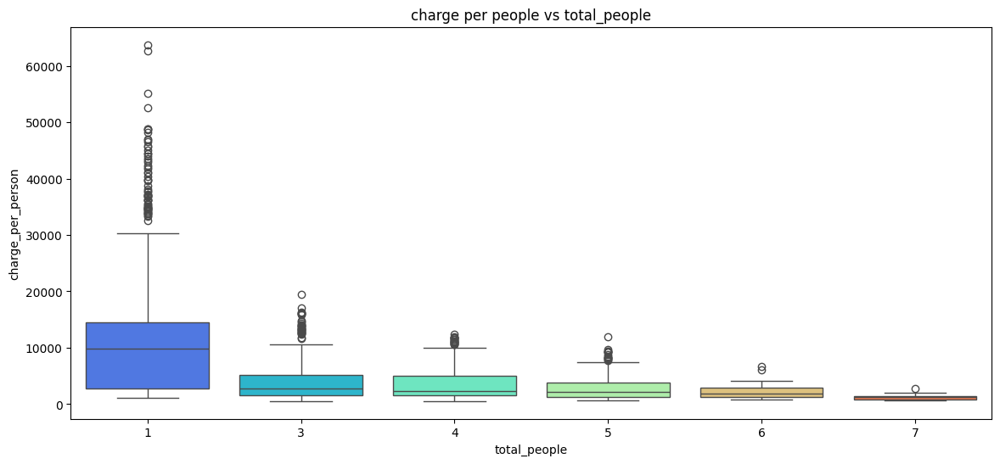

In [67]:
plt.figure(figsize=(14,6))
sns.boxplot(x='total_people', y='charge_per_person',data=train_cpp,palette='rainbow')
plt.title('charge per people vs total_people')

In [68]:
# children별 charge_per_person의 통계값 계산
child_stats = train_cpp.groupby('children').describe()

# 결과 확인
child_stats['charge_per_person']

,count,mean,std,min,25%,50%,75%,max
children,,,,,,,,
0,573.0,12384.695344,12025.424152,1121.873900,2741.948000,9863.471800,14449.854400,63770.428010
1,324.0,4243.723944,3941.210484,570.342267,1597.214392,2827.956717,5210.684017,19523.691493
2,240.0,3768.390933,3222.842087,576.000550,1571.234859,2316.244787,5094.819187,12394.415600
3,157.0,3071.063673,2466.173897,688.612800,1330.505760,2120.109660,3839.988800,12004.279794
4,25.0,2308.442719,1523.203887,750.777067,1252.044500,1838.943617,2854.737680,6697.041000
5,18.0,1255.147892,544.062218,669.685286,839.281986,1227.080721,1431.420568,2717.608571


아래와 같은 인사이트를 얻을 수 있다

1. 가족 구성원 수와 1인당 청구금액의 역상관 관계

- 가족 구성원이 적을수록 1인당 청구금액이 높고, 가족 구성원이 많을수록 1인당 청구금액이 낮아지는 경향이 보인다. 특히 가족 구성원이 1명인 경우(즉, 보험 가입자 본인만 있는 경우) 1인당 청구금액이 매우 높은 반면, 구성원이 늘어날수록 1인당 보험료가 급격히 감소한다.

2. 청구금액의 변동성
- 가족 구성원이 1명인 경우, 1인당 보험료의 분포가 매우 넓고, 이상치(outliers)도 많이 존재한다. 이는 가족 구성원이 1명일 경우 개인의 건강 상태, 나이, 흡연 여부 등 다양한 요인이 보험료에 큰 영향을 미칠 수 있음을 의미한다. 반면 가족 구성원이 많은 경우, 1인당 청구금액의 변동성은 비교적 적고, 분포가 좁아집니다. 이는 가족이 많을수록 개별 차이에 따른 보험료 차이가 줄어드는 경향을 나타낸다

3. 가족 구성원 3명 이상의 경우
- 가족 구성원이 3명 이상인 경우, 1인당 청구금액은 매우 낮은 수준에서 안정적으로 유지된다. 이러한 안정성은 대가족의 경우 보험료가 더 균일하게 분포될 가능성을 시사합니다. 이는 보험사가 가족 단위로 위험을 평가할 때, 개별 구성원의 건강 위험보다는 전체적인 가족 단위의 위험을 더 중시할 수 있음을 나타낼 수 있습니다.

그렇다면 왜 위 가설이 옳을까?
- 보험사에서 제공하는 가족 특가 상품의 coverage
- 다자녀 가정에 대한 국가의 지원이 있을 수 있음
- 가족 구성원이 많을수록 차상위계층에 가까울 가능성이 높음. 따라서 보험금에 큰 금액을 지불할 의사가 없는 경우가 있을 수 있음 혹은 보험금에 부담이 되어 비교적 저렴한 상품에 가입할 가능성이 있음

## 2. 사용 모델의 종류 및 metric은 어떻게 설정해야 할까?

- 기본적인 선형 회귀 실습인 만큼 일반적으로 많이 사용하는 몇가지 metric들이 있다
  - r^2 : 전체 변동성 중에서 모델이 설명할 수 있는 변동성의 비율을 나타냅니다. 값이 1에 가까울수록 모델이 데이터를 잘 설명하는 것입니다.
  - mae : 예측 오차의 평균 크기를 절대값으로 나타내어, 오차의 크기를 쉽게 해석할 수 있습니다. 직관적으로 얼마나 예측이 실제와 차이가 나는지를 보여줍니다.
  - mse / rmse: 오차를 제곱하여 큰 오차를 더 강조하여 평가합니다. 큰 오차가 있는 경우 이를 더 크게 반영하기 때문에, 오차를 줄이는 모델을 만들 때 유용합니다. rmse는 오차의 크기를 실제 단위로 돌려놓아 해석에 더 직관적입니다.

- 하지만, 보험사의 입장에서 생각해 볼 때, 예측값(charges)이 실제보다 낮게 나오는 경우는 보험금(premium)을 과소 책정하게 되어 재정적 손실로 이어질 수 있다. 반면, 예측값이 실제보다 높게 나오는 경우는 보험료를 과대 책정하여 손실을 방지할 수 있어, 실무적으로 유리할 수 있다.

- 따라서, 실습에서는 세가지 회귀방식을 사용해 볼 것이다

  - OLS
    - loss function : MSE
  - gradient descent
    - loss function : custom MSE
  - quantile regression (폐기)
    - loss function : pinball loss

In [69]:
def create_model():
    model = Sequential([
        Dense(1, input_shape=(X.shape[1],), activation='linear')  # 선형 회귀 모델
    ])
    model.compile(optimizer=Adam(learning_rate=0.1), loss=asymmetric_loss)
    return model

In [70]:
def gd_model(learning_rate=0.1):
    model = Sequential([
        Dense(1, input_shape=(X.shape[1],), activation='linear')  # 선형 회귀 모델
    ])
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss=asymmetric_loss)
    return model

In [71]:
def asymmetric_loss(y_true, y_pred):
    # 과소평가 시 2배 페널티, 과대평가 시 일반 페널티 적용
    loss = tf.where(y_pred < y_true,
                    2 * tf.square(y_true - y_pred),  # 과소평가 시 2배 페널티
                    tf.square(y_pred - y_true))     # 과대평가 시 일반 페널티
    return tf.reduce_mean(loss)  # 텐서 연산만 사용, 숫자로 변환하지 않음

def asymmetric_loss_scorer(y_true, y_pred):
    # 넘파이 배열에서 계산 수행
    loss = np.where(y_pred < y_true,
                    2 * (y_true - y_pred) ** 2,  # 과소평가 시 2배 페널티
                    (y_pred - y_true) ** 2)     # 과대평가 시 일반 페널티
    return np.mean(loss)  # 숫자 스칼라 값 반환

## 3. feature및 종속변수를 어떻게 사용해야 할까?

- 데이터의 컬럼 수가 적기 때문에 기본적으로 모든 독립변수들을 feature로 사용할 것이다
- 필요에 따라 규제를 적용하여 변수의 영향력을 조정할 수 있다

#### region
- 결론적으로, south/east의 binary encoding을 사용한다
- 기존에 binary encoding을 사용했던 region의 encoding 방식을 바꿔보자
- binary encoding의 경우 해석력이 떨어지고, 독립변수(region_0~region2) 사이의 상관관계가 크게 나타나기 때문에 다른 방식을 도입해 본다

1. 지역별로 의료비용에 유의미한 차이가 있다는 가정을 기반으로 target encoding을 고려해 보자

In [72]:
# bmi_category별 charges의 통계값 계산
region_charges_stats = train.groupby('region')['charges'].describe()

# 결과 확인
region_charges_stats

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
northeast,324.0,13406.384516,11255.803066,1694.7964,5194.322288,10057.652025,16687.364100,58571.07448
northwest,324.0,12450.840844,11073.125699,1621.3402,4733.635288,8976.977250,14788.747863,60021.39897
southeast,364.0,14735.411438,13971.098589,1121.8739,4440.886200,9294.131950,19526.286900,63770.42801
southwest,325.0,12346.937377,11557.179101,1241.5650,4751.070000,8798.593000,13462.520000,52590.82939


In [73]:
# 평균과 중앙값 계산
mean_values = region_charges_stats['mean']
median_values = region_charges_stats['50%']

# 평균과 중앙값 차이의 백분율 계산
percent_diff = ((mean_values - median_values) / mean_values * 100).abs()

# 그룹별 평균의 백분율 차이 계산
mean_percent_diff = mean_values.pct_change().fillna(0) * 100

# 그룹별 중앙값의 백분율 차이 계산
median_percent_diff = median_values.pct_change().fillna(0) * 100

# 백분율 차이 결과 출력
result = pd.DataFrame({
    'mean': mean_values,
    'mean_percent_difference': mean_percent_diff,
    'median': median_values,
    'median_percent_difference': median_percent_diff
})

result

,mean,mean_percent_difference,median,median_percent_difference
region,,,,
northeast,13406.384516,0.000000,10057.652025,0.000000
northwest,12450.840844,-7.127527,8976.977250,-10.744802
southeast,14735.411438,18.348725,9294.131950,3.532979
southwest,12346.937377,-16.209076,8798.593000,-5.331740


- 제공된 지역 데이터 간 평균에 차이는 꽤 있지만, IQR RANGE를 벗어나는 값이 많아 평균이 충분한 대표성이 있다고 보기 힘들다

- 이상치에 영향을 줄일 수 있는 중앙값의 경우는 그룹별 차이가 크지 않다

2. 내장된 binary encoding과 비슷하지만, 해석력을 높일 수 있고 컬럼을 하나 덜 생성하는 인코딩 방식을 적용한다

In [74]:
# south / east를 각각 컬럼으로 encoding -> 해석력 up
train_re1 = train.copy()

region_mapping = {
    'southeast': {'south': 1, 'east': 1},
    'southwest': {'south': 1, 'east': 0},
    'northeast': {'south': 0, 'east': 1},
    'northwest': {'south': 0, 'east': 0}
}

# 매핑 적용하여 새로운 컬럼 생성
train_re1[['south', 'east']] = train_re1['region'].apply(lambda x: pd.Series(region_mapping[x]))

train_re1['charges'] = np.log1p(train_re1['charges'])
train_re1.drop(['region', 'bmi_category'], axis=1, inplace=True)

# 결과 확인
train_re1.head()

,age,bmi,children,charges,sex_male,smoker_yes,south,east
0,19,27.900,0,9.734236,False,True,1,0
1,18,33.770,1,7.453882,True,False,1,1
2,28,33.000,3,8.400763,True,False,1,1
3,33,22.705,0,9.998137,True,False,0,0
4,32,28.880,0,8.260455,True,False,0,0


In [75]:
# 피처와 타겟 변수 분리
X = train_re1.drop('charges', axis=1)
y = train_re1['charges']

# 데이터 분할 (훈련 세트와 테스트 세트)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 선형 회귀 모델 생성 및 훈련
model = LinearRegression()
model.fit(X_train, y_train)

# 예측 수행
y_pred = model.predict(X_test)

# 모델 성능 평가
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Root Mean Squared Error: {rmse}")
print(f"R^2 Score: {r2}")

# 회귀 계수 확인
coefficients = pd.DataFrame(model.coef_, X.columns, columns=['Coefficient'])
print(coefficients)

Root Mean Squared Error: 0.39925183524398966
R^2 Score: 0.8282098248171141
            Coefficient
age            0.034035
bmi            0.012719
children       0.099043
sex_male      -0.076895
smoker_yes     1.536318
south         -0.092166
east           0.007614


- binary encoding을 적용한 결과
  - Mean Squared Error: 0.1582247225342882
  - R^2 Score: 0.8294786261333561

- MSE 약간 증가
- R^2가 약간 증가하는 모습을 확인 가능

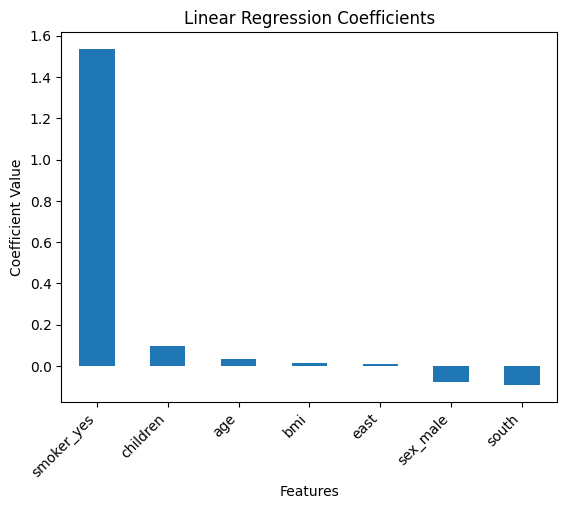

In [76]:
coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

In [77]:
crammers_v_e_s = cramers_v_0_1 = calculate_cramers_v(train_re1['east'], train_re1['south'])
# 결과 출력
print(f"Cramér's V (east & south): {crammers_v_e_s:.4f}")

Cramér's V (east & south): 0.0268


기존보다 회귀계수의 해석이 더 용이하며, 인코딩한 컬럼들의 상관계수(crammer's V 가 유의마하게 작아진다)

#### bmi

- bmi의 경우 두가지 선택지가 있다
  - 1. 그대로 사용하기
  - 2. 그룹화 2번을 적용하여 target encoding

#### smoker

- 두가지 선택지가 있다
  - 1. 그대로 사용 (O)
  - 2. 오버 샘플링 (X)

- 가장 중요한 독립변수지만, 클라스 불균형 문제가 존재한다.
- 단순 회귀분석에서 일반적인 해결책은 아래와 같다
  - 오버 샘플링 : 소수 클래스의 샘플 수를 늘리는 방법으로, 데이터의 복제본을 생성하거나, 새로운 데이터를 합성하여 학습 데이터의 균형을 맞춥니다.
    - random oversampling, SMOTE
    - 장점 : 소수 클래스의 정보가 손실되지 않고 모델이 더 균형 잡힌 데이터를 학습할 수 있습니다.
    - 단점 : 오버샘플링된 데이터가 학습 데이터에 과적합(Overfitting)을 유발할 수 있습니다.
  - 언더 샘플링 : 다수 클래스의 샘플 수를 줄이는 방법으로, 데이터를 무작위로 선택하여 제거합니다.
    - Random Undersampling, Tomek Links 및 NearMiss
    - 장점 : 다수 클래스의 중요하지 않은 데이터를 제거하여 모델 성능을 향상시킬 수 있습니다.
    - 단점 : 중요한 정보가 손실될 위험 및 데이터가 작아져 모델의 학습에 충분하지 않을 수 있음

- 독립변수의 클래스 불균형 문제는 일반적으로 큰 문제가 되지는 않지만, 선형 회귀 모델에서 설명력이 가장 큰 변수인 만큼 random forest로 smoker 클래스 불균형이 모델 성능에 유의미한 영향을 미칠지 확인해보자

In [78]:
train.head()

,age,bmi,children,region,charges,sex_male,smoker_yes,bmi_category
0,19,27.900,0,southwest,16884.92400,False,True,Overweight
1,18,33.770,1,southeast,1725.55230,True,False,Obese I
2,28,33.000,3,southeast,4449.46200,True,False,Obese I
3,33,22.705,0,northwest,21984.47061,True,False,Normal
4,32,28.880,0,northwest,3866.85520,True,False,Overweight


In [79]:
train_c3 = train.copy()
train_c3[['south', 'east']] = train_c3['region'].apply(lambda x: pd.Series(region_mapping[x]))
train_c3.drop(['region', 'bmi_category'], axis=1, inplace=True)

# X는 독립변수, y는 이진 범주형 변수인 'smoker'
X = train_c3.drop(['smoker_yes', 'charges'], axis=1)  # smoker 변수 제외한 나머지 독립변수들
y = train_c3['smoker_yes']  # 종속 변수인 smoker

# Original dataset split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Model training on the original dataset
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)
y_pred_orig = model.predict(X_test)

# Evaluate the original model
print("Original Data Performance:")
print(classification_report(y_test, y_pred_orig))
print("AUC-ROC:", roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_orig))

Original Data Performance:
              precision    recall  f1-score   support

       False       0.79      0.92      0.85       213
        True       0.11      0.04      0.05        55

    accuracy                           0.74       268
   macro avg       0.45      0.48      0.45       268
weighted avg       0.65      0.74      0.69       268

AUC-ROC: 0.46005121638924457
Confusion Matrix:
 [[196  17]
 [ 53   2]]


클래스 불균형이 존재하는 smoker를 종속변수로 삼아 random forest를 진행한 결과 recall / f1 값이 매우 높다. 독립 변수(smoker)에서 클래스 불균형이 존재하더라도, 다른 독립 변수들이 충분히 설명력을 제공할 수 있기 때문에 여기서 발생한 불균형에 대해서는 따로 처리하지 않아도 무방할 것 같다

#### 종속변수 (charges VS CPP)

- charges가 정규분포에 더 가깝지만, CPP가 전반적인 상관계수가 크다
  - 이상치의 영향 (tie)
  - 변수의 분포와 정규성 (charges)
  - 변수의 스케일과 해석력 (tie)
  - 독립변수와의 상관관계 (cpp)

종속변수 후보들의 로그 스케일링 진행

In [80]:
train_normal = train_cpp.copy()
train_normal['charge_per_person'] = np.log1p(train_normal['charge_per_person'])
train_normal['charges'] = np.log1p(train_normal['charges'])
train_normal.head()

,age,bmi,children,region,charges,sex_male,smoker_yes,bmi_category,total_people,charge_per_person
0,19,27.900,0,southwest,9.734236,False,True,Overweight,1,9.734236
1,18,33.770,1,southeast,7.453882,True,False,Obese I,3,6.356427
2,28,33.000,3,southeast,8.400763,True,False,Obese I,5,6.792224
3,33,22.705,0,northwest,9.998137,True,False,Normal,1,9.998137
4,32,28.880,0,northwest,8.260455,True,False,Overweight,1,8.260455


#### 종속변수 - 이상치의 영향

- charges의 경우 z-score가 3을 넘어가는 데이터가 없었음
- cpp도 마찬가지로 z-score가 3을 넘어가는 데이터가 없다

In [81]:
# Z-score 계산
train_normal['cpp_zscore'] = zscore(train_normal['charge_per_person'])

# Z-score가 3을 넘어가는 값 확인
outliers = train_normal[train_normal['cpp_zscore'].abs() > 3]

# Z-score가 3을 넘는 값의 개수와 인덱스 출력
outlier_count = len(outliers)
print(f"Z-score가 3을 넘는 값의 개수: {outlier_count}")
print(outliers[['charge_per_person', 'cpp_zscore']])

Z-score가 3을 넘는 값의 개수: 0
Empty DataFrame
Columns: [charge_per_person, cpp_zscore]
Index: []


#### 종속변수 - 분포와 정규성

- standard scaler를 사용해 표준화 후 시각화 비교
- 정확한 비교를 위해 정규성 검정 진행

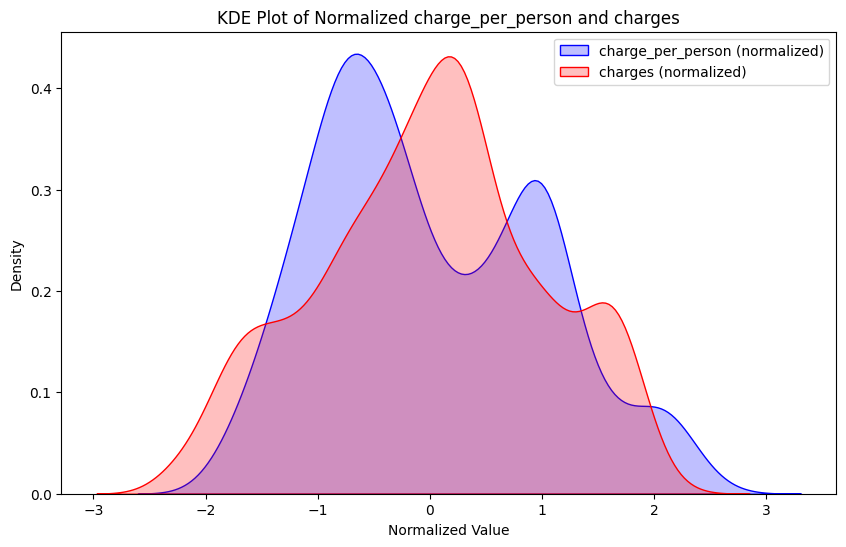

In [82]:
scaler = StandardScaler()
train_normal[['charge_per_person_normalized', 'charges_normalized']] = scaler.fit_transform(
    train_normal[['charge_per_person', 'charges']])

# KDE 플롯 시각화 (정규화된 데이터)
plt.figure(figsize=(10, 6))
sns.kdeplot(train_normal['charge_per_person_normalized'], shade=True, color='blue', label='charge_per_person (normalized)')
sns.kdeplot(train_normal['charges_normalized'], shade=True, color='red', label='charges (normalized)')
plt.title('KDE Plot of Normalized charge_per_person and charges')
plt.xlabel('Normalized Value')
plt.ylabel('Density')
plt.legend()
plt.show()

In [83]:
train.head()

,age,bmi,children,region,charges,sex_male,smoker_yes,bmi_category
0,19,27.900,0,southwest,16884.92400,False,True,Overweight
1,18,33.770,1,southeast,1725.55230,True,False,Obese I
2,28,33.000,3,southeast,4449.46200,True,False,Obese I
3,33,22.705,0,northwest,21984.47061,True,False,Normal
4,32,28.880,0,northwest,3866.85520,True,False,Overweight


In [84]:
train_line = train.copy()

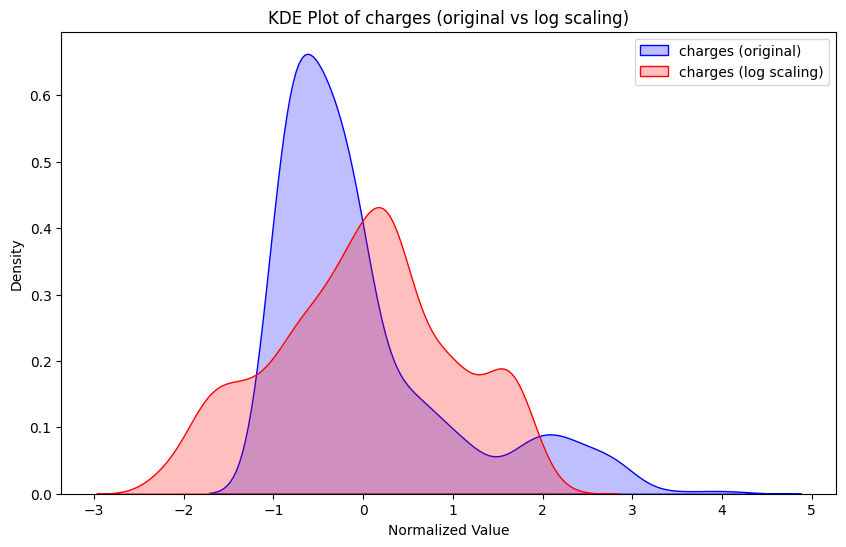

In [85]:
scaler = StandardScaler()
train_normal[['charge_per_person_normalized', 'charges_normalized']] = scaler.fit_transform(
    train_normal[['charge_per_person', 'charges']])

train_line[['charges_normalized']] = scaler.fit_transform(train_line[['charges']])

# KDE 플롯 시각화 (정규화된 데이터)
plt.figure(figsize=(10, 6))
sns.kdeplot(train_line['charges_normalized'], shade=True, color='blue', label='charges (original)')
sns.kdeplot(train_normal['charges_normalized'], shade=True, color='red', label='charges (log scaling)')
plt.title('KDE Plot of charges (original vs log scaling)')
plt.xlabel('Normalized Value')
plt.ylabel('Density')
plt.legend()
plt.show()

Shapiro-Wilk test 결과 둘 다 귀무가설 기각, charges가 조금 더 정규분포에 가까움

In [86]:
# Shapiro-Wilk 검정 수행
stat_cpp, p_value_cpp = shapiro(train_normal['charge_per_person_normalized'])
stat_charges, p_value_charges = shapiro(train_normal['charges_normalized'])

# 결과 출력
print(f"Shapiro-Wilk Test Statistic for charge_per_person: {stat_cpp:.4f}")
print(f"P-value for charge_per_person: {p_value_cpp:.4f}")
if p_value_cpp > 0.05:
    print("The distribution of 'charge_per_person_standardized' is likely normal (fail to reject H0).\n")
else:
    print("The distribution of 'charge_per_person_standardized' is not normal (reject H0).\n")

print(f"Shapiro-Wilk Test Statistic for charges: {stat_charges:.4f}")
print(f"P-value for charges: {p_value_charges:.4f}")
if p_value_charges > 0.05:
    print("The distribution of 'charges' is likely normal (fail to reject H0).\n")
else:
    print("The distribution of 'charges' is not normal (reject H0).\n")

# 정규분포에 더 가까운 변수 선택
if stat_cpp > stat_charges:
    print("charge_per_person is closer to a normal distribution.")
else:
    print("charges is closer to a normal distribution.")


Shapiro-Wilk Test Statistic for charge_per_person: 0.9654
P-value for charge_per_person: 0.0000
The distribution of 'charge_per_person_standardized' is not normal (reject H0).

Shapiro-Wilk Test Statistic for charges: 0.9833
P-value for charges: 0.0000
The distribution of 'charges' is not normal (reject H0).

charges is closer to a normal distribution.


Kolmogorov-Smirnov Test 결과 CPP만 귀무가설 기각, charges가 더 정규분포에 가까움

In [87]:
# 정규성 검정을 위한 Kolmogorov-Smirnov Test
ks_stat_cpp, ks_p_value_cpp = kstest(train_normal['charge_per_person_normalized'], 'norm')
ks_stat_charges, ks_p_value_charges = kstest(train_normal['charges_normalized'], 'norm')

# 결과 출력
print(f"KS Test Statistic for charge_per_person: {ks_stat_cpp:.4f}")
print(f"P-value for charge_per_person: {ks_p_value_cpp:.4f}")
if ks_p_value_cpp > 0.05:
    print("The distribution of 'charge_per_person_standardized' is likely normal (fail to reject H0).\n")
else:
    print("The distribution of 'charge_per_person_standardized' is not normal (reject H0).\n")

print(f"KS Test Statistic for charges: {ks_stat_charges:.4f}")
print(f"P-value for charges: {ks_p_value_charges:.4f}")
if ks_p_value_charges > 0.05:
    print("The distribution of 'charges' is likely normal (fail to reject H0).\n")
else:
    print("The distribution of 'charges' is not normal (reject H0).\n")

# 정규분포에 더 가까운 변수 선택
if ks_stat_cpp < ks_stat_charges:
    print("charge_per_person is closer to a normal distribution based on KS Test.")
else:
    print("charges is closer to a normal distribution based on KS Test.")


KS Test Statistic for charge_per_person: 0.0926
P-value for charge_per_person: 0.0000
The distribution of 'charge_per_person_standardized' is not normal (reject H0).

KS Test Statistic for charges: 0.0367
P-value for charges: 0.0536
The distribution of 'charges' is likely normal (fail to reject H0).

charges is closer to a normal distribution based on KS Test.


#### 종속변수 - 스케일과 해석력

- 두 후보 모두 달러($) 기준
- cpp = charges / total_people로 해석력 측면에서 상당히 유사한 의미를 갖고 있지만, 미묘한 차이가 있다.
 - charges : 한 가족의 전체 의료비용
 - cpp : 가족 구성원 1인의 평균 의료비용
- 보험사 입장에서 생각해보면, charges를 정확하게 예측하는 것이 목표일 것이다. 이런 경우에는 해석력의 미묘한 차이보다, 두 종속변수 중 예측 정확도가 더 높은 경우를 선택하는 것이 좋다고 판단된다

#### 종속변수 - 독립변수와의 상관관계

In [88]:
# category 6개인 경우
bmi_mapping = {
    'Normal': np.log1p(10409),
    'Obese I': np.log1p(14452),
    'Obese II': np.log1p(17022),
    'Obese III': np.log1p(16785),
    'Overweight': np.log1p(10988),
    'Underweight': np.log1p(8852)
}

train_normal['bmi_category'] = train_normal['bmi_category'].map(bmi_mapping)
train_normal[['south', 'east']] = train_normal['region'].apply(lambda x: pd.Series(region_mapping[x]))

# 수치형 변수 및 target encoding을 진행한 변수들은 pearson 상관계수를 사용
train_normal_num = train_normal[['age', 'bmi', 'total_people', 'charges', 'charge_per_person', 'bmi_category']]
# 이진 범주형 변수들은 Point-Biserial Correlation을 사용
train_normal_cat = train_normal[['south', 'east', 'sex_male', 'smoker_yes', 'charges', 'charge_per_person']]

In [89]:
# Numeric 변수와 종속 변수의 상관계수 (Pearson Correlation)
corr_charge_per_person_num = train_normal_num.corr()['charge_per_person'].sort_values(ascending=False)
corr_charges_num = train_normal_num.corr()['charges'].sort_values(ascending=False)

print("Numeric Correlation with charge_per_person:\n", corr_charge_per_person_num, "\n")
print("Numeric Correlation with charges:\n", corr_charges_num, "\n")

Numeric Correlation with charge_per_person:
 charge_per_person    1.000000
charges              0.765714
age                  0.429663
bmi_category         0.118942
bmi                  0.105513
total_people        -0.492295
Name: charge_per_person, dtype: float64 

Numeric Correlation with charges:
 charges              1.000000
charge_per_person    0.765714
age                  0.526900
total_people         0.165564
bmi_category         0.138724
bmi                  0.132831
Name: charges, dtype: float64 



In [90]:
# 이진 범주형 변수들과 종속 변수 간의 Point-Biserial Correlation 계산
binary_vars = ['south', 'east', 'sex_male', 'smoker_yes']

# Point-Biserial Correlation 계산 함수
def calculate_point_biserial(cat_var, num_var):
    return pointbiserialr(cat_var, num_var)[0]

# 각 이진 변수와 charge_per_person, charges의 상관계수 계산
corrs_cpp = {var: calculate_point_biserial(train_normal_cat[var], train_normal_cat['charge_per_person']) for var in binary_vars}
corrs_charges = {var: calculate_point_biserial(train_normal_cat[var], train_normal_cat['charges']) for var in binary_vars}

# 결과를 시리즈로 변환하여 출력
corrs_cpp_series = pd.Series(corrs_cpp).sort_values(ascending=False)
corrs_charges_series = pd.Series(corrs_charges).sort_values(ascending=False)

print("Categorical Correlation with charge_per_person:\n", corrs_cpp_series, "\n")
print("Categorical Correlation with charges:\n", corrs_charges_series, "\n")

Categorical Correlation with charge_per_person:
 smoker_yes    0.574997
east          0.066535
sex_male     -0.005054
south        -0.018719
dtype: float64 

Categorical Correlation with charges:
 smoker_yes    0.665751
east          0.049683
sex_male      0.007022
south        -0.023113
dtype: float64 



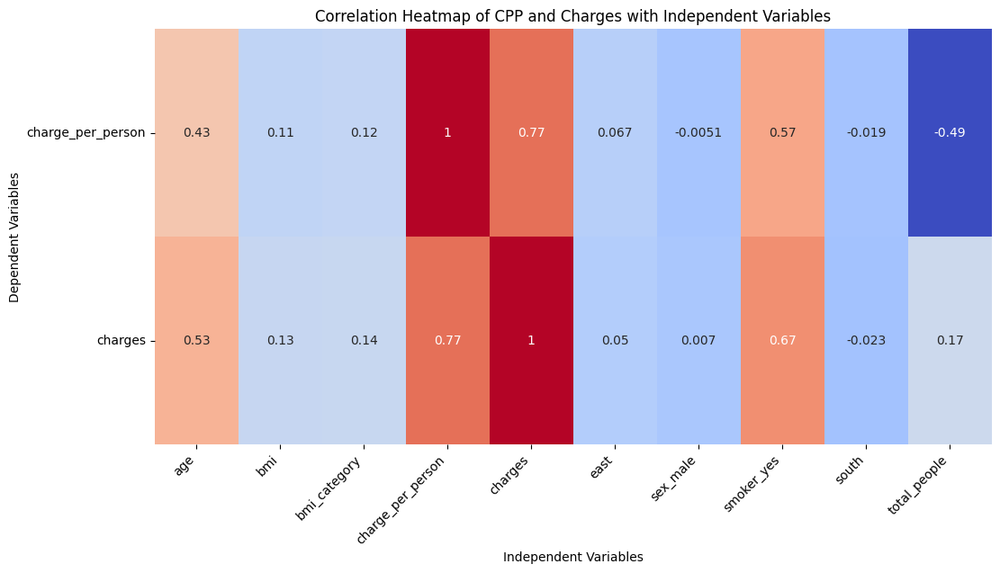

In [91]:
# Numeric 변수와 Categorical 변수의 상관계수 시리즈 합치기
combined_corr_cpp = pd.concat([corr_charge_per_person_num, corrs_cpp_series])
combined_corr_charges = pd.concat([corr_charges_num, corrs_charges_series])

# 두 결과를 하나의 DataFrame으로 합치기
combined_corr = pd.DataFrame({
    'charge_per_person': combined_corr_cpp,
    'charges': combined_corr_charges
}).T

# Heatmap 시각화
plt.figure(figsize=(12, 6))
sns.heatmap(combined_corr, annot=True, cmap='coolwarm', cbar=False, xticklabels=combined_corr.columns, yticklabels=['charge_per_person', 'charges'])
plt.title('Correlation Heatmap of CPP and Charges with Independent Variables')
plt.xlabel('Independent Variables')
plt.ylabel('Dependent Variables')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.show()

상관계수의 크기(절댓값)이 늘어나는 경우와 줄어드는 경우가 섞여 있다. 전반적인 상관관계의 강도를 측정하기 위해 평균 절대 상관계수 (Mean Absolute Correlation)를 계산해보자

In [92]:
# 각 종속 변수에 대해 독립 변수들과의 절대 상관계수 계산
cpp_abs_corr = combined_corr.loc['charge_per_person'].abs()
charges_abs_corr = combined_corr.loc['charges'].abs()

# 평균 절대 상관계수 계산
mean_abs_corr_cpp = cpp_abs_corr.mean()
mean_abs_corr_charges = charges_abs_corr.mean()

print(f"Mean Absolute Correlation with charge_per_person: {mean_abs_corr_cpp:.4f}")
print(f"Mean Absolute Correlation with charges: {mean_abs_corr_charges:.4f}")

# 더 강한 평균 절대 상관관계를 가진 종속 변수 선택
if mean_abs_corr_cpp > mean_abs_corr_charges:
    print("charge_per_person has stronger overall correlation with independent variables.")
else:
    print("charges has stronger overall correlation with independent variables.")

Mean Absolute Correlation with charge_per_person: 0.3577
Mean Absolute Correlation with charges: 0.3475
charge_per_person has stronger overall correlation with independent variables.


일단 CPP가 전반적으로 강한 상관계수를 갖는다. 하지만, 상관관계가 모델의 예측력을 반드시 보장하는 것은 아니므로, 실제로 모델을 학습시켜 예측 성능을 비교해 보는 것이 좋을 것 같다

#### children

- 종속변수를 charges로 사용하는 경우에는 그대로 사용한다
- 종속변수를 CPP로 사용하는 경우에는 가설3에서 사용한 total_people로 대체하여 사용한다 (계산의 편의성)

## 4. 모델 빌딩

- 대부분의 회귀 분석에서 숫자형 변수를 스케일링하는 것이 도움이 되며, 특히 해석의 명확성과 모델 성능 향상에 기여할 수 있습니다.
- 다만, 스케일링 후 해석의 직관성이 떨어질 수 있고, 모델 특성과 목적에 따라 스케일링 여부를 결정하는 것이 좋습니다.

#### 데이터 로드 및 리포트 출력

In [93]:
train[['south', 'east']] = train['region'].apply(lambda x: pd.Series(region_mapping[x]))
train.drop(['region', 'bmi_category'], axis=1, inplace=True)
#train['charges'] = np.log1p(train['charges'])
train.head()

,age,bmi,children,charges,sex_male,smoker_yes,south,east
0,19,27.900,0,16884.92400,False,True,1,0
1,18,33.770,1,1725.55230,True,False,1,1
2,28,33.000,3,4449.46200,True,False,1,1
3,33,22.705,0,21984.47061,True,False,0,0
4,32,28.880,0,3866.85520,True,False,0,0


In [94]:
train['charges'] = np.log1p(train['charges'])
train.head()

,age,bmi,children,charges,sex_male,smoker_yes,south,east
0,19,27.900,0,9.734236,False,True,1,0
1,18,33.770,1,7.453882,True,False,1,1
2,28,33.000,3,8.400763,True,False,1,1
3,33,22.705,0,9.998137,True,False,0,0
4,32,28.880,0,8.260455,True,False,0,0


In [95]:
ProfileReport(train, title="Profiling Report :: medical cost personal dataset")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### case 1
|변수|내용|
|------|---|
|age|그대로 사용|
|sex|그대로 사용|
|region|south/east encoding|
|bmi|그대로 사용|
|smoker|그대로 사용|
|종속변수|charges|
|children|그대로 사용|

#### Ridge

In [96]:
# 데이터 준비
X = train.drop('charges', axis=1)
y = np.log1p(train['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Ridge()
param_grid = {
    'alpha': [0.5, 0.6, 0.7, 0.8],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11R = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_R1 = best_11R.predict(X_test)
intercept = best_11R.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_R1)
custom_loss = asymmetric_loss(y_test, y_pred_R1)
r2 = r2_score(y_test, y_pred_R1)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0.6, 'fit_intercept': True, 'max_iter': 1}
Mean Squared Error On Test: 0.0017
asymmetric loss On Test: 0.0027
R^2 Score On Test: 0.8176
Intercept (bias) of the model: 2.1011


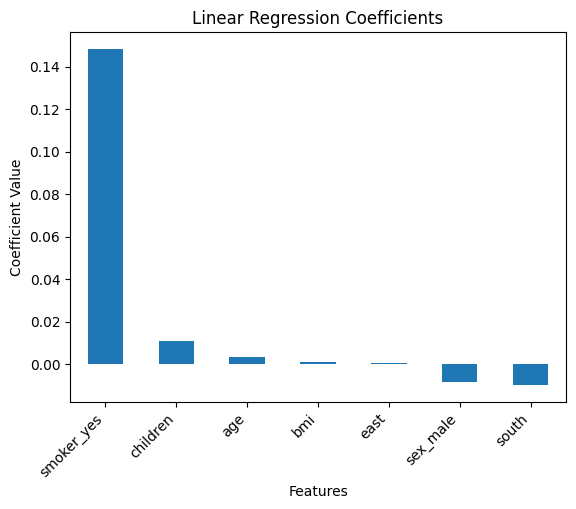

In [97]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11R.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

#### Lasso

In [98]:
# 데이터 준비
X = train.drop('charges', axis=1)
y = np.log1p(train['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Lasso()
param_grid = {
    'alpha': [0, 0.01, 0.1, 1, 2],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11L = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_11L = best_11L.predict(X_test)
intercept = best_11L.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_11L)
custom_loss = asymmetric_loss(y_test, y_pred_11L)
r2 = r2_score(y_test, y_pred_11L)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0, 'fit_intercept': True, 'max_iter': 2}
Mean Squared Error On Test: 0.0017
asymmetric loss On Test: 0.0027
R^2 Score On Test: 0.8180
Intercept (bias) of the model: 2.1021


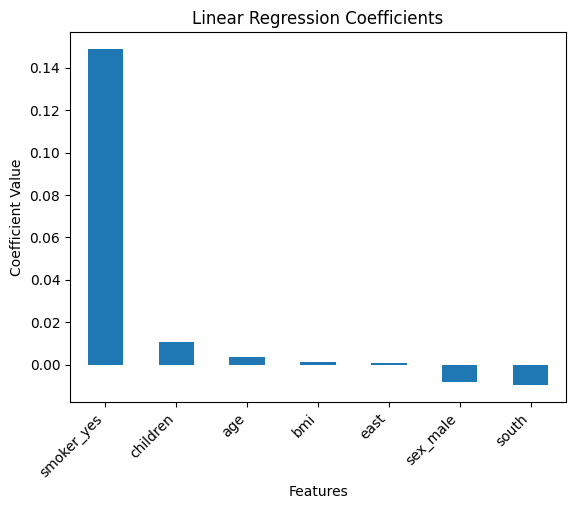

In [99]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11L.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

#### gradient descent

In [100]:
# 데이터 준비
X = train.drop('charges', axis=1)
y = np.log1p(train['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = KerasRegressor(model=gd_model, verbose=0)

# make_scorer를 사용하여 커스텀 스코어링 함수로 변환
scoring = make_scorer(asymmetric_loss_scorer, greater_is_better=False)  # 작을수록 좋으므로 False 설정

# 하이퍼파라미터 그리드 설정
param_grid = {
    'model__learning_rate': [0.01],  # 튜닝할 학습률
    'epochs': [580]  # 튜닝할 에포크 수
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring=scoring)

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_model_12 = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_12 = best_model_12.predict(X_test)

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_12)
custom_loss = asymmetric_loss(y_test, y_pred_12)
r2 = r2_score(y_test, y_pred_12)
weights, biases = best_model_12.model_.get_weights()

print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {biases[0]:.4f}")

Best hyperparameters: {'epochs': 580, 'model__learning_rate': 0.01}
Mean Squared Error On Test: 0.0031
asymmetric loss On Test: 0.0059
R^2 Score On Test: 0.6645
Intercept (bias) of the model: 2.1166


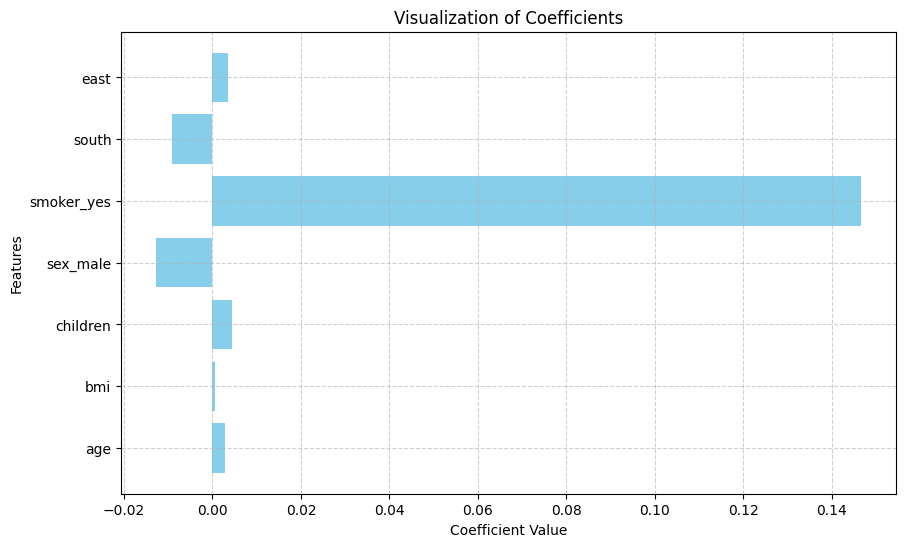

In [101]:
# 독립변수 이름 추출
feature_names = X.columns  # X는 DataFrame이어야 합니다.
weights, biases = best_model_12.model_.get_weights()
# 회귀 계수 시각화 (가중치만 사용)
plt.figure(figsize=(10, 6))
plt.barh(feature_names, weights.flatten(), color='skyblue')
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.title('Visualization of Coefficients')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

#### quantile regression

In [102]:
# # 데이터 준비
# X = train.drop('charges', axis=1)
# y = np.log1p(train['charges'])

# # 훈련 및 테스트 데이터 분할
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# models_13 = {}
# # 각 구간에 대한 퀀타일 회귀 모델 구축
# quantiles = np.arange(0.5,0.96,0.05)

# # Quantile 회귀 모델과 하이퍼파라미터 그리드 설정
# model = QuantileRegressor()
# param_grid = {
#     'alpha': [0, 0.01, 0.1],  # 정규화 강도 조절
#     'fit_intercept': [True, False], # 절편 포함 여부
#     'solver': ['highs', 'highs-ds', 'highs-ipm']
# }

# # make_scorer를 사용하여 커스텀 스코어링 함수로 변환


# for quantile in quantiles:
#     model = QuantileRegressor(quantile=quantile)
#     scoring = make_scorer(mean_pinball_loss, alpha = quantile, greater_is_better=False)
#     # GridSearchCV 설정 (교차 검증 5-폴드, scoring에 pinball loss 사용)
#     grid_search = GridSearchCV(model, param_grid, cv=5, scoring=scoring)

#     # 그리드 서치 실행 (훈련 데이터에 대해)
#     grid_search.fit(X_train, y_train)

#     # 최적의 하이퍼파라미터와 모델
#     best_params = grid_search.best_params_
#     best_model_13 = grid_search.best_estimator_
#     models_13[quantile] = best_model_13

#     print(f"Best hyperparameters: {best_params}")

#     # 최적 모델을 사용해 테스트 데이터에 대한 예측
#     y_pred_13 = best_model_13.predict(X_test)
#     intercept = best_model_13.intercept_

#     # 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
#     pinball_loss = mean_pinball_loss(y_test, y_pred_13, alpha=quantile)
#     r2 = r2_score(y_test, y_pred_13)

#     # 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
#     custom_loss = asymmetric_loss(y_test, y_pred_13)

#     print(f"asymmetric loss On Test: {custom_loss:.4f}")
#     print(f"Pinball Loss On Test: {pinball_loss:.4f}")
#     print(f"R^2 Score On Test: {r2:.4f}")
#     print(f"Intercept (bias) of the model: {intercept:.4f}\n")

# # 모델의 계수와 절편을 DataFrame으로 저장
# models_df_13 = pd.DataFrame({
#     'quantile': models_13.keys(),
#     'intercept': [model.intercept_ for model in models_13.values()],
#     'slope': [model.coef_[X.columns.get_loc('age')] for model in models_13.values()]
# })

In [103]:
# # 시각화
# x = np.linspace(X.age.min(), X.age.max(), 100)  # x 축 범위 설정
# get_y = lambda intercept, slope: intercept + slope * x

# fig, ax = plt.subplots(figsize=(8, 6))

# # 회귀 직선 그리기
# for i in range(models_df_13.shape[0]):
#     intercept = models_df_13.loc[i, 'intercept']
#     slope = models_df_13.loc[i, 'slope']
#     qline = get_y(intercept, slope)
#     ax.plot(x, qline, linestyle='dotted', label=f"Quantile {models_df_13.loc[i, 'quantile']}")

# # 실제 데이터 산점도 그리기
# ax.scatter(X.age, y, alpha=0.2, color='grey', label='Actual')

# legend = ax.legend()
# ax.set_xlabel('Age', fontsize=16)
# ax.set_ylabel('Charges', fontsize=16)
# plt.title('Quantile Regression Lines by Age')
# plt.grid(True)
# plt.show()

### case 2

|변수|내용|
|------|---|
|age|그대로 사용|
|sex|그대로 사용|
|region|south/east encoding|
|bmi|bmi category + target  encoding|
|smoker|그대로 사용|
|종속변수|charges|
|children|그대로 사용|

In [104]:
train_c2 = train.copy()
train_c2['bmi_category'] = train_c2['bmi'].apply(categorize_bmi)
train_c2['bmi_category'] = train_c2['bmi_category'].map(bmi_mapping)
train_c2.drop(['bmi'], axis=1, inplace=True)
train_c2.head()

,age,children,charges,sex_male,smoker_yes,south,east,bmi_category
0,19,0,9.734236,False,True,1,0,9.304650
1,18,1,7.453882,True,False,1,1,9.578657
2,28,3,8.400763,True,False,1,1,9.578657
3,33,0,9.998137,True,False,0,0,9.250522
4,32,0,8.260455,True,False,0,0,9.304650


#### Ridge

In [105]:
# 데이터 준비
X = train_c2.drop('charges', axis=1)
y = np.log1p(train_c2['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Ridge()
param_grid = {
    'alpha': [0.4, 0.5, 0.6],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_21R = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_R2 = best_21R.predict(X_test)
intercept = best_21R.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_R2)
custom_loss = asymmetric_loss(y_test, y_pred_R2)
r2 = r2_score(y_test, y_pred_R2)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0.5, 'fit_intercept': True, 'max_iter': 1}
Mean Squared Error On Test: 0.0017
asymmetric loss On Test: 0.0027
R^2 Score On Test: 0.8161
Intercept (bias) of the model: 1.7700


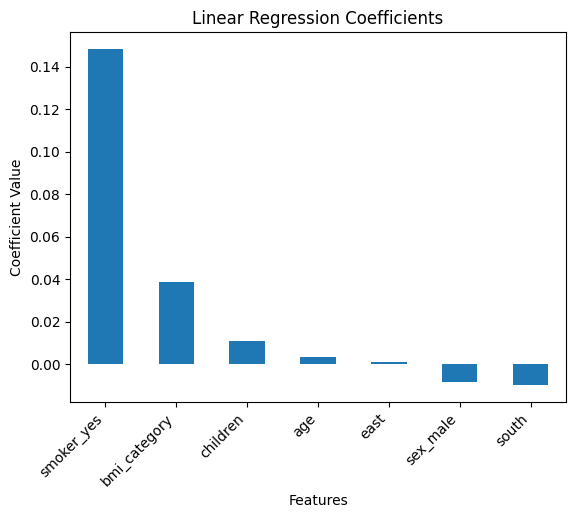

In [106]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_21R.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

#### Lasso

In [107]:
# 데이터 준비
X = train_c2.drop('charges', axis=1)
y = np.log1p(train_c2['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Lasso()
param_grid = {
    'alpha': [0, 0.01, 0.1, 1, 2],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_21L = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_21L = best_21L.predict(X_test)
intercept = best_21L.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_21L)
custom_loss = asymmetric_loss(y_test, y_pred_21L)
r2 = r2_score(y_test, y_pred_21L)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0, 'fit_intercept': True, 'max_iter': 2}
Mean Squared Error On Test: 0.0017
asymmetric loss On Test: 0.0027
R^2 Score On Test: 0.8162
Intercept (bias) of the model: 1.7663


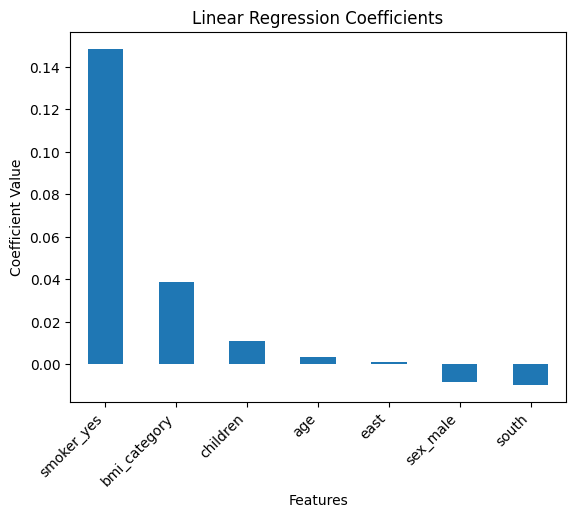

In [108]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_21L.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

#### gradient descent

In [109]:
# 데이터 준비
X = train_c2.drop('charges', axis=1)
y = np.log1p(train_c2['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = KerasRegressor(model=gd_model, verbose=0)

# make_scorer를 사용하여 커스텀 스코어링 함수로 변환
scoring = make_scorer(asymmetric_loss_scorer, greater_is_better=False)  # 작을수록 좋으므로 False 설정

# 하이퍼파라미터 그리드 설정
param_grid = {
    'model__learning_rate': [0.01],  # 튜닝할 학습률
    'epochs': [580]  # 튜닝할 에포크 수
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring=scoring)

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_model_22 = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_22 = best_model_22.predict(X_test)

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_22)
custom_loss = asymmetric_loss(y_test, y_pred_22)
r2 = r2_score(y_test, y_pred_22)
weights, biases = best_model_22.model_.get_weights()

print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {biases[0]:.4f}")

Best hyperparameters: {'epochs': 580, 'model__learning_rate': 0.01}
Mean Squared Error On Test: 0.0027
asymmetric loss On Test: 0.0032
R^2 Score On Test: 0.7048
Intercept (bias) of the model: 1.5517


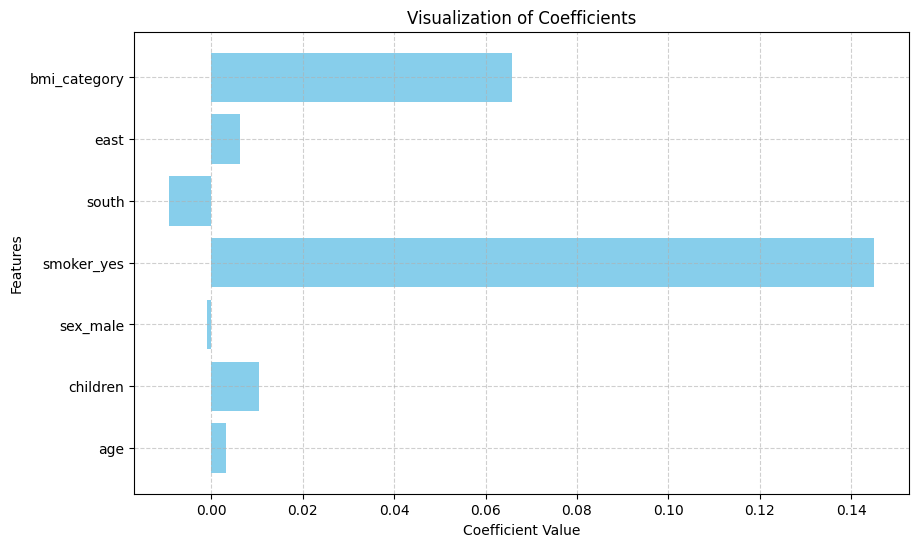

In [110]:
# 독립변수 이름 추출
feature_names = X.columns  # X는 DataFrame이어야 합니다.

# 회귀 계수 시각화 (가중치만 사용)
plt.figure(figsize=(10, 6))
plt.barh(feature_names, weights.flatten(), color='skyblue')
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.title('Visualization of Coefficients')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### case 3
|변수|내용|
|------|---|
|age|그대로 사용|
|sex|그대로 사용|
|region|south/east encoding|
|bmi|그대로 사용|
|smoker|그대로 사용|
|종속변수|cpp|
|children|total_people로 변환|

In [111]:
train_c3 = train.copy()
train_c3['total_people'] = train_c3['children'].apply(total_people)
# 가족구성원 1인당 청구비용을 확인해본다
train_c3['charge_per_person'] = train_c3['charges'] / train_c3['total_people']
train_c3.drop(['children', 'charges'], axis = 1, inplace=True)
train_c3.head()

,age,bmi,sex_male,smoker_yes,south,east,total_people,charge_per_person
0,19,27.900,False,True,1,0,1,9.734236
1,18,33.770,True,False,1,1,3,2.484627
2,28,33.000,True,False,1,1,5,1.680153
3,33,22.705,True,False,0,0,1,9.998137
4,32,28.880,True,False,0,0,1,8.260455


In [112]:
ProfileReport(train_c3, title="Profiling Report :: medical cost personal dataset")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Ridge

In [113]:
X = train_c3.drop('charge_per_person', axis=1)
y = np.log1p(train_c3['charge_per_person'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Ridge()
param_grid = {
    'alpha': [0.4, 0.5, 0.6],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_31R = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_R3 = best_31R.predict(X_test)
intercept = best_31R.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_R3)
custom_loss = asymmetric_loss(y_test, y_pred_R3)
r2 = r2_score(y_test, y_pred_R3)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0.6, 'fit_intercept': True, 'max_iter': 1}
Mean Squared Error On Test: 0.0210
asymmetric loss On Test: 0.0333
R^2 Score On Test: 0.9312
Intercept (bias) of the model: 2.3989


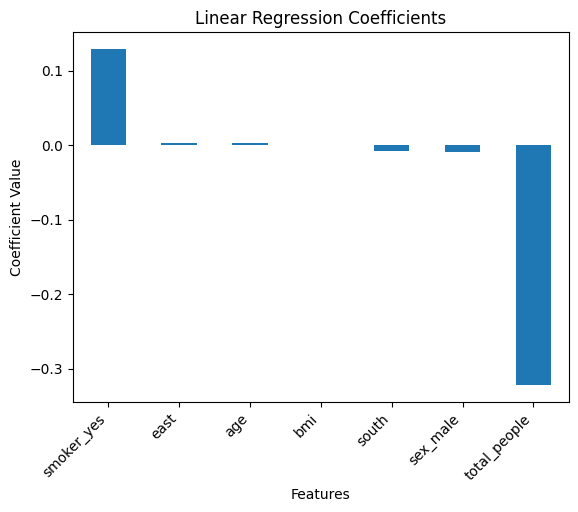

In [114]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_31R.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

#### Lasso

In [115]:
X = train_c3.drop('charge_per_person', axis=1)
y = np.log1p(train_c3['charge_per_person'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Lasso()
param_grid = {
    'alpha': [0, 0.01, 0.1, 1, 2],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_31L = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_31L = best_31L.predict(X_test)
intercept = best_31L.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_31L)
custom_loss = asymmetric_loss(y_test, y_pred_31L)
r2 = r2_score(y_test, y_pred_31L)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0, 'fit_intercept': True, 'max_iter': 3}
Mean Squared Error On Test: 0.0210
asymmetric loss On Test: 0.0333
R^2 Score On Test: 0.9312
Intercept (bias) of the model: 2.3994


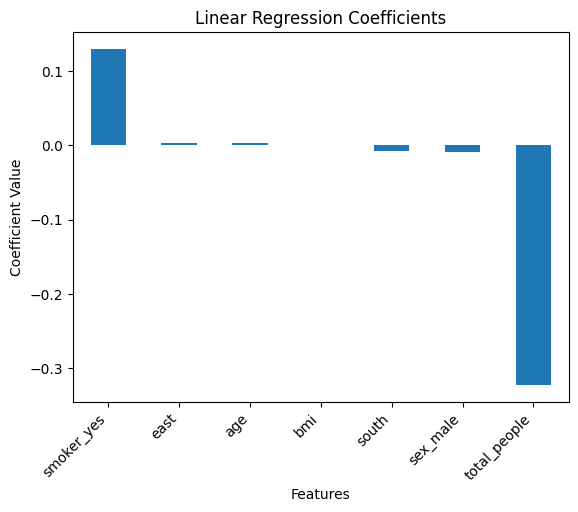

In [116]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_31L.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

#### gradient descent

In [117]:
X = train_c3.drop('charge_per_person', axis=1)
y = np.log1p(train_c3['charge_per_person'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = KerasRegressor(model=gd_model, verbose=0)

# make_scorer를 사용하여 커스텀 스코어링 함수로 변환
scoring = make_scorer(asymmetric_loss_scorer, greater_is_better=False)  # 작을수록 좋으므로 False 설정

# 하이퍼파라미터 그리드 설정
param_grid = {
    'model__learning_rate': [0.01],  # 튜닝할 학습률
    'epochs': [600]  # 튜닝할 에포크 수
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring=scoring)

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_model_32 = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_32 = best_model_32.predict(X_test)

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_32)
custom_loss = asymmetric_loss(y_test, y_pred_32)
r2 = r2_score(y_test, y_pred_32)
weights, biases = best_model_32.model_.get_weights()

print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {biases[0]:.4f}")

Best hyperparameters: {'epochs': 600, 'model__learning_rate': 0.01}
Mean Squared Error On Test: 0.0212
asymmetric loss On Test: 0.0333
R^2 Score On Test: 0.9306
Intercept (bias) of the model: 2.4100


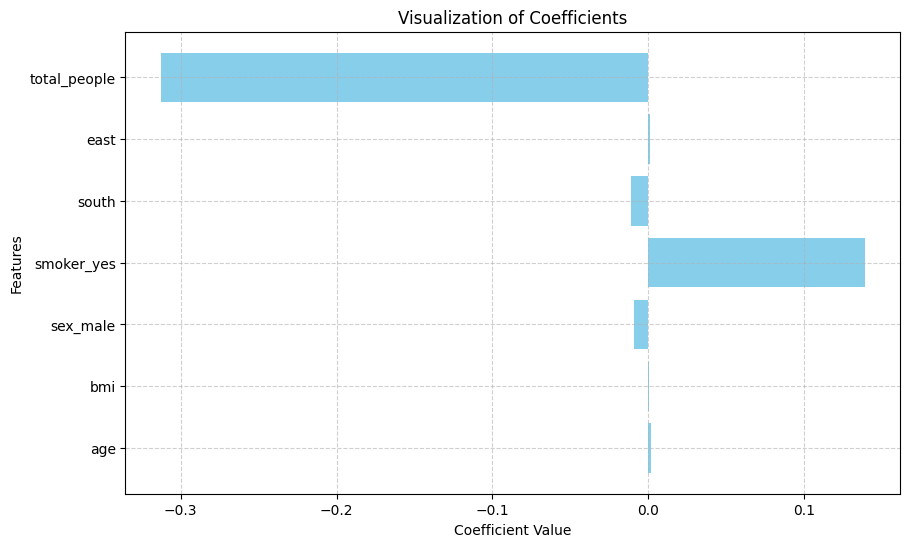

In [118]:
# 독립변수 이름 추출
feature_names = X.columns  # X는 DataFrame이어야 합니다.

# 회귀 계수 시각화 (가중치만 사용)
plt.figure(figsize=(10, 6))
plt.barh(feature_names, weights.flatten(), color='skyblue')
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.title('Visualization of Coefficients')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### case 4

|변수|내용|
|------|---|
|age|그대로 사용|
|sex|그대로 사용|
|region|south/east encoding|
|bmi|bmi category + target  encoding|
|smoker|그대로 사용|
|종속변수|cpp|
|children|total_people로 변환|

In [119]:
train_c4 = train_c3.copy()
train_c4['bmi_category'] = train_c4['bmi'].apply(categorize_bmi)
train_c4['bmi_category'] = train_c4['bmi_category'].map(bmi_mapping)
train_c4.drop(['bmi'], axis=1, inplace=True)
train_c4.head()

,age,sex_male,smoker_yes,south,east,total_people,charge_per_person,bmi_category
0,19,False,True,1,0,1,9.734236,9.304650
1,18,True,False,1,1,3,2.484627,9.578657
2,28,True,False,1,1,5,1.680153,9.578657
3,33,True,False,0,0,1,9.998137,9.250522
4,32,True,False,0,0,1,8.260455,9.304650


#### Ridge

In [120]:
X = train_c4.drop('charge_per_person', axis=1)
y = np.log1p(train_c4['charge_per_person'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Ridge()
param_grid = {
    'alpha': [0.1, 0.4, 0.5, 0.6],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_41R = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_R4 = best_41R.predict(X_test)
intercept = best_41R.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_R4)
custom_loss = asymmetric_loss(y_test, y_pred_R4)
r2 = r2_score(y_test, y_pred_R4)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0.6, 'fit_intercept': True, 'max_iter': 1}
Mean Squared Error On Test: 0.0209
asymmetric loss On Test: 0.0332
R^2 Score On Test: 0.9313
Intercept (bias) of the model: 2.3182


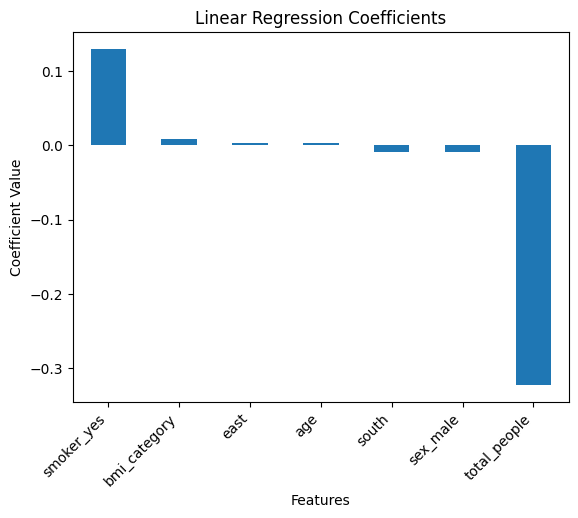

In [121]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_41R.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

#### Lasso

In [122]:
X = train_c4.drop('charge_per_person', axis=1)
y = np.log1p(train_c4['charge_per_person'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Lasso()
param_grid = {
    'alpha': [0, 0.01, 0.1, 1, 2],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_41L = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_41L = best_41L.predict(X_test)
intercept = best_41L.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_41L)
custom_loss = asymmetric_loss(y_test, y_pred_41L)
r2 = r2_score(y_test, y_pred_41L)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0, 'fit_intercept': True, 'max_iter': 3}
Mean Squared Error On Test: 0.0210
asymmetric loss On Test: 0.0333
R^2 Score On Test: 0.9313
Intercept (bias) of the model: 2.3167


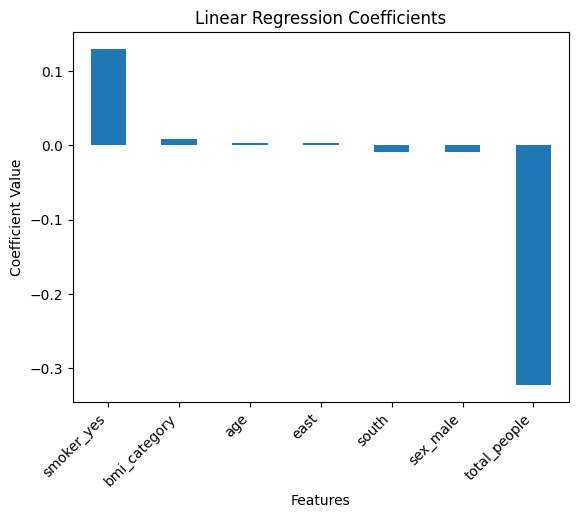

In [123]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_41L.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

#### gradient descent

In [124]:
X = train_c4.drop('charge_per_person', axis=1)
y = np.log1p(train_c4['charge_per_person'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = KerasRegressor(model=gd_model, verbose=0)

# make_scorer를 사용하여 커스텀 스코어링 함수로 변환
scoring = make_scorer(asymmetric_loss_scorer, greater_is_better=False)  # 작을수록 좋으므로 False 설정

# 하이퍼파라미터 그리드 설정
param_grid = {
    'model__learning_rate': [0.01],  # 튜닝할 학습률
    'epochs': [600]  # 튜닝할 에포크 수
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring=scoring)

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_model_42 = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_42 = best_model_42.predict(X_test)

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_42)
custom_loss = asymmetric_loss(y_test, y_pred_42)
r2 = r2_score(y_test, y_pred_42)
weights, biases = best_model_42.model_.get_weights()

print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {biases[0]:.4f}")

Best hyperparameters: {'epochs': 600, 'model__learning_rate': 0.01}
Mean Squared Error On Test: 0.0210
asymmetric loss On Test: 0.0306
R^2 Score On Test: 0.9311
Intercept (bias) of the model: 1.2425


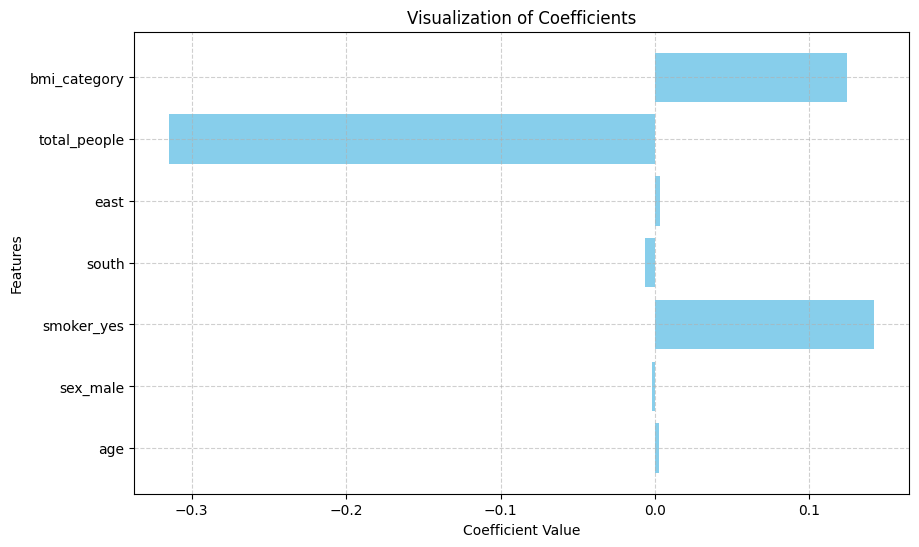

In [125]:
# 독립변수 이름 추출
feature_names = X.columns  # X는 DataFrame이어야 합니다.

# 회귀 계수 시각화 (가중치만 사용)
plt.figure(figsize=(10, 6))
plt.barh(feature_names, weights.flatten(), color='skyblue')
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.title('Visualization of Coefficients')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

### Case 별 특징 분석

- ridge & lasso (OLS)
  - bmi -> bmi category : 설명계수 (-0.001), mse (+0.002), bias (-4)
  - charges -> cpp : 설명계수 (+0.03), mse (+0.01). bias (+0.4)
- gradient descent
  - bmi -> bmi category : 설명계수 (-0.004), custom loss (+0.001), bias (-6)
  - charges -> cpp : 설명계수 (-0.04), custom loss (+0.01). bias (+0.2)

- ridge vs lasso
  - ridge에 경우 정규화(alpha : 0.5~0.6)가 어느정도 진행 되었을 때 best model이 선정되었지만, lasso의 경우는 정규화가 진행되지 않은 경우(alpha : 0)가 최고 성능 모델로 선정되었음

- OLS vs gradient descent
  - 전체적으로 OLS를 사용한 경우가 gradient descent를 사용한 경우보다 MSE, R^2, custom loss의 모든 지표에서 우세함

### 그룹별 회귀직선 3종류 빌딩

In [126]:
train.head()

,age,bmi,children,charges,sex_male,smoker_yes,south,east
0,19,27.900,0,9.734236,False,True,1,0
1,18,33.770,1,7.453882,True,False,1,1
2,28,33.000,3,8.400763,True,False,1,1
3,33,22.705,0,9.998137,True,False,0,0
4,32,28.880,0,8.260455,True,False,0,0


In [127]:
# Decision Tree 기준에 따른 클러스터 설정 함수
def assign_cluster(row):
    if row['smoker_yes'] == True and row['bmi'] > 30.01:
        return 0  # Cluster 0: 흡연자 & BMI > 30.01
    elif row['smoker_yes'] == False:
        return 1  # Cluster 1: 비흡연자
    else:
        return 2  # Cluster 2: 흡연자 & BMI <= 30.01

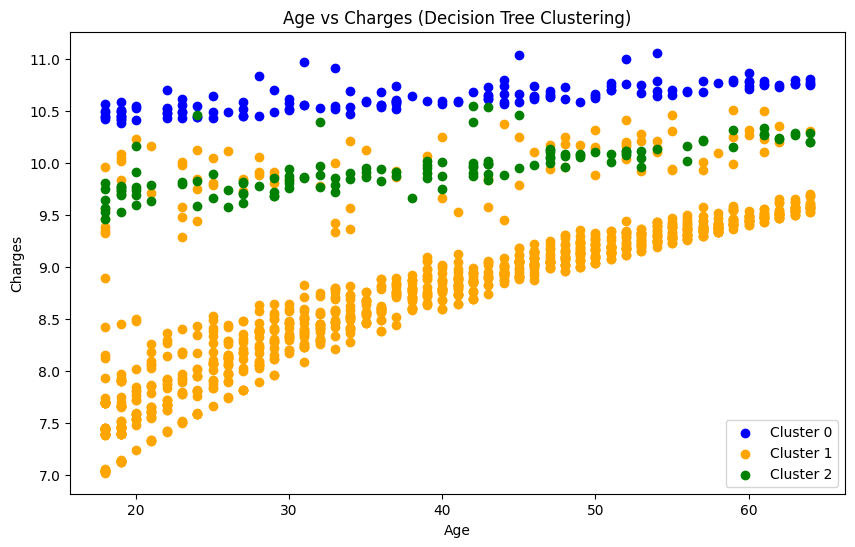

In [128]:
train_c5 = train.copy()
# 클러스터 할당
train_c5['cluster'] = train_c5.apply(assign_cluster, axis=1)

# 색상 설정
colors = {0: 'blue', 1: 'orange', 2: 'green'}

# 산점도 그리기
plt.figure(figsize=(10, 6))
for cluster, group_data in train_c5.groupby('cluster'):
    plt.scatter(group_data['age'], group_data['charges'],
                label=f'Cluster {cluster}',
                color=colors[cluster])

plt.title('Age vs Charges (Decision Tree Clustering)')
plt.xlabel('Age')
plt.ylabel('Charges')
plt.legend()
plt.show()

In [129]:
# bmi_category별 charges의 통계값 계산
cluster_charges_stats = train_c5.groupby('cluster')['charges'].describe()

# 결과 확인
cluster_charges_stats

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,144.0,10.629011,0.133514,10.390512,10.525270,10.619357,10.729964,11.063061
1,1063.0,8.789740,0.743218,7.023647,8.291517,8.902010,9.338207,10.516281
2,130.0,9.944295,0.222975,9.459577,9.780497,9.913540,10.088844,10.551810


### 클러스터 0에 대한 회귀직선

#### RIDGE

In [130]:
X_0 = train_c5[train_c5['cluster'] == 0]
# StandardScaler 객체 생성

X_0.head()

,age,bmi,children,charges,sex_male,smoker_yes,south,east,cluster
14,27,42.13,0,10.586907,True,True,1,1,0
19,30,35.30,0,10.514298,True,True,1,0,0
23,34,31.92,1,10.537492,False,True,0,1,0
29,31,36.30,2,10.563905,True,True,1,0,0
30,22,35.60,0,10.479724,True,True,1,0,0


In [131]:
# 데이터 준비
X = X_0.drop(['charges', 'cluster', 'smoker_yes'], axis=1)
y = np.log1p(X_0['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Ridge()
param_grid = {
    'alpha': [130, 150, 170],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11R = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_R1 = best_11R.predict(X_test)
intercept = best_11R.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_R1)
custom_loss = asymmetric_loss(y_test, y_pred_R1)
r2 = r2_score(y_test, y_pred_R1)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 150, 'fit_intercept': True, 'max_iter': 1}
Mean Squared Error On Test: 0.0000
asymmetric loss On Test: 0.0000
R^2 Score On Test: 0.8588
Intercept (bias) of the model: 2.4014


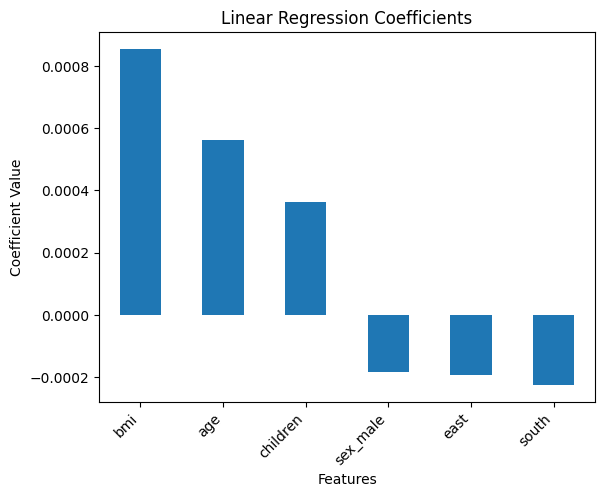

In [132]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11R.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

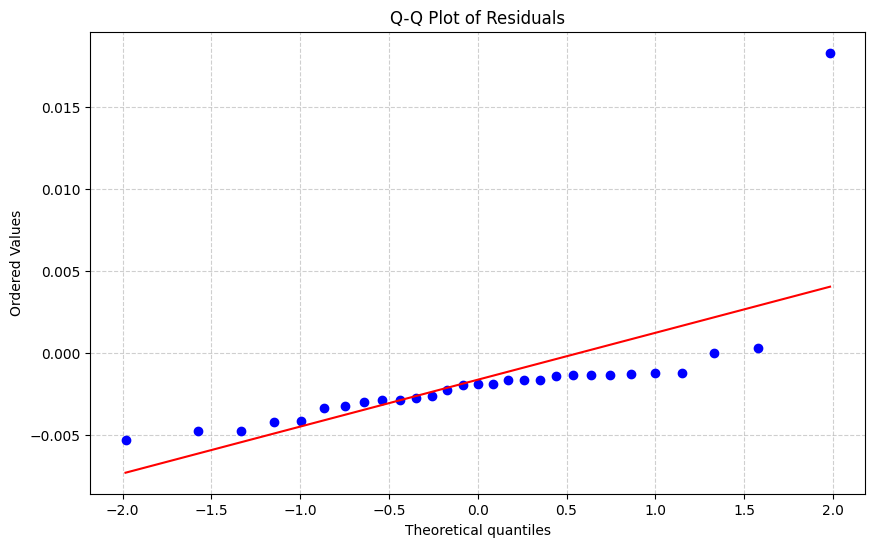

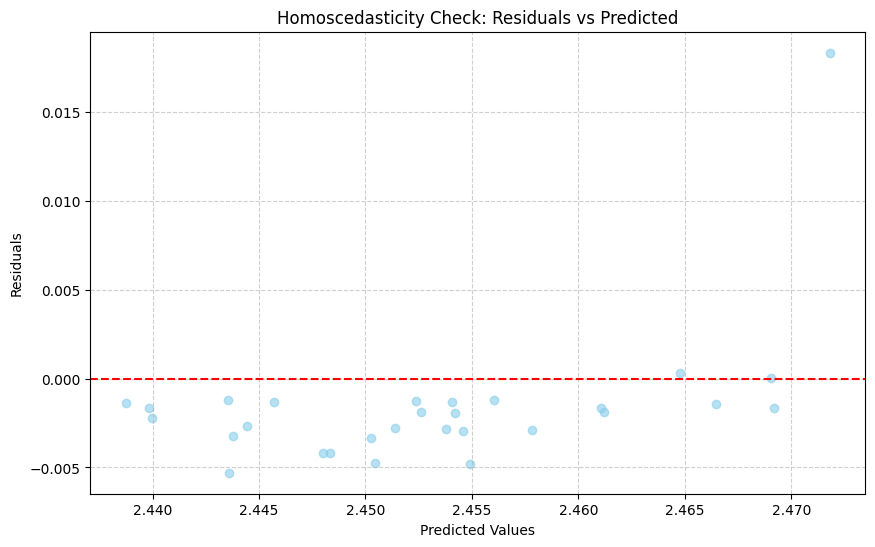

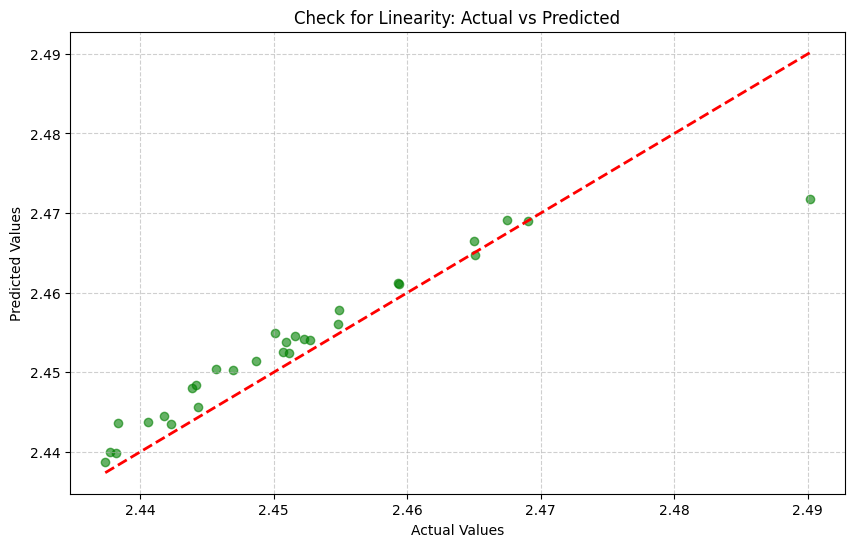

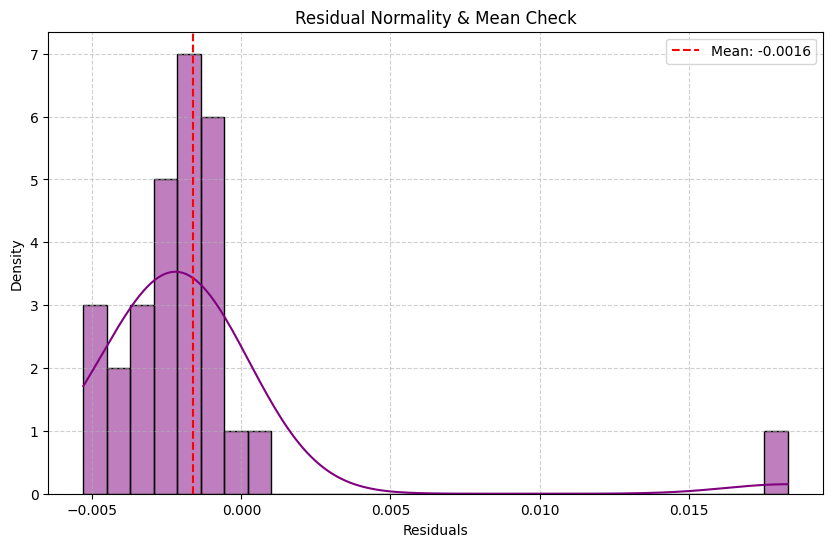

Mean of Residuals: -0.0016
Standard Deviation of Residuals: 0.0040


In [133]:
# 잔차(residuals) 계산
residuals = y_test - y_pred_R1

# Q-Q Plot
plt.figure(figsize=(10, 6))
sp.stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Homoscedasticity Check (잔차 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_R1, residuals, alpha=0.6, color='skyblue')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Homoscedasticity Check: Residuals vs Predicted')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Linearity (실제 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_R1, alpha=0.6, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r', linewidth=2)
plt.title('Check for Linearity: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Residual Normality & Mean
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color='purple', bins=30)
plt.axvline(x=np.mean(residuals), color='r', linestyle='--', label=f'Mean: {np.mean(residuals):.4f}')
plt.title('Residual Normality & Mean Check')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 추가적인 통계 정보
print(f"Mean of Residuals: {np.mean(residuals):.4f}")
print(f"Standard Deviation of Residuals: {np.std(residuals):.4f}")

In [134]:
# Shapiro-Wilk 검정 수행
stat, p_value = shapiro(residuals)

# 결과 출력
print(f"Shapiro-Wilk Test Statistic: {stat:.4f}")
print(f"P-value : {p_value:.4f}")
if p_value > 0.05:
    print("The distribution of residual is likely normal (fail to reject H0).\n")
else:
    print("The distribution of residual is not normal (reject H0).\n")

Shapiro-Wilk Test Statistic: 0.4902
P-value : 0.0000
The distribution of residual is not normal (reject H0).



#### LASSO

In [135]:
# 데이터 준비
X = X_0.drop(['charges', 'cluster', 'smoker_yes'], axis=1)
y = np.log1p(X_0['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Lasso()
param_grid = {
    'alpha': [0, 0.01, 0.1, 1, 2],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11L = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_11L = best_11L.predict(X_test)
intercept = best_11L.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_11L)
custom_loss = asymmetric_loss(y_test, y_pred_11L)
r2 = r2_score(y_test, y_pred_11L)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0, 'fit_intercept': True, 'max_iter': 2}
Mean Squared Error On Test: 0.0000
asymmetric loss On Test: 0.0000
R^2 Score On Test: 0.8849
Intercept (bias) of the model: 2.3990


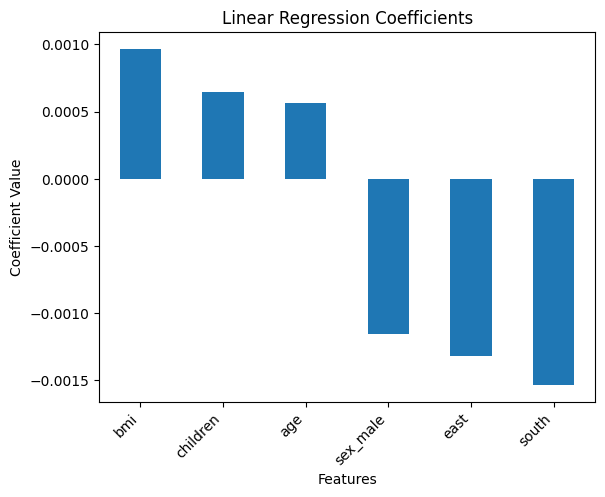

In [136]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11L.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

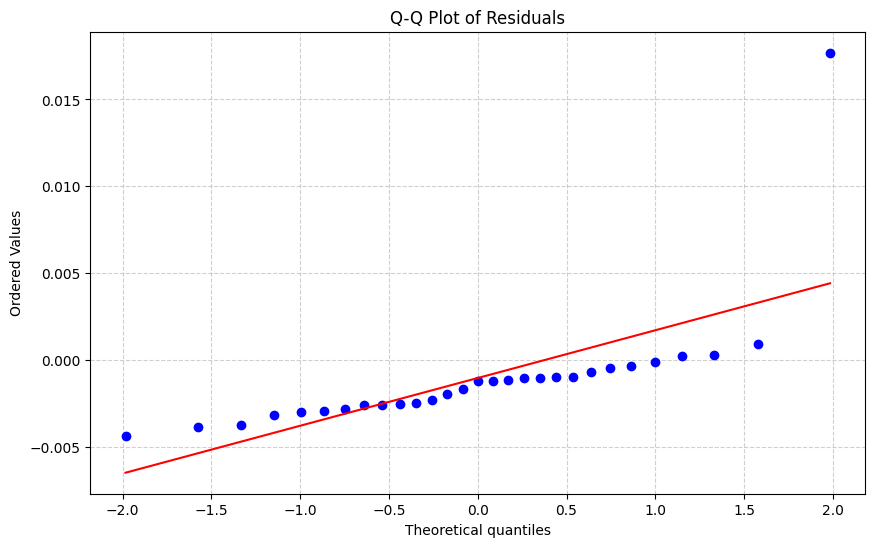

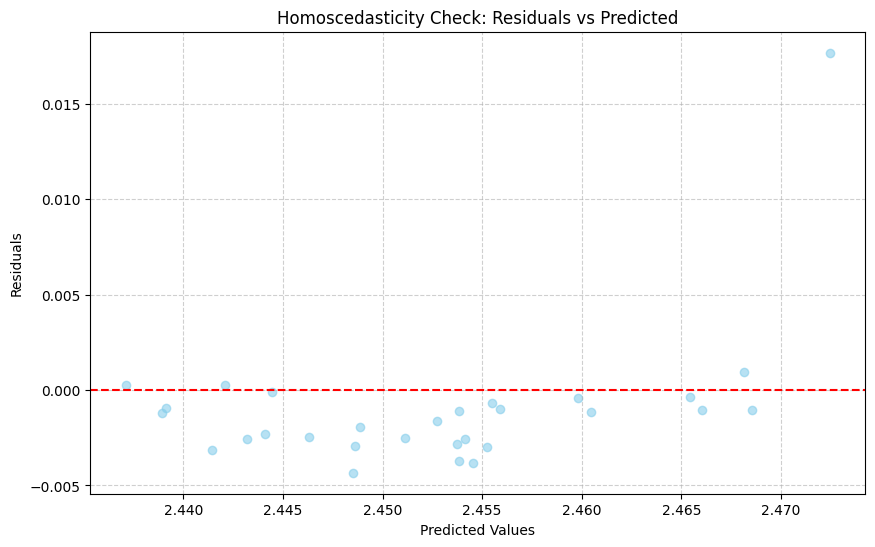

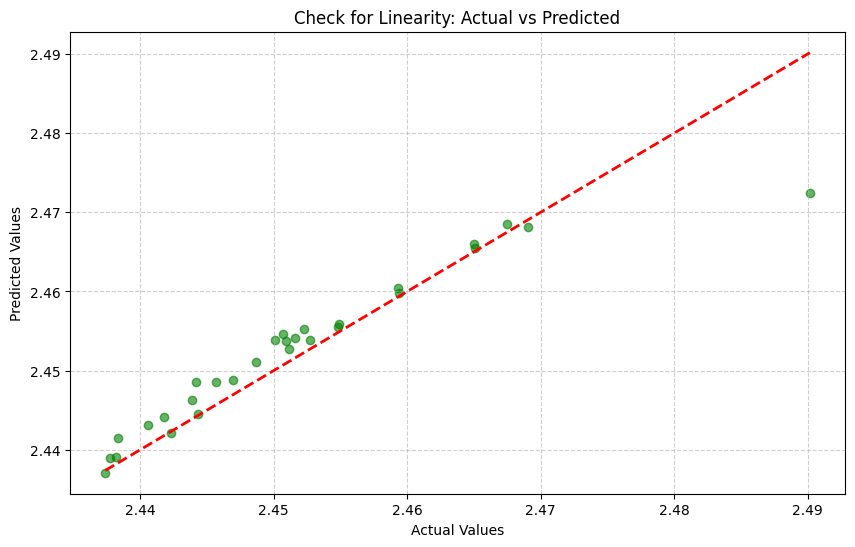

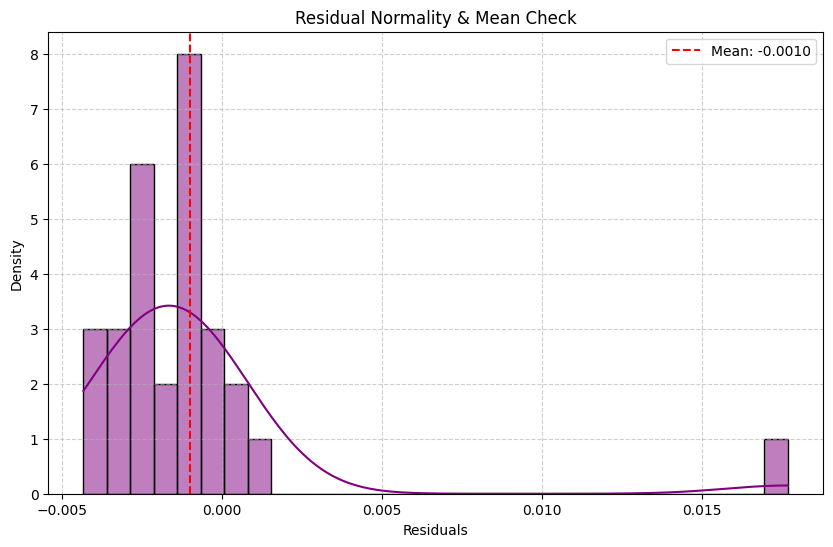

Mean of Residuals: -0.0010
Standard Deviation of Residuals: 0.0038


In [137]:
# 잔차(residuals) 계산
residuals = y_test - y_pred_11L

# Q-Q Plot
plt.figure(figsize=(10, 6))
sp.stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Homoscedasticity Check (잔차 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_11L, residuals, alpha=0.6, color='skyblue')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Homoscedasticity Check: Residuals vs Predicted')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Linearity (실제 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_11L, alpha=0.6, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r', linewidth=2)
plt.title('Check for Linearity: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Residual Normality & Mean
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color='purple', bins=30)
plt.axvline(x=np.mean(residuals), color='r', linestyle='--', label=f'Mean: {np.mean(residuals):.4f}')
plt.title('Residual Normality & Mean Check')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 추가적인 통계 정보
print(f"Mean of Residuals: {np.mean(residuals):.4f}")
print(f"Standard Deviation of Residuals: {np.std(residuals):.4f}")

In [138]:
# Shapiro-Wilk 검정 수행
stat, p_value = shapiro(residuals)

# 결과 출력
print(f"Shapiro-Wilk Test Statistic: {stat:.4f}")
print(f"P-value : {p_value:.4f}")
if p_value > 0.05:
    print("The distribution of residual is likely normal (fail to reject H0).\n")
else:
    print("The distribution of residual is not normal (reject H0).\n")

Shapiro-Wilk Test Statistic: 0.5069
P-value : 0.0000
The distribution of residual is not normal (reject H0).



### 클러스터 1에 대한 회귀직선

#### RIDGE

In [139]:
X_1 = train_c5[train_c5['cluster'] == 1]

X_1.head()

,age,bmi,children,charges,sex_male,smoker_yes,south,east,cluster
1,18,33.770,1,7.453882,True,False,1,1,1
2,28,33.000,3,8.400763,True,False,1,1,1
3,33,22.705,0,9.998137,True,False,0,0,1
4,32,28.880,0,8.260455,True,False,0,0,1
5,31,25.740,0,8.231541,False,False,1,1,1


In [140]:
# 데이터 준비
X = X_1.drop(['charges', 'cluster', 'smoker_yes'], axis=1)
y = np.log1p(X_1['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Ridge()
param_grid = {
    'alpha': [9.5, 9.7, 9.9, 10.1],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11R = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_R1 = best_11R.predict(X_test)
intercept = best_11R.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_R1)
custom_loss = asymmetric_loss(y_test, y_pred_R1)
r2 = r2_score(y_test, y_pred_R1)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 9.5, 'fit_intercept': True, 'max_iter': 1}
Mean Squared Error On Test: 0.0020
asymmetric loss On Test: 0.0036
R^2 Score On Test: 0.6702
Intercept (bias) of the model: 2.0983


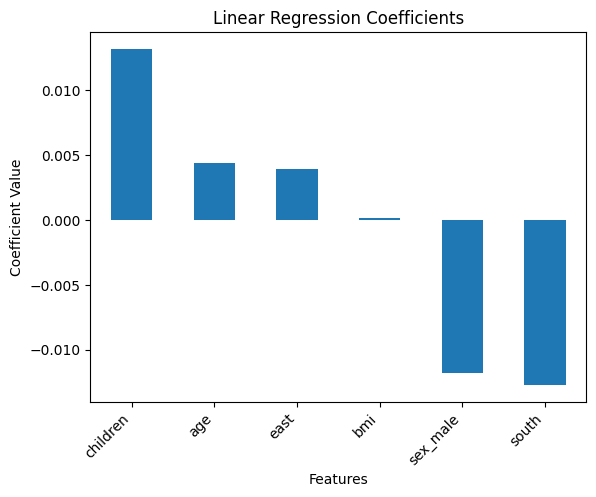

In [141]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11R.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

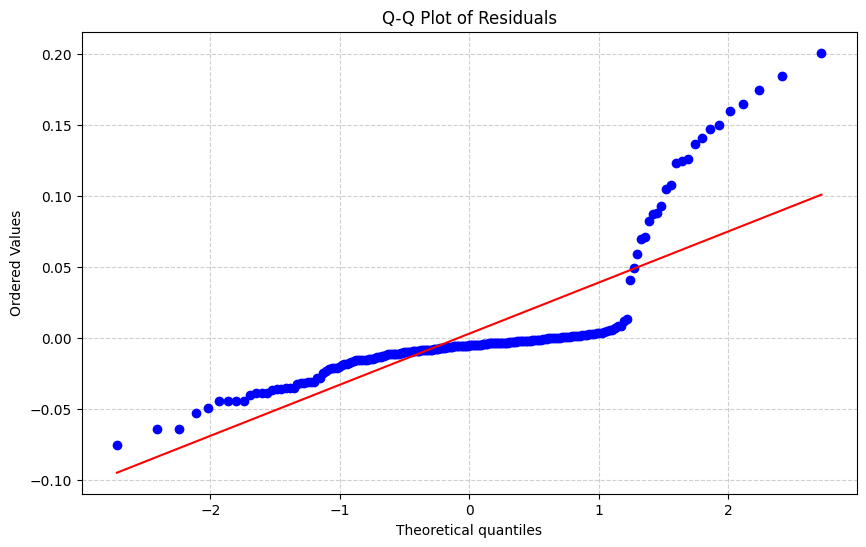

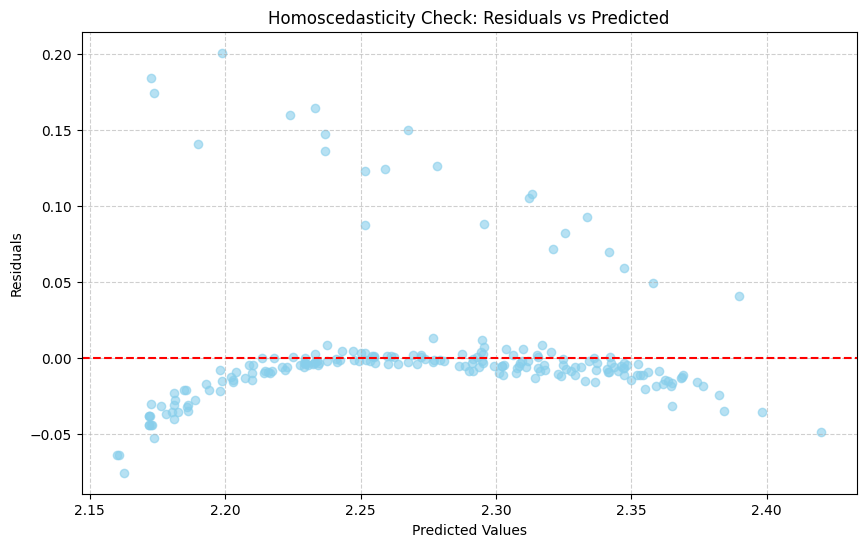

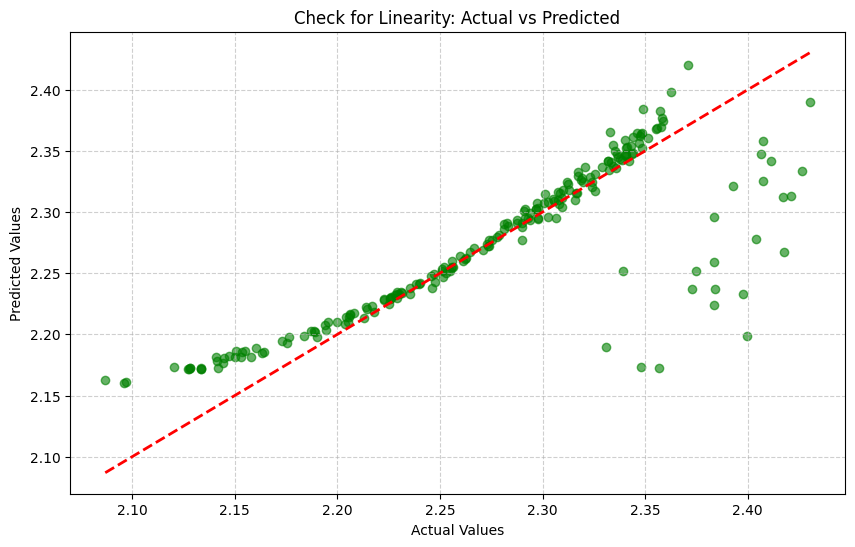

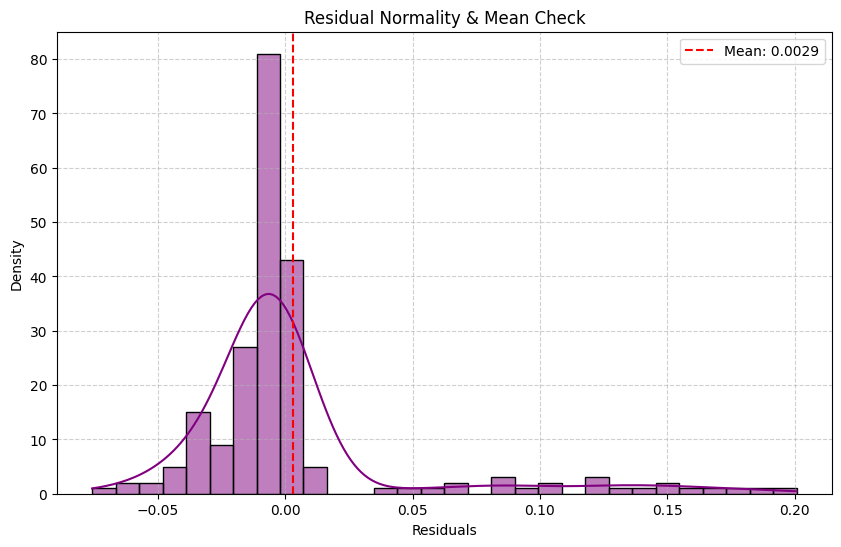

Mean of Residuals: 0.0029
Standard Deviation of Residuals: 0.0443


In [142]:
# 잔차(residuals) 계산
residuals = y_test - y_pred_R1

# Q-Q Plot
plt.figure(figsize=(10, 6))
sp.stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Homoscedasticity Check (잔차 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_R1, residuals, alpha=0.6, color='skyblue')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Homoscedasticity Check: Residuals vs Predicted')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Linearity (실제 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_R1, alpha=0.6, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r', linewidth=2)
plt.title('Check for Linearity: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Residual Normality & Mean
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color='purple', bins=30)
plt.axvline(x=np.mean(residuals), color='r', linestyle='--', label=f'Mean: {np.mean(residuals):.4f}')
plt.title('Residual Normality & Mean Check')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 추가적인 통계 정보
print(f"Mean of Residuals: {np.mean(residuals):.4f}")
print(f"Standard Deviation of Residuals: {np.std(residuals):.4f}")

In [143]:
# Shapiro-Wilk 검정 수행
stat, p_value = shapiro(residuals)

# 결과 출력
print(f"Shapiro-Wilk Test Statistic: {stat:.4f}")
print(f"P-value : {p_value:.4f}")
if p_value > 0.05:
    print("The distribution of residual is likely normal (fail to reject H0).\n")
else:
    print("The distribution of residual is not normal (reject H0).\n")

Shapiro-Wilk Test Statistic: 0.6510
P-value : 0.0000
The distribution of residual is not normal (reject H0).



#### LASOO

In [144]:
# 데이터 준비
X = X_1.drop(['charges', 'cluster', 'smoker_yes'], axis=1)
y = np.log1p(X_1['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Lasso()
param_grid = {
    'alpha': [0, 0.01, 0.1, 1, 2],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [12, 13, 14]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11L = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_11L = best_11L.predict(X_test)
intercept = best_11L.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_11L)
custom_loss = asymmetric_loss(y_test, y_pred_11L)
r2 = r2_score(y_test, y_pred_11L)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0, 'fit_intercept': True, 'max_iter': 13}
Mean Squared Error On Test: 0.0020
asymmetric loss On Test: 0.0036
R^2 Score On Test: 0.6705
Intercept (bias) of the model: 2.0984


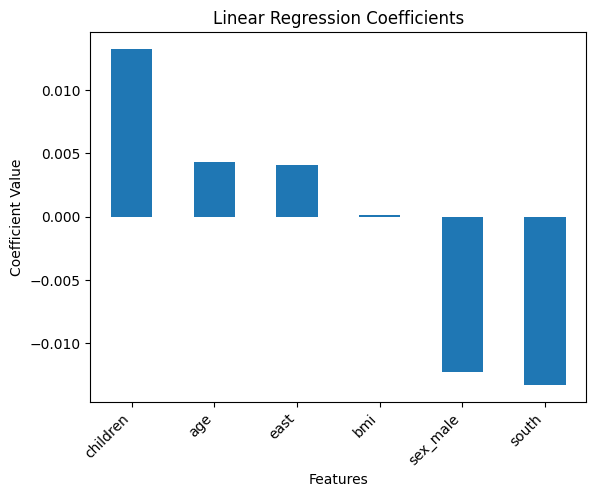

In [145]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11L.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

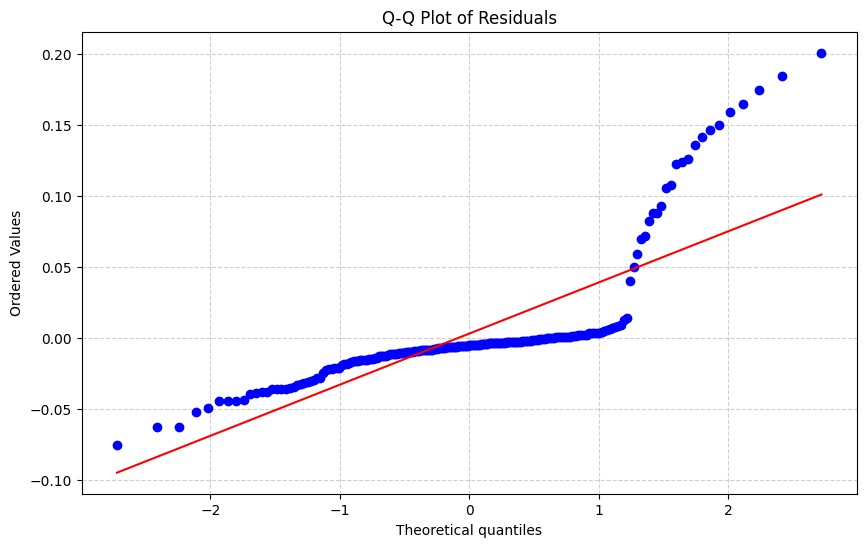

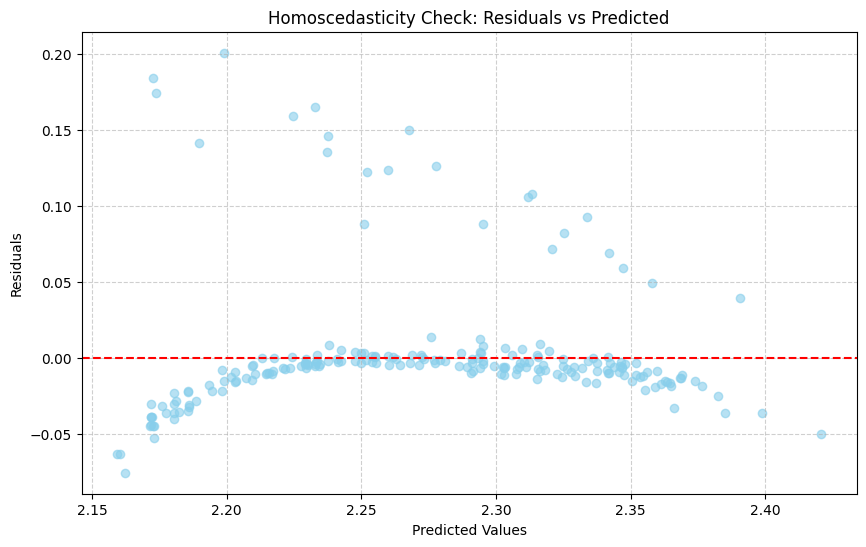

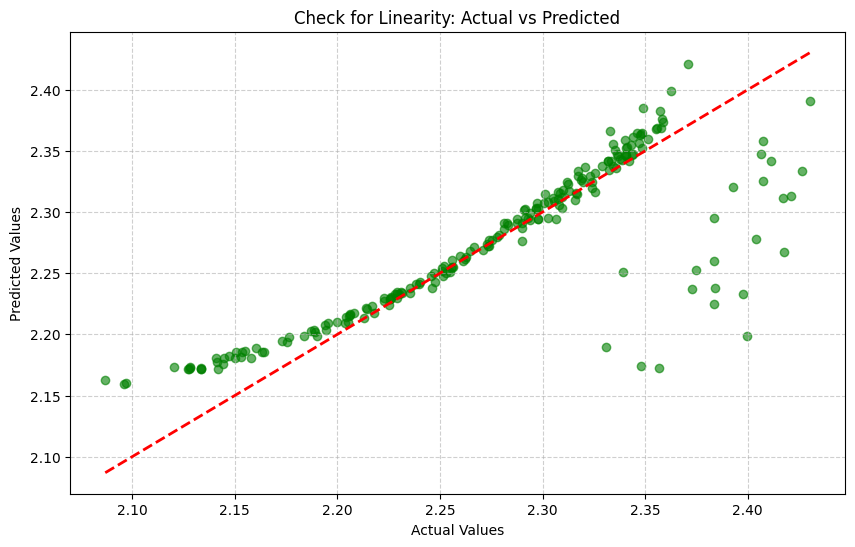

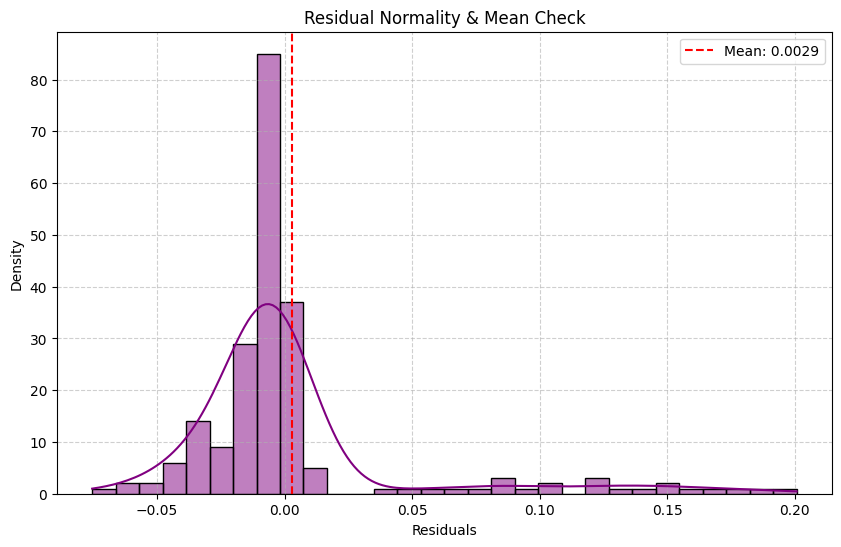

Mean of Residuals: 0.0029
Standard Deviation of Residuals: 0.0442


In [146]:
# 잔차(residuals) 계산
residuals = y_test - y_pred_11L

# Q-Q Plot
plt.figure(figsize=(10, 6))
sp.stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Homoscedasticity Check (잔차 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_11L, residuals, alpha=0.6, color='skyblue')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Homoscedasticity Check: Residuals vs Predicted')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Linearity (실제 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_11L, alpha=0.6, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r', linewidth=2)
plt.title('Check for Linearity: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Residual Normality & Mean
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color='purple', bins=30)
plt.axvline(x=np.mean(residuals), color='r', linestyle='--', label=f'Mean: {np.mean(residuals):.4f}')
plt.title('Residual Normality & Mean Check')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 추가적인 통계 정보
print(f"Mean of Residuals: {np.mean(residuals):.4f}")
print(f"Standard Deviation of Residuals: {np.std(residuals):.4f}")

In [147]:
# Shapiro-Wilk 검정 수행
stat, p_value = shapiro(residuals)

# 결과 출력
print(f"Shapiro-Wilk Test Statistic: {stat:.4f}")
print(f"P-value : {p_value:.4f}")
if p_value > 0.05:
    print("The distribution of residual is likely normal (fail to reject H0).\n")
else:
    print("The distribution of residual is not normal (reject H0).\n")

Shapiro-Wilk Test Statistic: 0.6525
P-value : 0.0000
The distribution of residual is not normal (reject H0).



### 클러스터 2에 대한 회귀직선

#### RIDGE

In [148]:
X_2 = train_c5[train_c5['cluster'] == 2]

X_2.head()

,age,bmi,children,charges,sex_male,smoker_yes,south,east,cluster
0,19,27.90,0,9.734236,False,True,1,0,2
11,62,26.29,0,10.233141,False,True,1,1,2
52,48,28.00,1,10.067699,True,True,1,0,2
58,53,22.88,1,10.053879,False,True,1,1,2
64,20,22.42,0,9.596469,False,True,0,0,2


In [149]:
# 데이터 준비
X = X_2.drop(['charges', 'cluster', 'smoker_yes'], axis=1)
y = np.log1p(X_2['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Ridge()
param_grid = {
    'alpha': [173, 174, 175],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11R = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_R1 = best_11R.predict(X_test)
intercept = best_11R.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_R1)
custom_loss = asymmetric_loss(y_test, y_pred_R1)
r2 = r2_score(y_test, y_pred_R1)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 173, 'fit_intercept': True, 'max_iter': 1}
Mean Squared Error On Test: 0.0001
asymmetric loss On Test: 0.0001
R^2 Score On Test: 0.8605
Intercept (bias) of the model: 2.3138


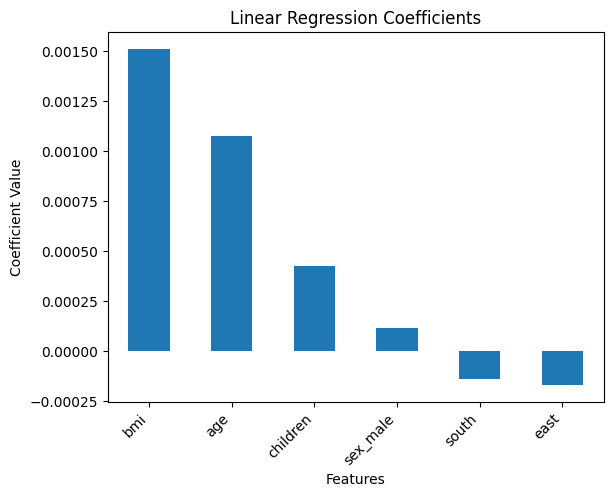

In [150]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11R.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

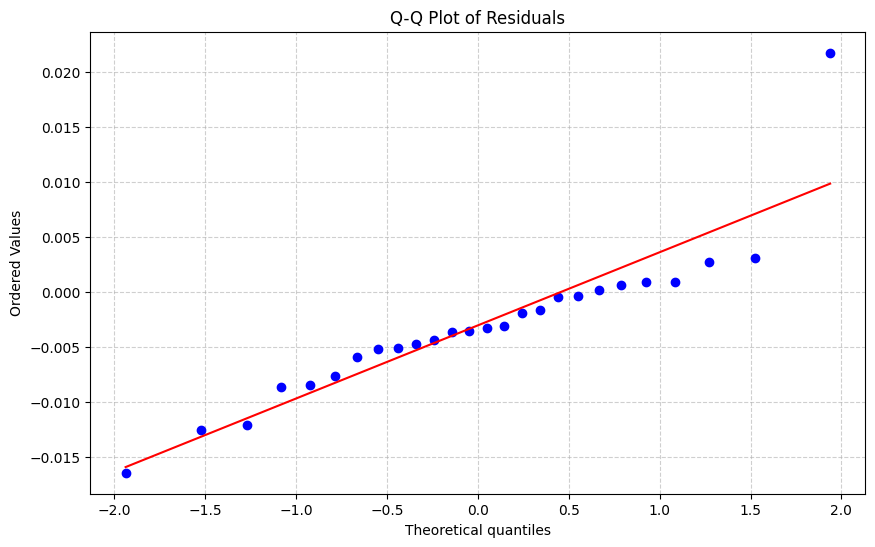

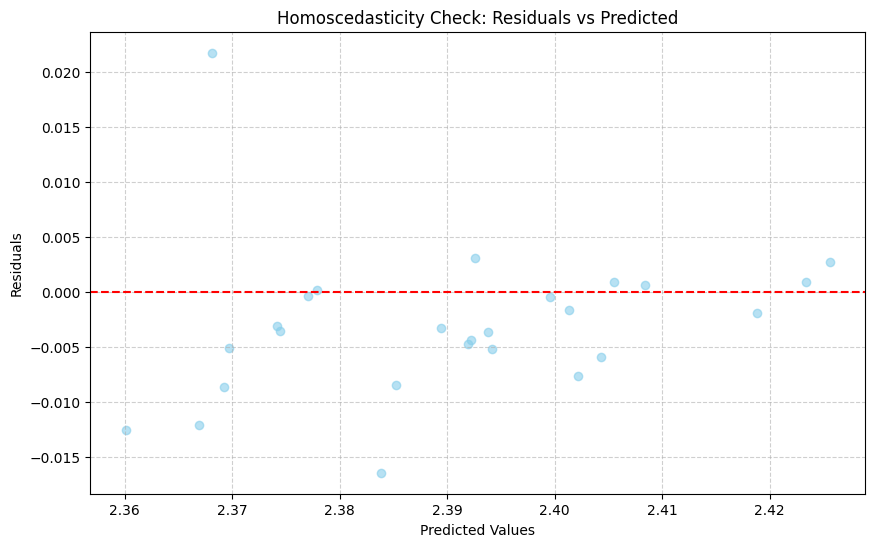

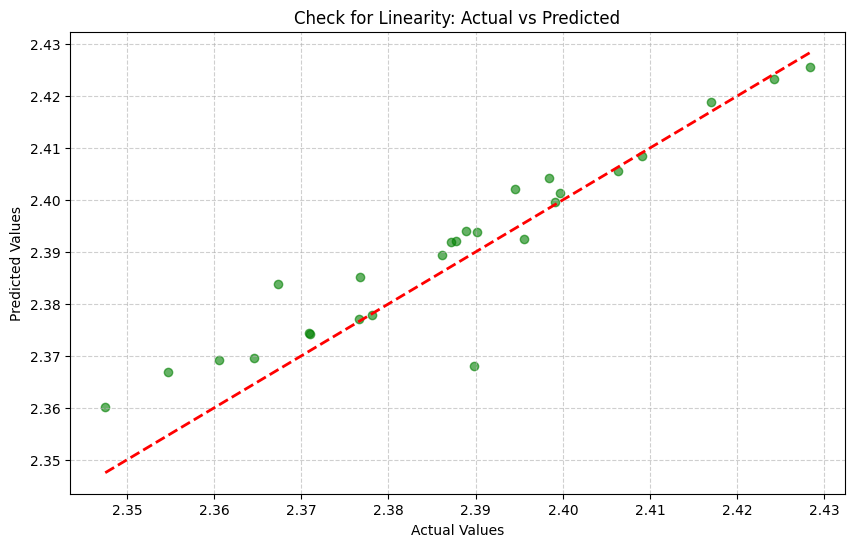

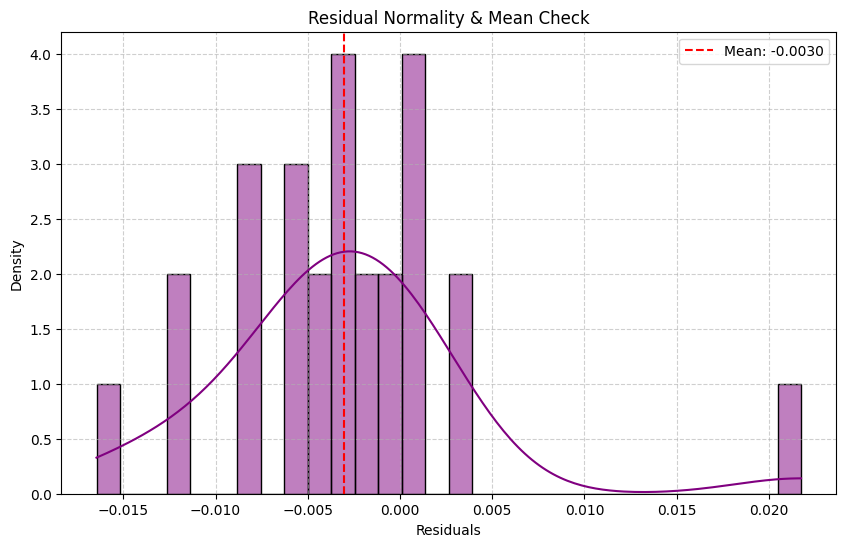

Mean of Residuals: -0.0030
Standard Deviation of Residuals: 0.0068


In [151]:
# 잔차(residuals) 계산
residuals = y_test - y_pred_R1

# Q-Q Plot
plt.figure(figsize=(10, 6))
sp.stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Homoscedasticity Check (잔차 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_R1, residuals, alpha=0.6, color='skyblue')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Homoscedasticity Check: Residuals vs Predicted')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Linearity (실제 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_R1, alpha=0.6, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r', linewidth=2)
plt.title('Check for Linearity: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Residual Normality & Mean
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color='purple', bins=30)
plt.axvline(x=np.mean(residuals), color='r', linestyle='--', label=f'Mean: {np.mean(residuals):.4f}')
plt.title('Residual Normality & Mean Check')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 추가적인 통계 정보
print(f"Mean of Residuals: {np.mean(residuals):.4f}")
print(f"Standard Deviation of Residuals: {np.std(residuals):.4f}")

In [152]:
# Shapiro-Wilk 검정 수행
stat, p_value = shapiro(residuals)

# 결과 출력
print(f"Shapiro-Wilk Test Statistic: {stat:.4f}")
print(f"P-value : {p_value:.4f}")
if p_value > 0.05:
    print("The distribution of residual is likely normal (fail to reject H0).\n")
else:
    print("The distribution of residual is not normal (reject H0).\n")

Shapiro-Wilk Test Statistic: 0.8652
P-value : 0.0029
The distribution of residual is not normal (reject H0).



#### RIDGE

In [153]:
# 데이터 준비
X = X_2.drop(['charges', 'cluster', 'smoker_yes'], axis=1)
y = np.log1p(X_2['charges'])

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Lasso()
param_grid = {
    'alpha': [0.009, 0.01, 0.02],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [12, 13, 14]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11L = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_11L = best_11L.predict(X_test)
intercept = best_11L.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_11L)
custom_loss = asymmetric_loss(y_test, y_pred_11L)
r2 = r2_score(y_test, y_pred_11L)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0.009, 'fit_intercept': True, 'max_iter': 12}
Mean Squared Error On Test: 0.0001
asymmetric loss On Test: 0.0001
R^2 Score On Test: 0.7944
Intercept (bias) of the model: 2.3348


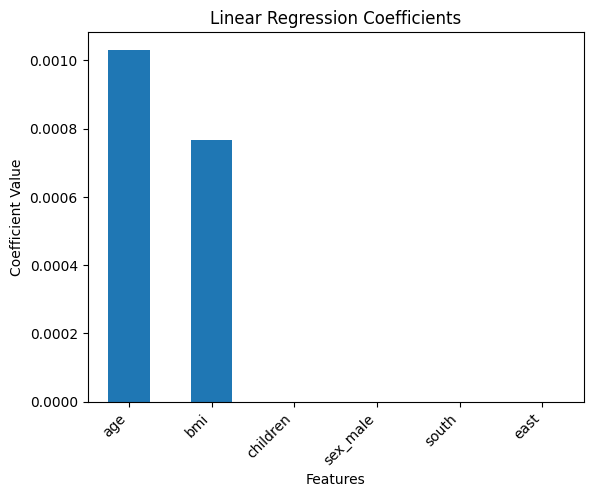

In [154]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11L.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

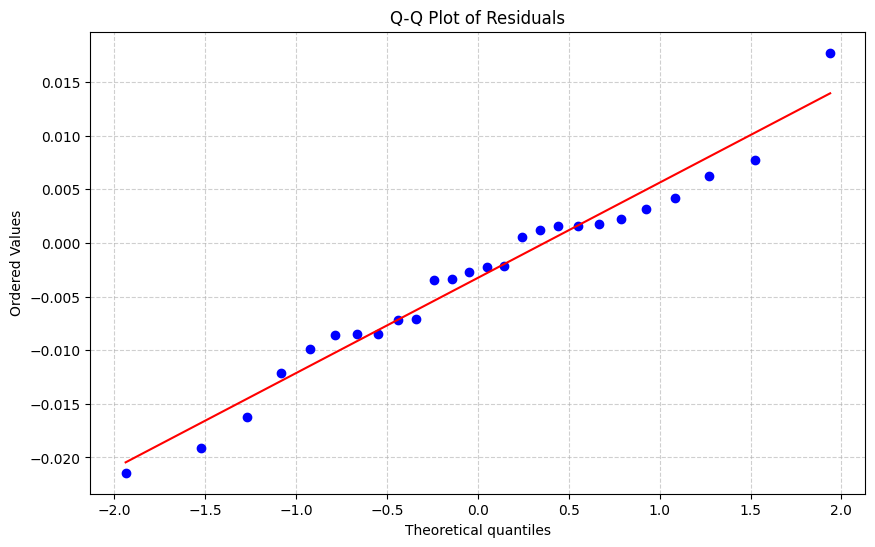

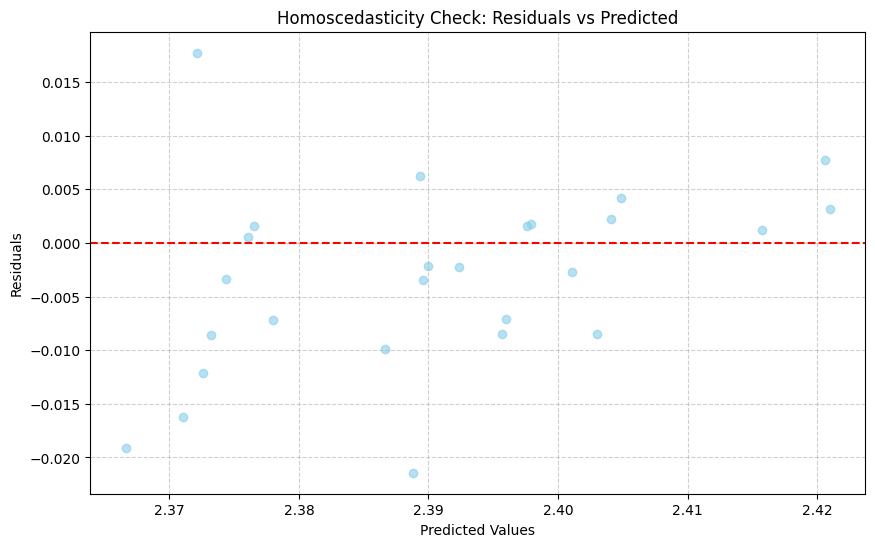

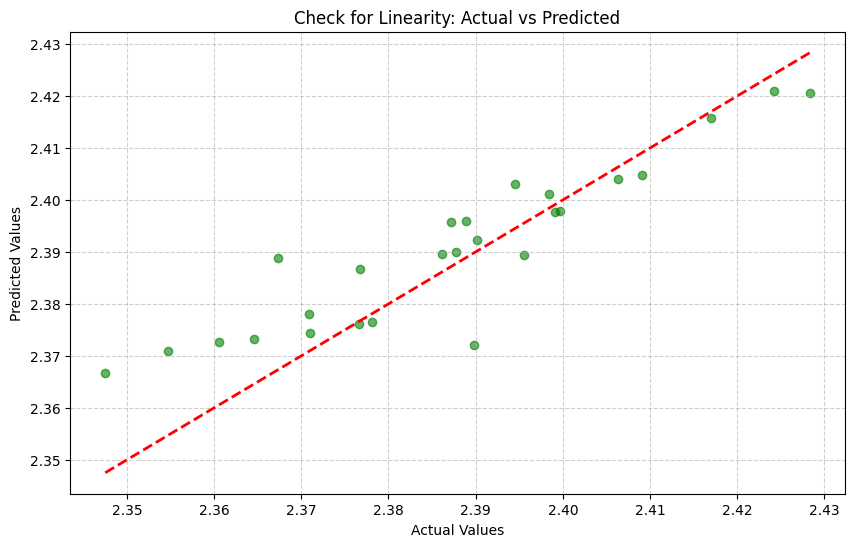

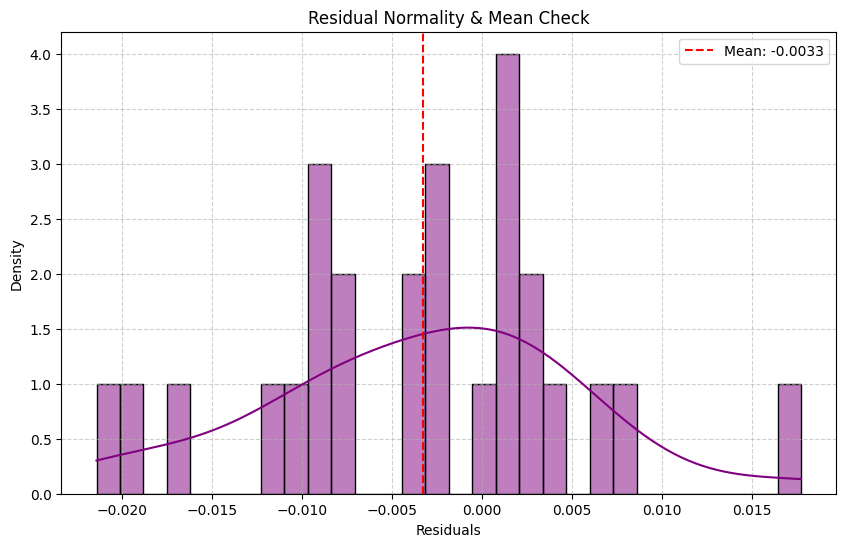

Mean of Residuals: -0.0033
Standard Deviation of Residuals: 0.0085


In [155]:
# 잔차(residuals) 계산
residuals = y_test - y_pred_11L

# Q-Q Plot
plt.figure(figsize=(10, 6))
sp.stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Homoscedasticity Check (잔차 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_11L, residuals, alpha=0.6, color='skyblue')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Homoscedasticity Check: Residuals vs Predicted')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Linearity (실제 vs 예측값)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_11L, alpha=0.6, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--r', linewidth=2)
plt.title('Check for Linearity: Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Check for Residual Normality & Mean
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True, color='purple', bins=30)
plt.axvline(x=np.mean(residuals), color='r', linestyle='--', label=f'Mean: {np.mean(residuals):.4f}')
plt.title('Residual Normality & Mean Check')
plt.xlabel('Residuals')
plt.ylabel('Density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 추가적인 통계 정보
print(f"Mean of Residuals: {np.mean(residuals):.4f}")
print(f"Standard Deviation of Residuals: {np.std(residuals):.4f}")

In [156]:
# Shapiro-Wilk 검정 수행
stat, p_value = shapiro(residuals)

# 결과 출력
print(f"Shapiro-Wilk Test Statistic: {stat:.4f}")
print(f"P-value : {p_value:.4f}")
if p_value > 0.05:
    print("The distribution of residual is likely normal (fail to reject H0).\n")
else:
    print("The distribution of residual is not normal (reject H0).\n")

Shapiro-Wilk Test Statistic: 0.9740
P-value : 0.7279
The distribution of residual is likely normal (fail to reject H0).



## 6. 어떤 데이터를 추가하면 좋을까?

- 직업
  - 미국 보험의 50%은 직장에서 가입하므로, 개인 보험에 가입하는 사람은 자영업자가 높을 것이라고 판단된다. 하지만, 정확한  
- 가족력
- 과거 질병
- 흡연 정도, 흡연 총력, 흡연 기종(연초, 권련형, 전자)
- 가입 보험 유형 (coverage)
- charges 지불 사유
- 세분화된 지역
  - 지역별 의료 비용/소득 수준의 차이 (ex. 베버리 힐즈 vs 할렘가)
  - 지역별 건강 상태 (ex. 공장지대, ...)
  - 지역별 공공 보건 프로그램의 차이
  - 지역별 보험 시장의 경쟁
- bmi가 아닌 다른 지표 (ex. 신체비만지수(BAI), 상대지방량(RFM), 허리둘레)
  - BMI의 가장 큰 한계점은 체중에만 의존하기에 체지방과 근육을 구별할 수 없다는 것이다.
  - 예로, 체지방량이 적고 근육량이 많은 운동선수는 체중이 많이 나가면서 BMI가 높아져 비만으로 분류된다.
반대로 체지방량이 많고 근육량이 적은 일반인은 BMI에 따라 정상으로 구분될 수 있다
- 가족 보험 가입자(children >= 1)가 57%를 차지하기 때문에 가족 건강 상태 또한 파악해야 한다
- 시계열 데이터

## 피드백 반영하여 몇가지 더 살펴보기

- 1. children의 인코딩 방법

- 2. 경사하강법 스케일링

- 3. 흡연자가 비흡연자보다 얼마나 저렴해야 하나

### children 인코딩 방법

- 선형 회귀 모델에서 독립 변수와 종속 변수 간에 선형 관계가 중요합니다. "children"이라는 범주형 변수가 종속 변수와 선형 관계가 없다면, 라벨 인코딩처럼 선형적인 관계를 암시하는 인코딩 방식은 적합하지 않을 수 있습니다

- 원핫인코딩, 이진인코딩과 같은 선형성이 암시되지 않은 방식을 사용하는 것이 성능적, 분석적 측면에서 유리하다

#### one-hot

In [157]:
train.head()

,age,bmi,children,charges,sex_male,smoker_yes,south,east
0,19,27.900,0,9.734236,False,True,1,0
1,18,33.770,1,7.453882,True,False,1,1
2,28,33.000,3,8.400763,True,False,1,1
3,33,22.705,0,9.998137,True,False,0,0
4,32,28.880,0,8.260455,True,False,0,0


In [158]:
train_oe = train.copy()
# 원핫 인코딩 적용 (train_oe)
train_oe = pd.get_dummies(train, columns=['children'], prefix='children')
train_oe.head()

,age,bmi,charges,sex_male,smoker_yes,south,east,children_0,children_1,children_2,children_3,children_4,children_5
0,19,27.900,9.734236,False,True,1,0,True,False,False,False,False,False
1,18,33.770,7.453882,True,False,1,1,False,True,False,False,False,False
2,28,33.000,8.400763,True,False,1,1,False,False,False,True,False,False
3,33,22.705,9.998137,True,False,0,0,True,False,False,False,False,False
4,32,28.880,8.260455,True,False,0,0,True,False,False,False,False,False


In [159]:
corr_oe = train_oe.corr()  # 원핫 인코딩된 상관계수
corr_oe

,age,bmi,charges,sex_male,smoker_yes,south,east,children_0,children_1,children_2,children_3,children_4,children_5
age,1.000000,0.109344,0.526900,-0.019814,-0.025587,-0.002884,-0.009363,-0.045892,0.009328,0.007453,0.060921,-0.002184,-0.030047
bmi,0.109344,1.000000,0.132831,0.046397,0.003746,0.235197,0.122050,-0.016079,-0.003738,0.024134,0.001249,0.016473,-0.020276
charges,0.526900,0.132831,1.000000,0.007022,0.665751,-0.023113,0.049683,-0.152821,-0.003161,0.101007,0.106831,0.038940,-0.012578
sex_male,-0.019814,0.046397,0.007022,1.000000,0.076596,0.012423,0.013934,-0.015978,0.008466,-0.000650,0.003423,0.015223,0.011845
smoker_yes,-0.025587,0.003746,0.665751,0.076596,1.000000,0.028915,0.063040,-0.009093,-0.023348,0.028077,0.039283,-0.029046,-0.043231
south,-0.002884,0.235197,-0.023113,0.012423,0.028915,1.000000,0.028301,-0.000864,0.021068,-0.002651,-0.041408,-0.009759,0.061346
east,-0.009363,0.122050,0.049683,0.013934,0.063040,0.028301,1.000000,0.027649,0.018421,-0.025348,-0.031563,-0.009552,-0.003409
children_0,-0.045892,-0.016079,-0.152821,-0.015978,-0.009093,-0.000864,0.027649,1.000000,-0.489777,-0.405073,-0.315893,-0.119546,-0.101168
children_1,0.009328,-0.003738,-0.003161,0.008466,-0.023348,0.021068,0.018421,-0.489777,1.000000,-0.264527,-0.206289,-0.078068,-0.066067
children_2,0.007453,0.024134,0.101007,-0.000650,0.028077,-0.002651,-0.025348,-0.405073,-0.264527,1.000000,-0.170613,-0.064566,-0.054641


In [160]:
# 데이터 준비
X = train_oe.drop('charges', axis=1)
y = train_oe['charges']

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Lasso()
param_grid = {
    'alpha': [0, 0.01, 0.1, 1, 2],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11L = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_11L = best_11L.predict(X_test)
intercept = best_11L.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_11L)
custom_loss = asymmetric_loss(y_test, y_pred_11L)
r2 = r2_score(y_test, y_pred_11L)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0, 'fit_intercept': True, 'max_iter': 3}
Mean Squared Error On Test: 0.1598
asymmetric loss On Test: 0.2588
R^2 Score On Test: 0.8278
Intercept (bias) of the model: 7.2646


- label 인코딩을 진행한 최고성능 모델 (case 2 : lasso)보다 성능이 미세하게 내려간 모습을 확인 가능하다

- 일반적으로 컬럼이 5개 증가한 것은 큰 문제(차원의 저주)가 되지 않지만, 데이터셋의 크기가 작은 경우에는 컬럼이 약간 증가해도 문제가 발생할 수 있다.

- 차원이 증가하면, 데이터가 각 차원에서 널리 퍼지게 되고, 이에 따라 모델이 데이터의 패턴을 일반화하기 어려워질 수 있습니다 -> overfitting

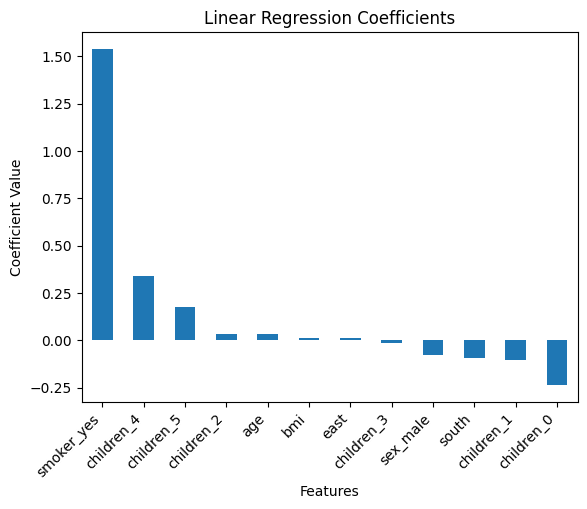

In [161]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11L.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

#### binary

In [162]:
def binary_encoding_children(df, column):
    """
    Binary encodes the specified column of the dataframe based on its integer values.
    The encoded values are stored in new columns with names indicating the binary place value.

    Parameters:
    - df: DataFrame containing the data.
    - column: The name of the column to encode.

    Returns:
    - DataFrame with binary encoded columns added.
    """
    # Find the maximum value in the column to determine the number of bits needed
    max_value = int(df[column].max())  # Convert to regular int to use bit_length()
    # Determine the number of bits needed to represent the maximum value
    num_bits = max_value.bit_length()

    # Generate binary column names based on the number of bits
    binary_columns = [f'{column}_{2**i}' for i in reversed(range(num_bits))]

    # Convert the specified column values to binary and expand them into separate columns
    binary_encoded = df[column].apply(lambda x: list(map(int, format(x, f'0{num_bits}b'))))

    # Convert the list of binary digits into a DataFrame with appropriate column names
    binary_encoded_df = pd.DataFrame(binary_encoded.tolist(), columns=binary_columns)

    # Concatenate the original DataFrame with the new binary encoded DataFrame
    df = pd.concat([df, binary_encoded_df], axis=1)

    return df

In [163]:
train_be = binary_encoding_children(train, 'children')
train_be.drop('children', axis=1, inplace=True)
train_be = train_be.fillna(0)
train_be.head()

,age,bmi,charges,sex_male,smoker_yes,south,east,children_4,children_2,children_1
0,19.0,27.900,9.734236,False,True,1.0,0.0,0.0,0.0,0.0
1,18.0,33.770,7.453882,True,False,1.0,1.0,0.0,0.0,1.0
2,28.0,33.000,8.400763,True,False,1.0,1.0,0.0,1.0,1.0
3,33.0,22.705,9.998137,True,False,0.0,0.0,0.0,0.0,0.0
4,32.0,28.880,8.260455,True,False,0.0,0.0,0.0,0.0,0.0


In [164]:
corr_be = train_be.corr()  # 이진 인코딩된 상관계수
corr_be

,age,bmi,charges,sex_male,smoker_yes,south,east,children_4,children_2,children_1
age,1.000000,0.118382,0.527003,-0.017647,-0.024453,-0.000729,-0.007189,-0.014239,0.086421,0.050487
bmi,0.118382,1.000000,0.162628,0.049705,0.005601,0.236751,0.124696,0.006751,-0.008311,0.028153
charges,0.527003,0.162628,1.000000,0.013991,0.646151,-0.014931,0.055293,0.014700,0.067106,0.055103
sex_male,-0.017647,0.049705,0.013991,1.000000,0.076942,0.013191,0.014699,-0.005872,-0.027096,0.028631
smoker_yes,-0.024453,0.005601,0.646151,0.076942,1.000000,0.029292,0.063400,-0.008461,-0.017429,0.018434
south,-0.000729,0.236751,-0.014931,0.013191,0.029292,1.000000,0.029071,0.007269,-0.011243,0.024866
east,-0.007189,0.124696,0.055293,0.014699,0.063400,0.029071,1.000000,-0.009417,-0.029912,0.063125
children_4,-0.014239,0.006751,0.014700,-0.005872,-0.008461,0.007269,-0.009417,1.000000,-0.118359,0.017205
children_2,0.086421,-0.008311,0.067106,-0.027096,-0.017429,-0.011243,-0.029912,-0.118359,1.000000,0.030250
children_1,0.050487,0.028153,0.055103,0.028631,0.018434,0.024866,0.063125,0.017205,0.030250,1.000000


인코딩 된 값에 대한 강한 상관 없음

In [165]:
# 데이터 준비
X = train_be.drop('charges', axis=1)
y = train_be['charges']

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Ridge 회귀 모델과 하이퍼파라미터 그리드 설정
model = Lasso()
param_grid = {
    'alpha': [0, 0.01, 0.1, 1, 2],  # 정규화 강도 조절
    'fit_intercept': [True, False],    # 절편 포함 여부
    'max_iter': [1, 2, 3, 4, 5]
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error')

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_11L = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_11L = best_11L.predict(X_test)
intercept = best_11L.intercept_

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_11L)
custom_loss = asymmetric_loss(y_test, y_pred_11L)
r2 = r2_score(y_test, y_pred_11L)


print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {intercept:.4f}")

Best hyperparameters: {'alpha': 0, 'fit_intercept': True, 'max_iter': 5}
Mean Squared Error On Test: 0.2143
asymmetric loss On Test: 0.3568
R^2 Score On Test: 0.7373
Intercept (bias) of the model: 6.7776


- 성능이 크게 감소한 모습을 확인 가능하다

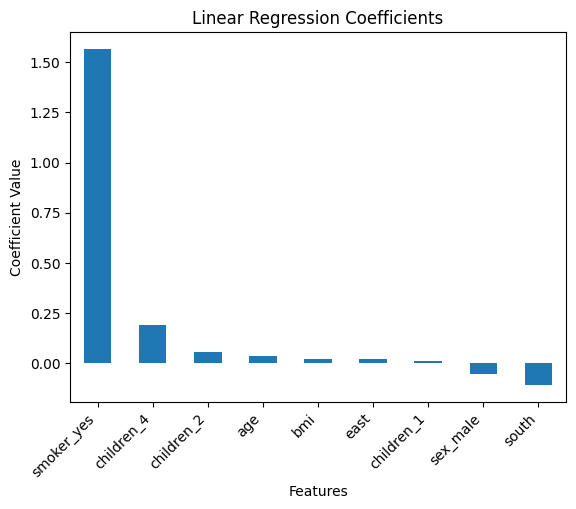

In [166]:
# 회귀 계수 확인
coefficients = pd.DataFrame(best_11L.coef_, X.columns, columns=['Coefficient'])

coefficients.sort_values(by='Coefficient', ascending=False).plot(kind='bar', legend=False)
plt.title('Linear Regression Coefficients')
plt.ylabel('Coefficient Value')
plt.xlabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

해석이 쉽지 않으며, 성능도 너무 떨어진다

### 2. 경사하강법 스케일링

- 경사하강법은 각 피처(feature)의 기울기(gradient)를 계산하여 가중치를 업데이트합니다. 피처의 스케일(크기)이 다르면 각 피처가 모델 학습에 주는 영향이 다르게 됩니다. 큰 값의 피처는 작은 값의 피처보다 더 큰 기울기를 만들어내므로 경사하강법이 큰 값의 피처에 더 집중하게 되고, 학습 과정이 비효율적이거나 비정상적으로 느려질 수 있습니다

- 스케일링을 하지 않으면 경사하강법의 경로가 '지그재그' 모양으로 비효율적으로 움직일 수 있습니다. 반면, 스케일링을 하면 경사하강법의 경로가 더 매끄럽고 효율적으로 목표로 수렴하게 됩니다. 즉, 스케일링은 손실 함수의 등고선을 더 원형에 가깝게 만들어 경사하강법이 더 안정적으로 동작하게 합니다

- 모델이 피처들을 학습할 때, 스케일이 큰 피처는 작은 피처보다 더 많은 기여를 하게 됩니다. 스케일링을 통해 모든 피처가 비슷한 범위 내에 있도록 하면, 모든 피처가 모델에 기여할 기회가 공평해집니다

- 독립변수는 경사하강법의 효율성을 위해 스케일링을 하되, 종속변수는 문제의 성격과 모델에 맞게 필요할 때만 스케일링하거나 변환을 고려하는 것이 좋습니다

In [167]:
train_gd = train.copy()

# 스케일링할 컬럼 리스트
columns_to_scale = ['age', 'bmi', 'children']

# MinMaxScaler 객체 생성
scaler = MinMaxScaler()

# 스케일링 적용
train_gd[columns_to_scale] = scaler.fit_transform(train_gd[columns_to_scale])

train_gd.head()

,age,bmi,children,charges,sex_male,smoker_yes,south,east
0,0.021739,0.321227,0.0,9.734236,False,True,1,0
1,0.000000,0.479150,0.2,7.453882,True,False,1,1
2,0.217391,0.458434,0.6,8.400763,True,False,1,1
3,0.326087,0.181464,0.0,9.998137,True,False,0,0
4,0.304348,0.347592,0.0,8.260455,True,False,0,0


In [168]:
# 데이터 준비
X = train_gd.drop('charges', axis=1)
y = train_gd['charges']

# 훈련 및 테스트 데이터 분할
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = KerasRegressor(model=gd_model, verbose=0)

# make_scorer를 사용하여 커스텀 스코어링 함수로 변환
scoring = make_scorer(asymmetric_loss_scorer, greater_is_better=False)  # 작을수록 좋으므로 False 설정

# 하이퍼파라미터 그리드 설정
param_grid = {
    'model__learning_rate': [0.01, 0.05, 0.1],  # 튜닝할 학습률
    'epochs': [100, 300]  # 튜닝할 에포크 수
}

# GridSearchCV 설정 (교차 검증 5-폴드)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring=scoring)

# 그리드 서치 실행 (훈련 데이터에 대해)
grid_search.fit(X_train, y_train)

# 최적의 하이퍼파라미터와 모델
best_params = grid_search.best_params_
best_model_12 = grid_search.best_estimator_

print(f"Best hyperparameters: {best_params}")

# 최적 모델을 사용해 테스트 데이터에 대한 예측
y_pred_12 = best_model_12.predict(X_test)

# 테스트 데이터에 대한 성능 평가 (결정계수 R^2)
mse = mean_squared_error(y_test, y_pred_12)
custom_loss = asymmetric_loss(y_test, y_pred_12)
r2 = r2_score(y_test, y_pred_12)
weights, biases = best_model_12.model_.get_weights()

print(f"Mean Squared Error On Test: {mse:.4f}")
print(f"asymmetric loss On Test: {custom_loss:.4f}")
print(f"R^2 Score On Test: {r2:.4f}")
print(f"Intercept (bias) of the model: {biases[0]:.4f}")

Best hyperparameters: {'epochs': 300, 'model__learning_rate': 0.01}
Mean Squared Error On Test: 0.1963
asymmetric loss On Test: 0.2597
R^2 Score On Test: 0.7885
Intercept (bias) of the model: 8.0165


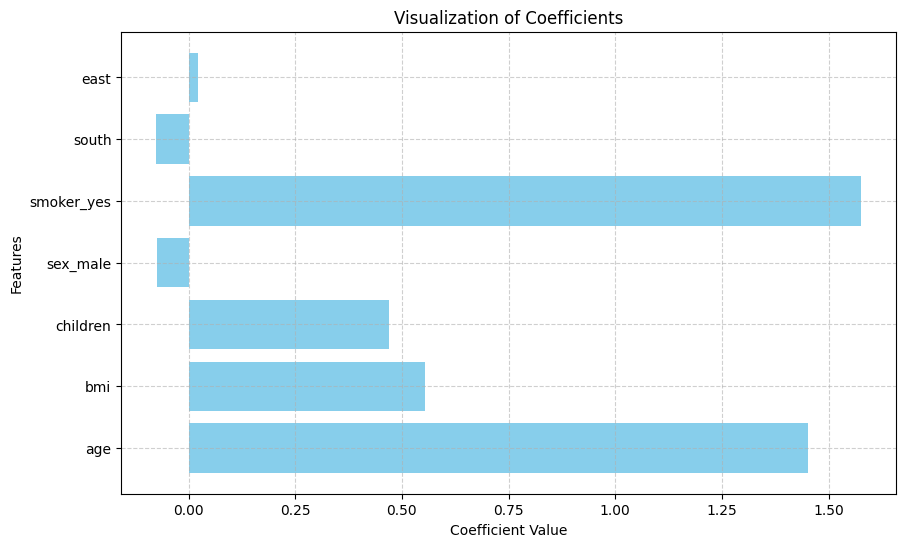

In [169]:
# 독립변수 이름 추출
feature_names = X.columns  # X는 DataFrame이어야 합니다.
weights, biases = best_model_12.model_.get_weights()
# 회귀 계수 시각화 (가중치만 사용)
plt.figure(figsize=(10, 6))
plt.barh(feature_names, weights.flatten(), color='skyblue')
plt.xlabel('Coefficient Value')
plt.ylabel('Features')
plt.title('Visualization of Coefficients')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

성능에 큰 차이는 없지만, 속도가 매우 개선되었으며, epoch도 많이 줄었음

### 3. 흡연자가 비흡연자보다 얼마나 저렴해야 하나

- 파생변수 : BMI * smoker_yes 데이터

- y = ... + w_3BMI + w_4BMI*흡연 + w_5

- w_4 - w_3 흡연자에게 얼마를 더 부여해야 하나?

In [192]:
train_bs = train.copy()
train_bs["bs"] = train['bmi'] * train['smoker_yes']
train_bs.head(10)

,age,bmi,children,charges,sex_male,smoker_yes,south,east,bs
0,19,27.900,0,9.734236,False,True,1,0,27.9
1,18,33.770,1,7.453882,True,False,1,1,0.0
2,28,33.000,3,8.400763,True,False,1,1,0.0
3,33,22.705,0,9.998137,True,False,0,0,0.0
4,32,28.880,0,8.260455,True,False,0,0,0.0
5,31,25.740,0,8.231541,False,False,1,1,0.0
6,46,33.440,1,9.016949,False,False,1,1,0.0
7,37,27.740,3,8.893230,False,False,0,0,0.0
8,37,29.830,2,8.765211,True,False,0,1,0.0
9,60,25.840,0,10.272432,False,False,0,0,0.0


In [171]:
ProfileReport(train_bs, title="Profiling Report :: medical cost personal dataset")

Output hidden; open in https://colab.research.google.com to view.

Text(0.5, 1.0, 'Scatter plot of Charges vs age(smoker)')

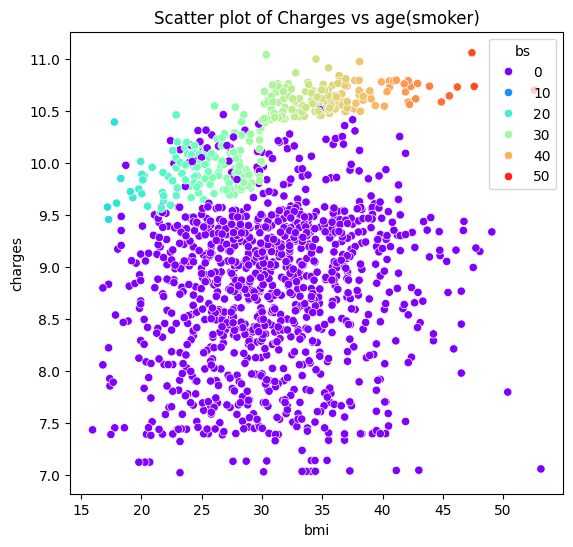

In [172]:
f = plt.figure(figsize=(14,6))
ax = f.add_subplot(121)
sns.scatterplot(x='bmi',y='charges',data=train_bs,palette='rainbow',hue='bs',ax=ax)
ax.set_title('Scatter plot of Charges vs age(smoker)')

bs가 0인 사용자들은

VIF 계산

In [195]:
# 상수항 추가 (VIF 계산을 위해 필요)
# True를 1로, False를 0으로 변환
train_bs = train_bs.replace({True: 1, False: 0})
train_be_with_constant = add_constant(train_bs)

In [174]:
# VIF 계산
vif_df = pd.DataFrame()
vif_df['Variable'] = train_be_with_constant.columns
vif_df['VIF'] = [variance_inflation_factor(train_be_with_constant.values, i) for i in range(train_be_with_constant.shape[1])]

# 결과 출력
print(vif_df)

     Variable         VIF
0       const  331.138327
1         age    2.317964
2         bmi    1.374554
3    children    1.087906
4     charges    4.599585
5    sex_male    1.021599
6  smoker_yes   25.219881
7       south    1.078688
8        east    1.022639
9          bs   27.351193


#### smoker_yes와 bs의 상관계수가 1에 근접하기 때문에 당연하게 VIF가 하늘을 뚫고 올라간다

In [196]:
X = train_bs.drop('charges', axis=1)
y = train_bs['charges']

model = sm.OLS(y, X).fit()
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:                charges   R-squared (uncentered):                   0.982
Model:                            OLS   Adj. R-squared (uncentered):              0.982
Method:                 Least Squares   F-statistic:                              8985.
Date:                Mon, 16 Sep 2024   Prob (F-statistic):                        0.00
Time:                        05:46:58   Log-Likelihood:                         -2176.4
No. Observations:                1337   AIC:                                      4369.
Df Residuals:                    1329   BIC:                                      4410.
Df Model:                           8                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [179]:
def calculate_cv(coefficients):
    mean = np.mean(coefficients)
    std_dev = np.std(coefficients)
    cv = (std_dev / mean) * 100
    return cv

In [197]:
# 반복 횟수 설정
n_iterations = 100

# 특정 독립 변수의 회귀 계수 추적을 위한 리스트 초기화
coefficients_sy = []
coefficients_bs = []
coefficients_age = []
coefficients_bmi = []

# 반복하여 train_test_split 실행 및 회귀 모델 적합
for _ in range(n_iterations):
    # 데이터 분할
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=None)

    # 상수항 추가
    X_train = sm.add_constant(X_train)

    # OLS 모델 적합
    model = sm.OLS(y_train, X_train).fit()

    # 특정 독립 변수의 회귀 계수 추적
    coefficients_sy.append(model.params['smoker_yes'])
    coefficients_bs.append(model.params['bs'])
    coefficients_age.append(model.params['age'])
    coefficients_bmi.append(model.params['bmi'])

# 결과 확인
print("smoker_yes 계수 CV:", calculate_cv(coefficients_sy))
print("bs 계수 CV:", calculate_cv(coefficients_bs))
print("age(다중공선성 없음) 계수 CV:", calculate_cv(coefficients_age))
print("bmi(다중공선성 없음) 계수 CV:", calculate_cv(coefficients_bmi))

smoker_yes 계수 CV: 43.276694312885276
bs 계수 CV: 4.868186939464567
age(다중공선성 없음) 계수 CV: 1.4170507422591216
bmi(다중공선성 없음) 계수 CV: 39.128056854799794


In [199]:
# 결과 출력
print(f"smoker_yes와 bs의 회귀 계수 간 상관계수: {np.corrcoef(coefficients_sy, coefficients_bs)[0, 1]}")

# 결과 출력
print(f"smoker_yes와 age의 회귀 계수 간 상관계수: {np.corrcoef(coefficients_sy, coefficients_age)[0, 1]}")

# 결과 출력
print(f"smoker_yes와 bmi의 회귀 계수 간 상관계수: {np.corrcoef(coefficients_sy, coefficients_bmi)[0, 1]}")

# 결과 출력
print(f"bs와 bmi의 회귀 계수 간 상관계수: {np.corrcoef(coefficients_bs, coefficients_bmi)[0, 1]}")

smoker_yes와 bs의 회귀 계수 간 상관계수: -0.967243044612761
smoker_yes와 age의 회귀 계수 간 상관계수: 0.04171367274240204
smoker_yes와 bmi의 회귀 계수 간 상관계수: 0.5325285376487464
bs와 bmi의 회귀 계수 간 상관계수: -0.555334583967244


- 회귀계수끼리 강한 음의 상관관계를 가지는 것은, 특정 회귀계수의 값이 클 때 다른 회귀계수의 값은 줄어든다는 것을 의미한다.

- 이 현상은 다중공선성이 있을 때 발생하며, 두 독립 변수가 서로 대체 관계에 있을 때 계수 간의 보완적 변동을 나타낸다.

- 이러한 음의 상관관계는 OLS를 여러 번 진행한 후 사후적으로 다중공선성 문제를 확인할 수 있는 방법이다. 다중공선성은 회귀 계수를 불안정하게 하여 일관되지 않은 값을 출력하게 만들고, 그 결과 분석의 정확성을 떨어뜨릴 수 있다.

#### bs를 사용하지 않고 진행한 결과

In [200]:
X = train_bs.drop(['charges', 'bs'], axis=1)
y = train_bs['charges']

model = sm.OLS(y, X).fit()
print(model.summary())

                                 OLS Regression Results                                
Dep. Variable:                charges   R-squared (uncentered):                   0.980
Model:                            OLS   Adj. R-squared (uncentered):              0.980
Method:                 Least Squares   F-statistic:                              9272.
Date:                Mon, 16 Sep 2024   Prob (F-statistic):                        0.00
Time:                        05:47:50   Log-Likelihood:                         -2243.8
No. Observations:                1337   AIC:                                      4502.
Df Residuals:                    1330   BIC:                                      4538.
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [201]:
# 반복 횟수 설정
n_iterations = 100

# 특정 독립 변수의 회귀 계수 추적을 위한 리스트 초기화
coefficients_sy = []
coefficients_age = []
coefficients_bmi = []

# 반복하여 train_test_split 실행 및 회귀 모델 적합
for _ in range(n_iterations):
    # 데이터 분할
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=None)

    # 상수항 추가
    X_train = sm.add_constant(X_train)

    # OLS 모델 적합
    model = sm.OLS(y_train, X_train).fit()

    # 특정 독립 변수의 회귀 계수 추적
    coefficients_sy.append(model.params['smoker_yes'])
    coefficients_age.append(model.params['age'])
    coefficients_bmi.append(model.params['bmi'])

# 결과 확인
print("smoker_yes 계수 CV:", calculate_cv(coefficients_sy))
print("age(다중공선성 없음) 계수 CV:", calculate_cv(coefficients_age))
print("bmi(다중공선성 없음) 계수 CV:", calculate_cv(coefficients_bmi))

smoker_yes 계수 CV: 1.1881624540799551
age(다중공선성 없음) 계수 CV: 1.4434790740885206
bmi(다중공선성 없음) 계수 CV: 7.795155384591015


In [203]:
# 결과 출력
print(f"smoker_yes와 age의 회귀 계수 간 상관계수: {np.corrcoef(coefficients_sy, coefficients_age)[0, 1]}")

# 결과 출력
print(f"smoker_yes와 bmi의 회귀 계수 간 상관계수: {np.corrcoef(coefficients_sy, coefficients_bmi)[0, 1]}")

# 결과 출력
print(f"age와 bmi의 회귀 계수 간 상관계수: {np.corrcoef(coefficients_age, coefficients_bmi)[0, 1]}")

smoker_yes와 age의 회귀 계수 간 상관계수: 0.16078655566143296
smoker_yes와 bmi의 회귀 계수 간 상관계수: 0.15592870440272086
age와 bmi의 회귀 계수 간 상관계수: -0.4656008991846421
